https://medium.com/geekculture/xgboost-versus-random-forest-898e42870f30

https://towardsdatascience.com/time-series-forecasting-with-machine-learning-b3072a5b44ba

https://lightgbm.readthedocs.io/en/latest/Parameters.html

https://analyticsindiamag.com/deep-learning-xgboost-or-both-what-works-best-for-tabular-data/ and https://arxiv.org/abs/2207.08815

Gradient Boosting 
- Boosting: Boosting is an ensemble learning technique where multiple weak learners (usually decision trees) are combined to create a strong learner. The weak learners are trained sequentially, with each one focusing on the mistakes of its predecessors. 
- Boosting happens to be iterative learning which means the model will predict something initially and self analyses its mistakes as a predictive toiler and give more weightage to the data points in which it made a wrong prediction in the next iteration
-  Gradient Boosting is a specific variant of boosting that uses gradients  (the gradient of the loss function) to optimize the model's performance
- Gradient descent is a first-order iterative optimization algorithm for finding a local minimum of a differentiable function (different types of loss functions can be used)

The LightGBM Regressor:
- ML model that can predict numerical values (regression) based on input features. It works by creating a decision tree ensemble in a way that optimizes training speed and memory usage. It leverages gradient-based techniques to efficiently handle large datasets, making it suitable for time series forecasting tasks like predicting energy production or other continuous numeric variables.
- uses a different approach to tree building known as the Gradient-based One-Side Sampling (GOSS) algorithm. It also uses a histogram-based algorithm to bucket feature values, which can lead to faster training times compared to XGBoost. 
-  designed to take advantage of parallelism on both CPUs and GPUs, making it potentially faster in certain scenarios, especially on GPU hardware.

In [1]:
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from IPython.core.magic import register_cell_magic
import black
from statsmodels.tsa.stattools import adfuller
import plotly.graph_objects as go
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.seasonal import seasonal_decompose
from tqdm import tqdm_notebook
import numpy as np
import os
import statsmodels.api as sm
import seaborn as sns
from scipy.stats import weibull_min
from itertools import product
import warnings
warnings.filterwarnings('ignore')
from lightgbm import LGBMRegressor, LGBMClassifier, Booster
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Image, Table, TableStyle
from reportlab.lib import colors
%matplotlib inline

In [56]:
@register_cell_magic
def blackify(line, cell):
    formatted_code = black.format_str(cell, mode=black.FileMode())
    exec(formatted_code, globals())

# Hyperparameter Tuning of LightGBM

Default parameters of XGBoost:
- num_leaves: 31
- max_depth: -1 (no limit)
- learning_rate: 0.1
- n_estimators: 100
- min_child_samples: 20
- reg_alpha: 0.0

In [5]:
#%%blackify
def hyperparameter_tuning_with_random_search(df, num_iterations, param_search_space, horizon=24):
    X = df.drop('ActivePower', axis=1)
    y = df['ActivePower']
    
    # take last week of the dataset for validation
    X_train, X_test = X.iloc[:-horizon, :], X.iloc[-horizon:, :]
    y_train, y_test = y.iloc[:-horizon], y.iloc[-horizon:]
    
    # Initialize a list to store the results of each iteration
    results = []
    
    for i in range(num_iterations):
        # Sample random hyperparameters from the search space
        params = {param: np.random.choice(values) for param, values in param_search_space.items()}
        
        # Create and train the model with the sampled hyperparameters
        model = LGBMRegressor(random_state=42, **params)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Calculate evaluation metrics (MAE, MSE, MAPE)
        mae = np.round(mean_absolute_error(y_test, predictions), 3)
        mse = np.round(mean_squared_error(y_test, predictions), 3)
        mape = np.round(np.mean(np.abs((y_test - predictions) / y_test)) * 100, 3)
        
        # Store the results of the iteration in the 'results' list
        results.append({'Iteration': i+1, 'Hyperparameters': params, 'MAE': mae, 'MSE': mse, 'MAPE': mape})
        
        # Print the trial number and evaluation metrics before each plot
        print(f"\nTrial {i+1} - MAE: {mae}, MSE: {mse}, MAPE: {mape}%")
        
        # Plot reality vs prediction for the last week of the dataset
        fig = plt.figure(figsize=(16, 8))
        plt.title(f'Real vs Prediction - MAE {mae}', fontsize=20)
        plt.plot(y_test, color='red', label='Real')
        plt.plot(pd.Series(predictions, index=y_test.index), color='green', label='Prediction')
        plt.xlabel('Hour', fontsize=16)
        plt.ylabel('Number of Shared Bikes', fontsize=16)
        plt.legend(fontsize=16)
        plt.grid()
        plt.show()

    # Sort the results based on the MSE values in ascending order
    sorted_results_mse = sorted(results, key=lambda x: x['MSE'])
    
    # Print the best 5 trials with lower MSE values
    print("\nBest 5 trials based on lower MSE values:")
    for i in range(min(5, num_iterations)):
        print(f"Iteration {sorted_results_mse[i]['Iteration']} - MSE: {sorted_results_mse[i]['MSE']}")
        print(f"Hyperparameters: {sorted_results_mse[i]['Hyperparameters']}")
        print("----------------------------------------------------")

    # Sort the results based on the MAPE values in ascending order
    sorted_results_mape = sorted(results, key=lambda x: x['MAPE'])
    
    # Print the best 5 trials with lower MAPE values
    print("\nBest 5 trials based on lower MAPE values:")
    for i in range(min(5, num_iterations)):
        print(f"Iteration {sorted_results_mape[i]['Iteration']} - MAPE: {sorted_results_mape[i]['MAPE']}%")
        print(f"Hyperparameters: {sorted_results_mape[i]['Hyperparameters']}")
        print("----------------------------------------------------")
    

# Define the parameter search space
param_search_space = {
    'learning_rate': [0.01, 0.001,0.1],
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [5, 10, 15, 20],
    'num_leaves': [20, 30, 40, 50],
    'min_child_samples': [10, 20, 30, 40],
    'reg_alpha': [0.0, 0.1, 0.5, 1.0]
}

# Assuming you have already loaded and preprocessed the data in 'df'
num_iterations = 1000
#hyperparameter_tuning_with_random_search(df, num_iterations, param_search_space)


Best 5 trials based on lower MSE values:
Iteration 763 - MSE: 101901.974
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 200, 'max_depth': 15, 'num_leaves': 50, 'min_child_samples': 10, 'reg_alpha': 0.0}
----------------------------------------------------
Iteration 46 - MSE: 101902.036
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 200, 'max_depth': 15, 'num_leaves': 50, 'min_child_samples': 10, 'reg_alpha': 0.1}
----------------------------------------------------
Iteration 465 - MSE: 101902.036
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 200, 'max_depth': 15, 'num_leaves': 50, 'min_child_samples': 10, 'reg_alpha': 0.1}
----------------------------------------------------
Iteration 429 - MSE: 101903.157
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 200, 'max_depth': 15, 'num_leaves': 50, 'min_child_samples': 10, 'reg_alpha': 0.5}
----------------------------------------------------
Iteration 638 - MSE: 101908.211
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 200, 'max_depth': 10, 'num_leaves': 50, 'min_child_samples': 10, 'reg_alpha': 1.0}
----------------------------------------------------

Best 5 trials based on lower MAPE values:
Iteration 24 - MAPE: 37.656%
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 50, 'max_depth': 20, 'num_leaves': 50, 'min_child_samples': 30, 'reg_alpha': 1.0}
----------------------------------------------------
Iteration 25 - MAPE: 37.656%
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 50, 'max_depth': 10, 'num_leaves': 50, 'min_child_samples': 30, 'reg_alpha': 0.1}
----------------------------------------------------
Iteration 61 - MAPE: 37.656%
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 50, 'max_depth': 20, 'num_leaves': 50, 'min_child_samples': 30, 'reg_alpha': 0.5}
----------------------------------------------------
Iteration 195 - MAPE: 37.656%
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 50, 'max_depth': 10, 'num_leaves': 50, 'min_child_samples': 30, 'reg_alpha': 0.0}
----------------------------------------------------
Iteration 292 - MAPE: 37.656%
Hyperparameters: {'learning_rate': 0.001, 'n_estimators': 50, 'max_depth': 10, 'num_leaves': 50, 'min_child_samples': 30, 'reg_alpha': 0.1}
----------------------------------------------------

# Creating Lag features and rolling statistics

Lag features involve using past values of the target variable (in this case, ActivePower and WindSpeed) as new features, while rolling statistics compute statistics (e.g., mean, standard deviation) over a window of past values. Both lag features and rolling statistics can capture temporal patterns and dependencies in time-series data

These lines create new columns ActivePower_lag1 and WindSpeed_lag1 in the DataFrame df, where the values of ActivePower and WindSpeed are shifted by 6 time steps (rows) backward. This means that for each row, the corresponding value from 6 time steps ago is placed in the new column. This creates lag features that can capture the historical behavior of the variables, which can be useful for time series forecasting.

These lines create new columns ActivePower_mean_rolling2, ActivePower_std_rolling2, WindSpeed_mean_rolling2, and WindSpeed_std_rolling2 in the DataFrame df. The rolling statistics are computed over a rolling window of 2 time steps (rows). For each row, the mean and standard deviation of the ActivePower and WindSpeed values within the last 2 time steps are calculated and stored in the corresponding new columns. Rolling statistics can help capture short-term trends and fluctuations in the data, which can also be relevant for time series forecasting.

In [7]:
file_path_1 = ""
df= pd.read_csv(file_path_1, sep='\t')

# Convert 'DATE' column to datetime type and set it as the index
df['DATE'] = pd.to_datetime(df['DATE'])
df.set_index('DATE', inplace=True)

# Create lag features for ActivePower and WindSpeed with a lag of 6
df['ActivePower_lag1'] = df['ActivePower'].shift(6)
df['WindSpeed_lag1'] = df['WindSpeed'].shift(6)

# Create rolling statistics (mean and standard deviation) for ActivePower and WindSpeed over a window of 2 time steps
df['ActivePower_mean_rolling2'] = df['ActivePower'].rolling(window=2).mean()
df['ActivePower_std_rolling2'] = df['ActivePower'].rolling(window=2).std()
df['WindSpeed_mean_rolling2'] = df['WindSpeed'].rolling(window=2).mean()
df['WindSpeed_std_rolling2'] = df['WindSpeed'].rolling(window=2).std()

#df.head()


For the lag features (df['ActivePower_lag1'] and df['WindSpeed_lag1']), if lag is of 144 time steps,  corresponds to a 1440-minute lag in the data (assuming each time step represents 10 minutes). This means we are using the value of ActivePower and WindSpeed from 1440 minutes (24 hours) ago as features to predict the current value.

To find the best lag value, you can try different lag values (e.g., 12, 24, 48, etc.) and evaluate the model's performance with each choice. 

# Hyperparameter tuning of lags and window values

In [38]:
def train_time_series_with_folds(df, horizon=48):
    #df.drop(['WF', 'WT','Index'], axis=1, inplace=True)
    df['DATE'] = pd.to_datetime(df['DATE'])
    #set datetime as index
    df = df.set_index(df.DATE)
    #drop datetime column
    df.drop('DATE', axis=1, inplace=True)

    #create hour, day and month variables from datetime index
    df['hour'] = df.index.hour
    df['day'] = df.index.day
    df['month'] = df.index.month
    X = df.drop('ActivePower', axis=1)
    y = df['ActivePower']

    # Take last part of the dataset for validation
    X_train, X_test = X.iloc[:-horizon, :], X.iloc[-horizon:, :]
    y_train, y_test = y.iloc[:-horizon], y.iloc[-horizon:]

    # Create, train and do inference of the model
    model = LGBMRegressor(random_state=42)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Calculate MAE
    mae = np.round(mean_absolute_error(y_test, predictions), 3)
    print(f'Mean Absolute Error (MAE): {mae}')

    # Calculate MSE
    mse = np.round(mean_squared_error(y_test, predictions), 3)
    print(f'Mean Squared Error (MSE): {mse}')

    # Calculate MAPE
    mape = np.round(np.mean(np.abs((y_test - predictions) / y_test)) * 100, 3)
    print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

    # Plot reality vs prediction for the last week of the dataset
    fig, ax = plt.subplots(figsize=(16, 8))
    plt.title(f'Real vs Prediction - MAE {mae}', fontsize=20)
    ax.plot(y_test.index, y_test, color='red', label='Real')
    ax.plot(y_test.index, predictions, color='green', label='Prediction')
    plt.xlabel('Date and Time', fontsize=16)
    plt.ylabel('Number of Shared Bikes', fontsize=16)
    plt.legend(fontsize=16)
    plt.grid()
    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
    plt.show()

    # Create a dataframe with the variable importances of the model
    df_importances = pd.DataFrame({
        'feature': model.feature_name_,
        'importance': model.feature_importances_
    }).sort_values(by='importance', ascending=False)

    # Plot variable importances of the model
    plt.title('Variable Importances', fontsize=16)
    sns.barplot(x=df_importances.importance, y=df_importances.feature, orient='h')
    plt.show()
    
    # Store real, prediction, and date and time values for the last week of the dataset
    table_data = pd.DataFrame({
        'Date and Time': y_test.index,
        'Real ActivePower': y_test,
        'Predicted ActivePower': predictions
    })

    # Print the table
    print(f"\nTable for Best Iteration - MAE: {mae}")
    print(table_data)

    return mae, mse, mape,predictions

def hyperparameter_tuning(df, lag_values=[1, 6, 12, 24, 48], window_values=[1, 2, 3, 5, 10]):
    results = []

    for lag in lag_values:
        for window in window_values:
            df['ActivePower_lag'] = df['ActivePower'].shift(lag)
            df['WindSpeed_lag'] = df['WindSpeed'].shift(lag)
            df['WindSpeed_mean_rolling'] = df['WindSpeed'].rolling(window=window).mean()
            df['WindSpeed_std_rolling'] = df['WindSpeed'].rolling(window=window).std()

            print(f"Lag: {lag}, Window: {window}")
            mae, mse, mape = train_time_series_with_folds(df)

            results.append({
                'Lag': lag,
                'Window': window,
                'MAE': mae,
                'MSE': mse,
                'MAPE': mape
            })

    # Sort the results based on MSE in ascending order (lower MSE is better)
    results.sort(key=lambda x: x['MSE'])

    # Print the best three iterations
    print("\nBest 3 Iterations:")
    for i, result in enumerate(results[:3], 1):
        print(f"Iteration {i}: Lag={result['Lag']}, Window={result['Window']}, "
              f"MAE={result['MAE']}, MSE={result['MSE']}, MAPE={result['MAPE']}")

    return results 

Lag: 1, Window: 1
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1089
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 7
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 29.132
Mean Squared Error (MSE): 1361.132
Mean Absolute Percentage Error (MAPE): 1.463%


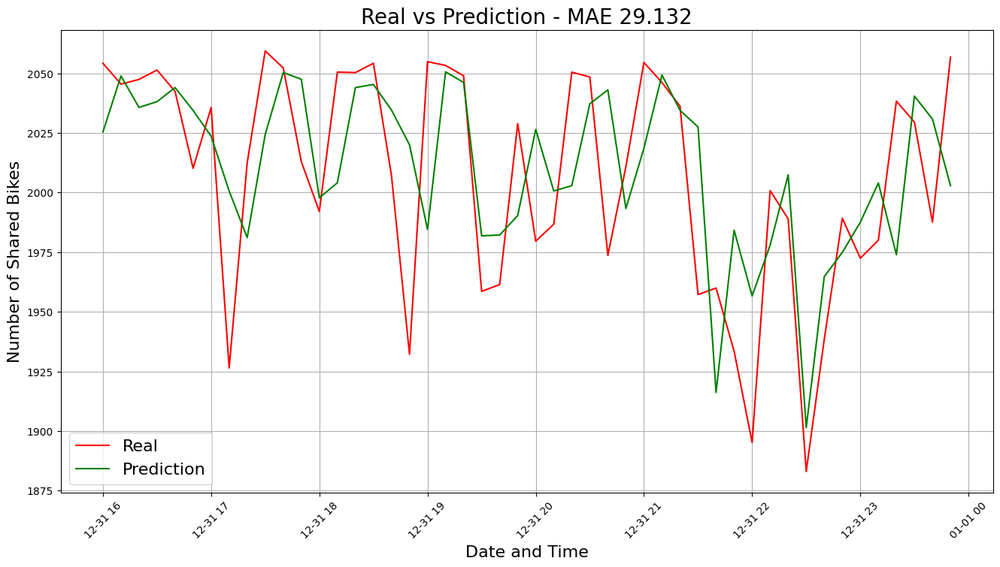

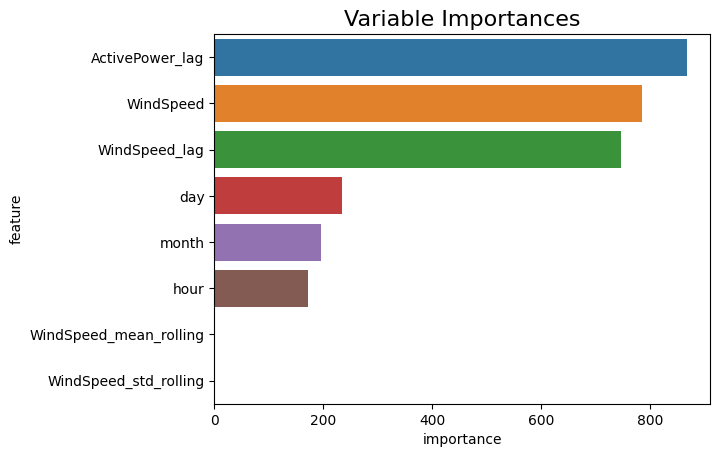

Lag: 1, Window: 2
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 30.17
Mean Squared Error (MSE): 1403.165
Mean Absolute Percentage Error (MAPE): 1.512%


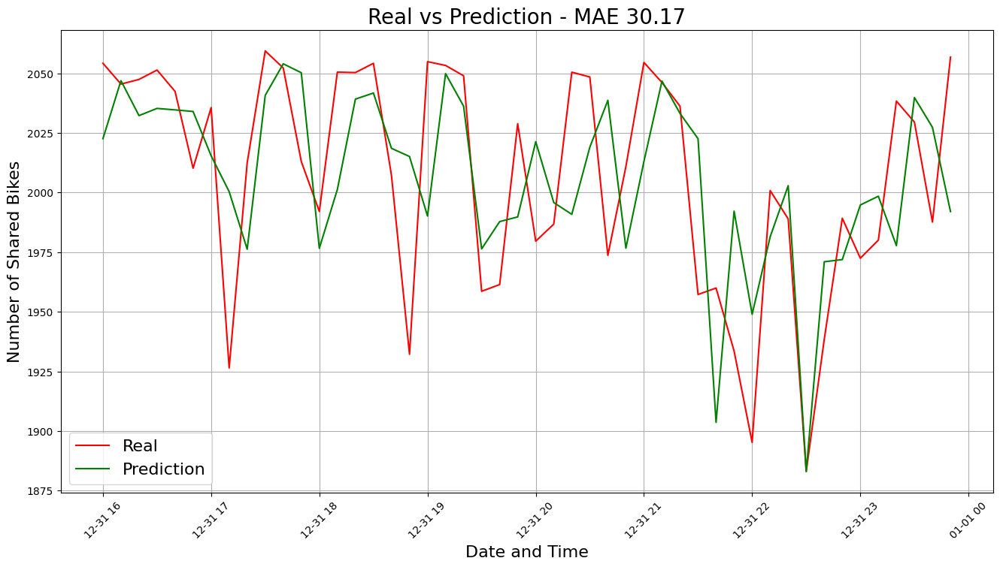

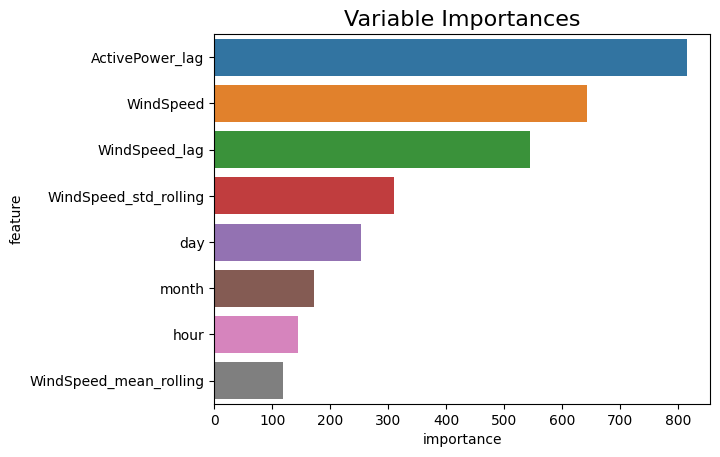

Lag: 1, Window: 3
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 30.111
Mean Squared Error (MSE): 1484.679
Mean Absolute Percentage Error (MAPE): 1.509%


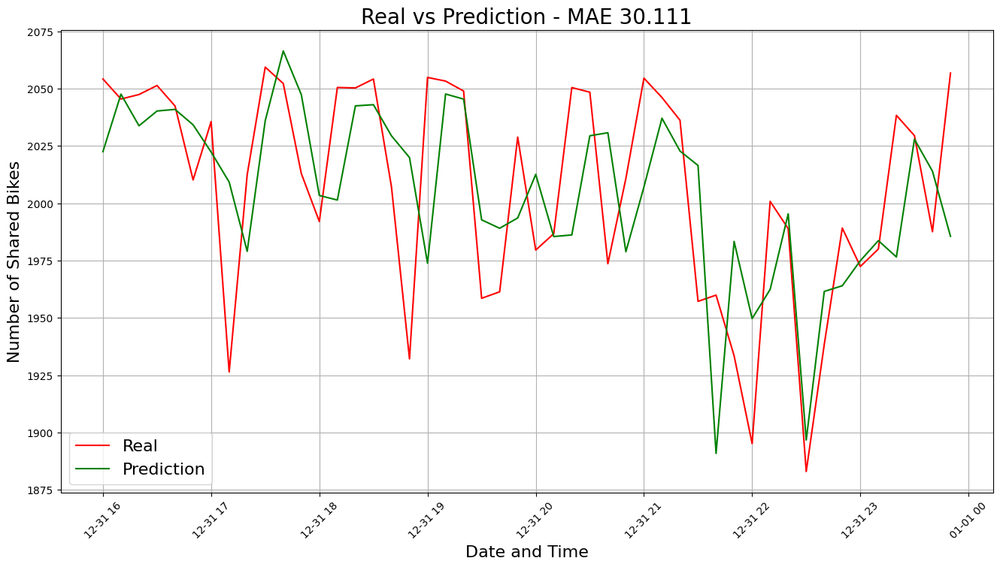

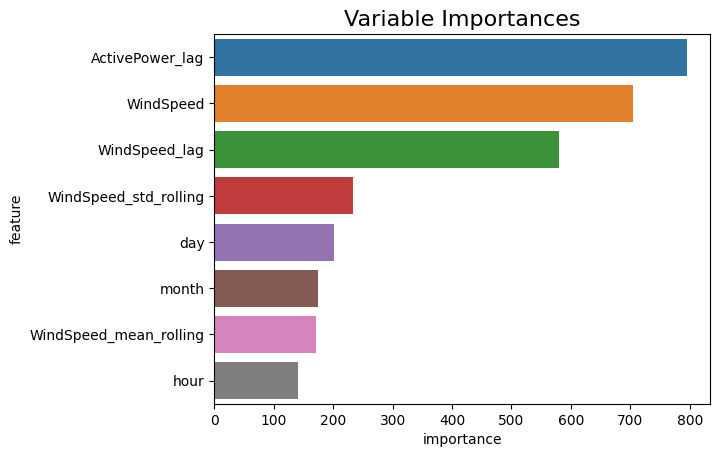

Lag: 1, Window: 5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 28.806
Mean Squared Error (MSE): 1330.806
Mean Absolute Percentage Error (MAPE): 1.445%


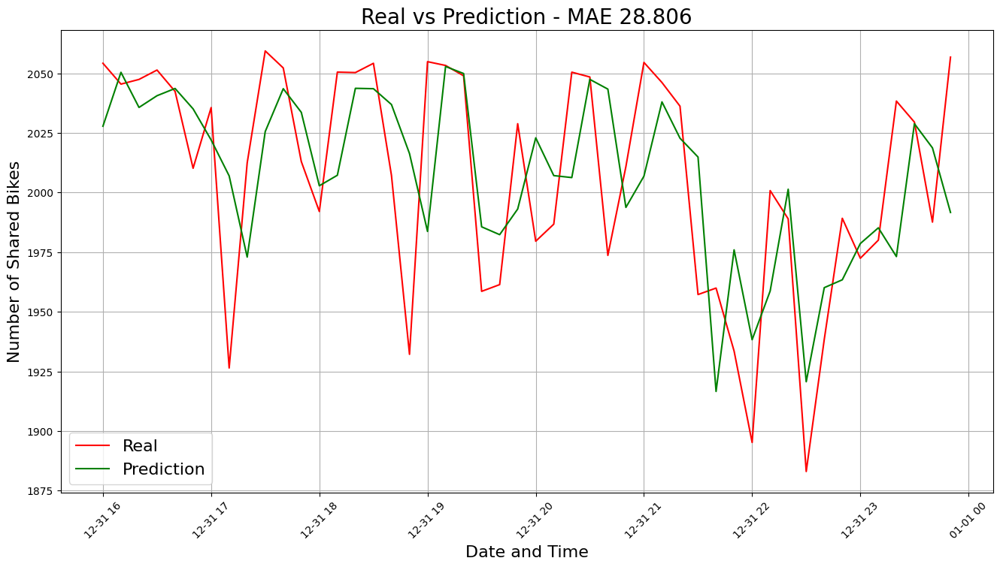

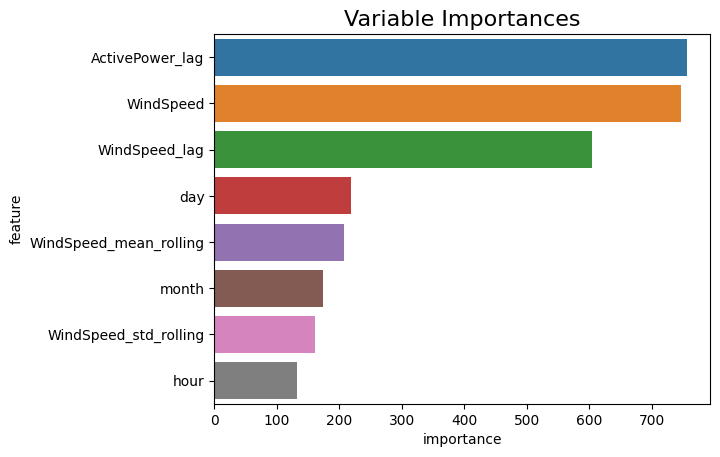

Lag: 1, Window: 10
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 28.842
Mean Squared Error (MSE): 1361.918
Mean Absolute Percentage Error (MAPE): 1.444%


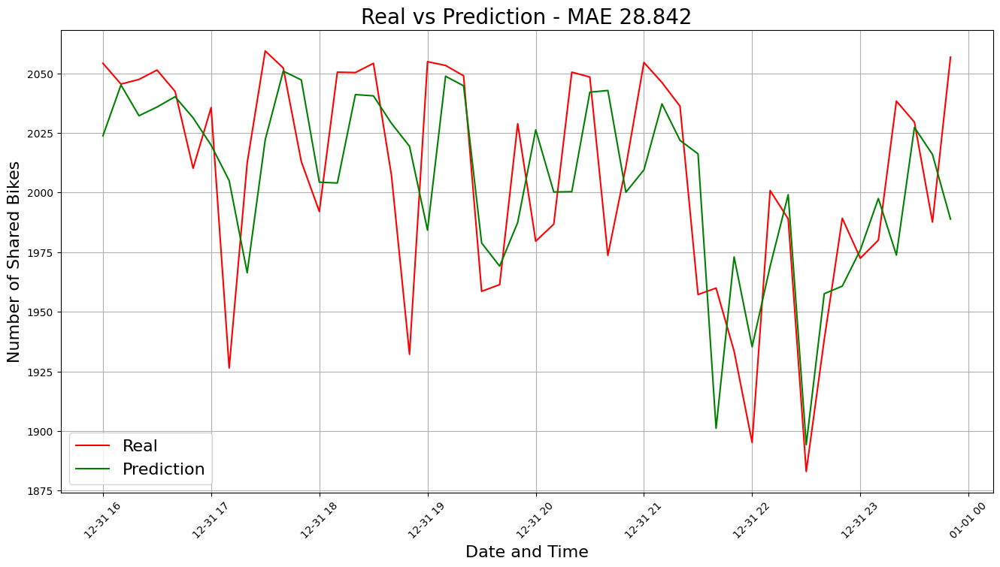

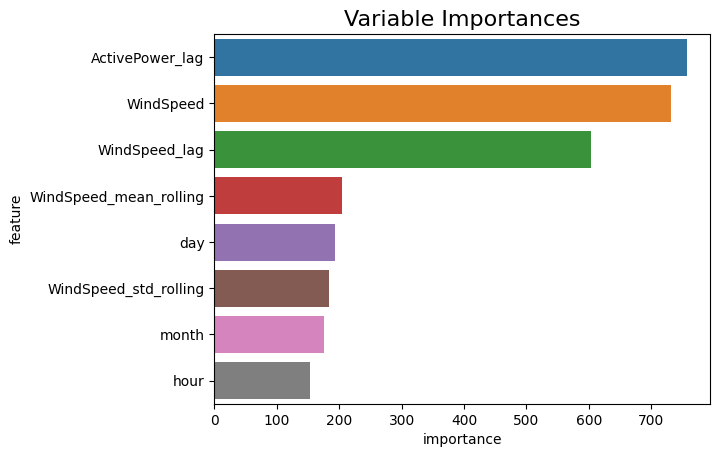

Lag: 6, Window: 1
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1089
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 7
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 31.71
Mean Squared Error (MSE): 1724.435
Mean Absolute Percentage Error (MAPE): 1.597%


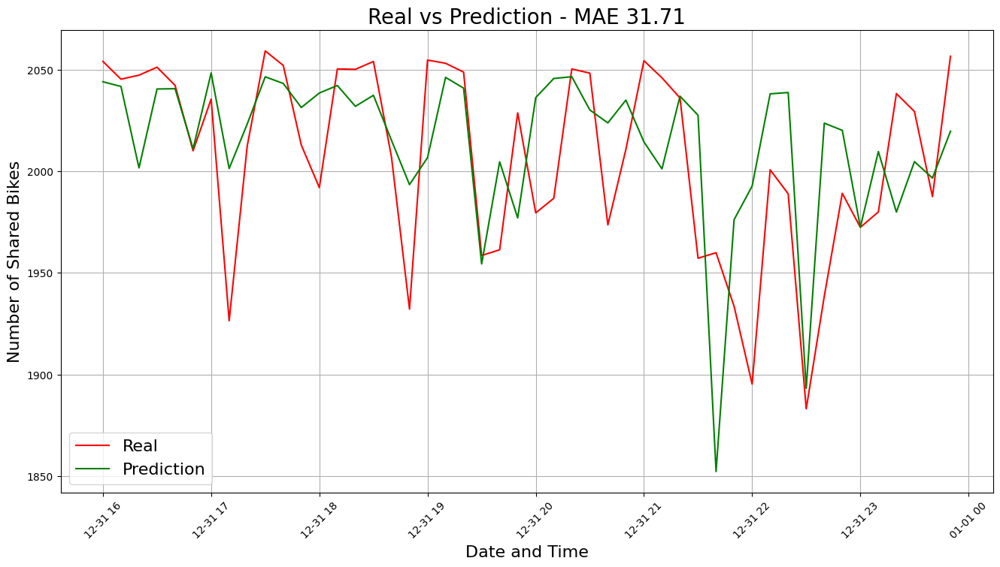

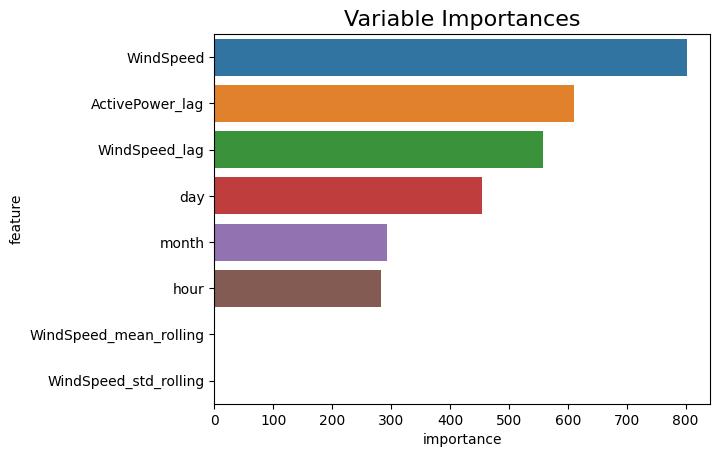

Lag: 6, Window: 2
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 34.454
Mean Squared Error (MSE): 1942.356
Mean Absolute Percentage Error (MAPE): 1.731%


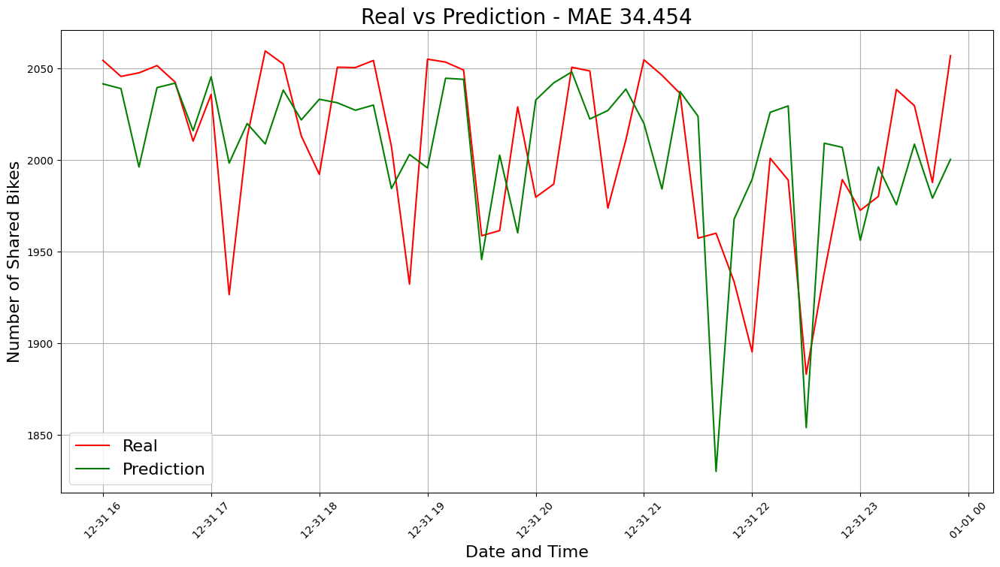

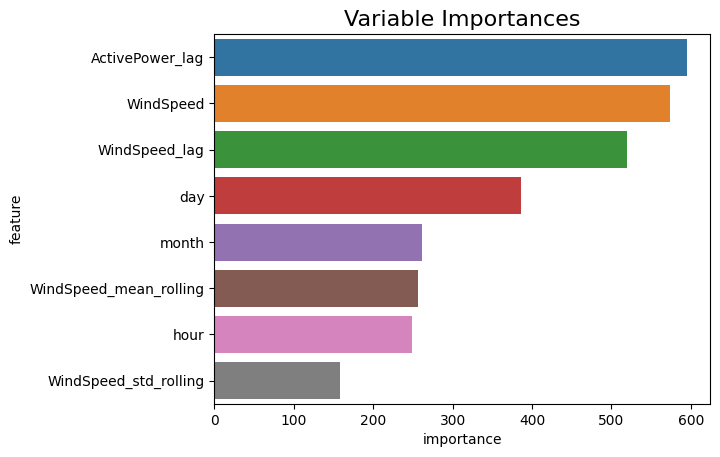

Lag: 6, Window: 3
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 35.27
Mean Squared Error (MSE): 2159.108
Mean Absolute Percentage Error (MAPE): 1.778%


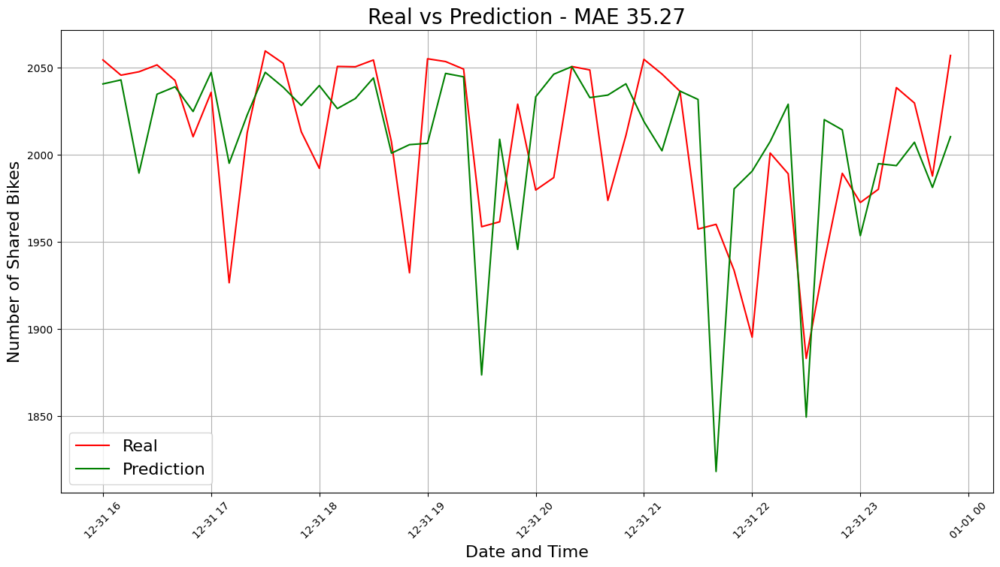

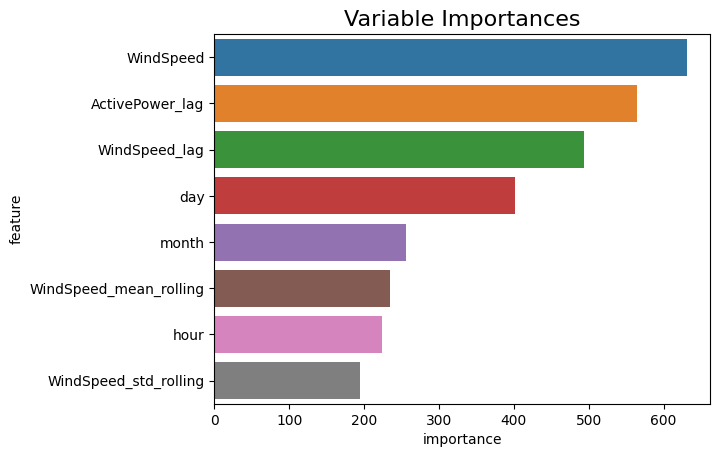

Lag: 6, Window: 5
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 32.066
Mean Squared Error (MSE): 1702.869
Mean Absolute Percentage Error (MAPE): 1.61%


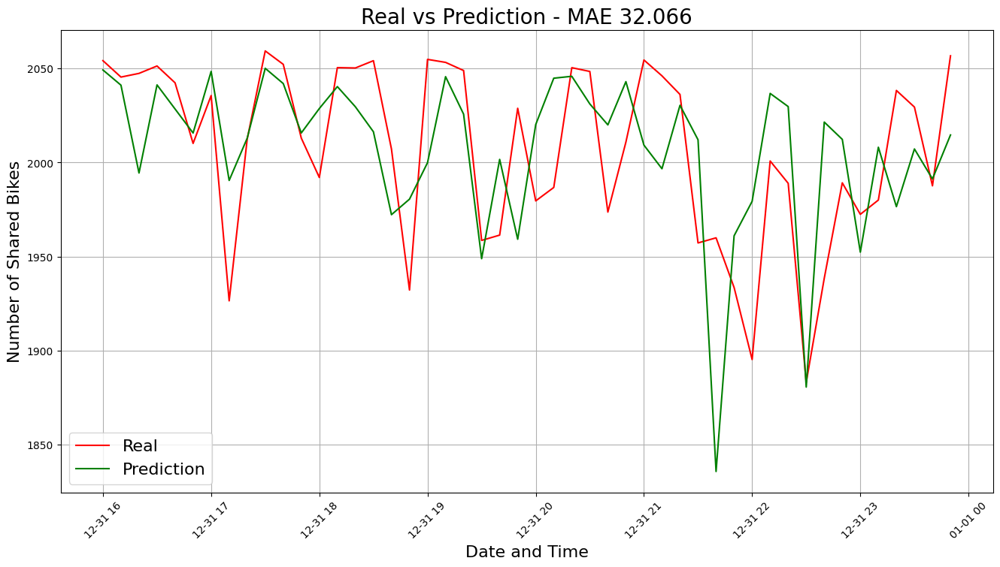

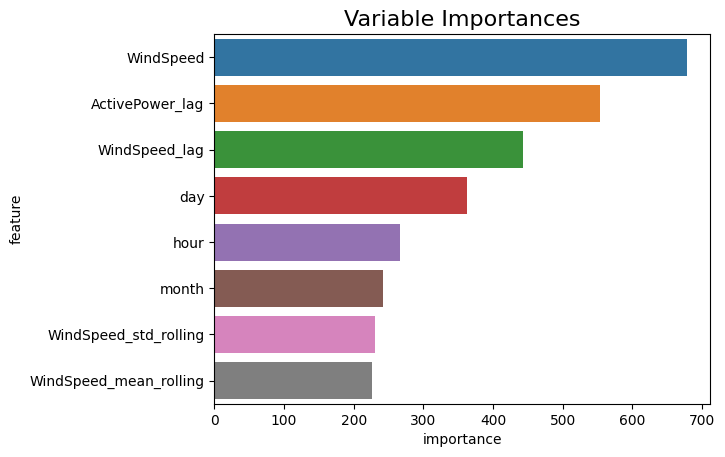

Lag: 6, Window: 10
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 34.549
Mean Squared Error (MSE): 1919.804
Mean Absolute Percentage Error (MAPE): 1.738%


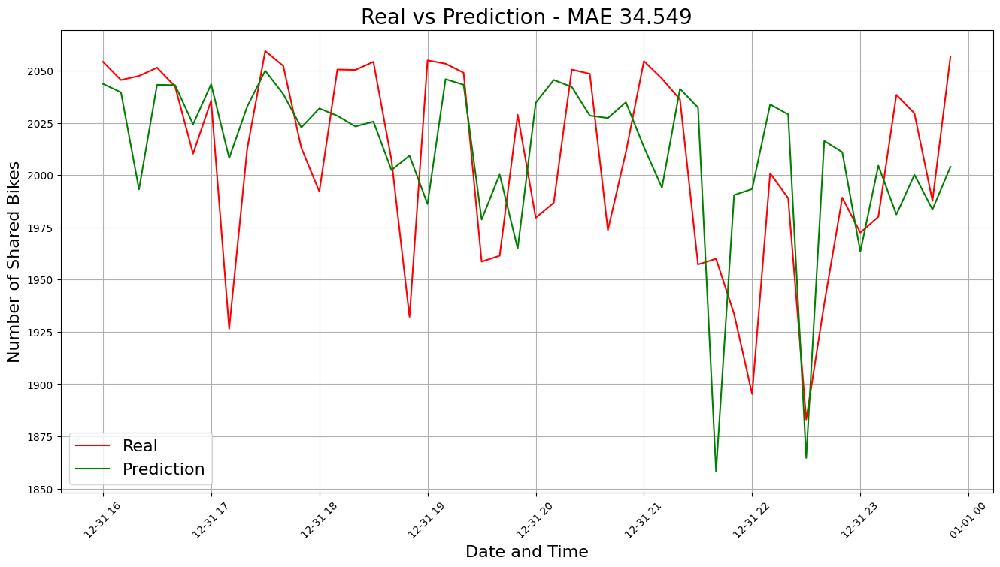

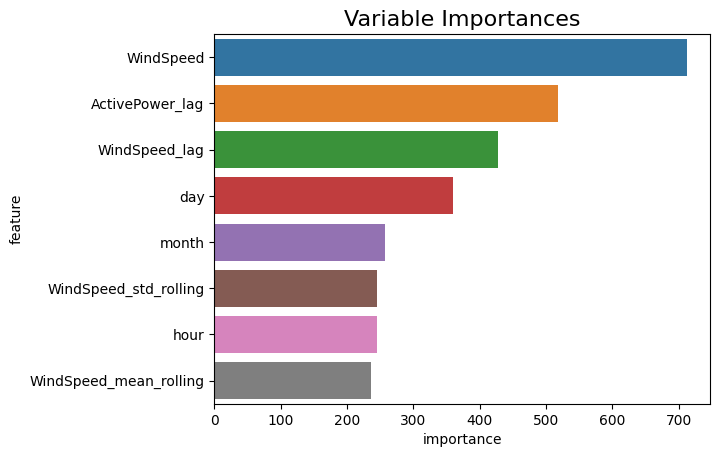

Lag: 12, Window: 1
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1089
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 7
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 29.854
Mean Squared Error (MSE): 1156.692
Mean Absolute Percentage Error (MAPE): 1.486%


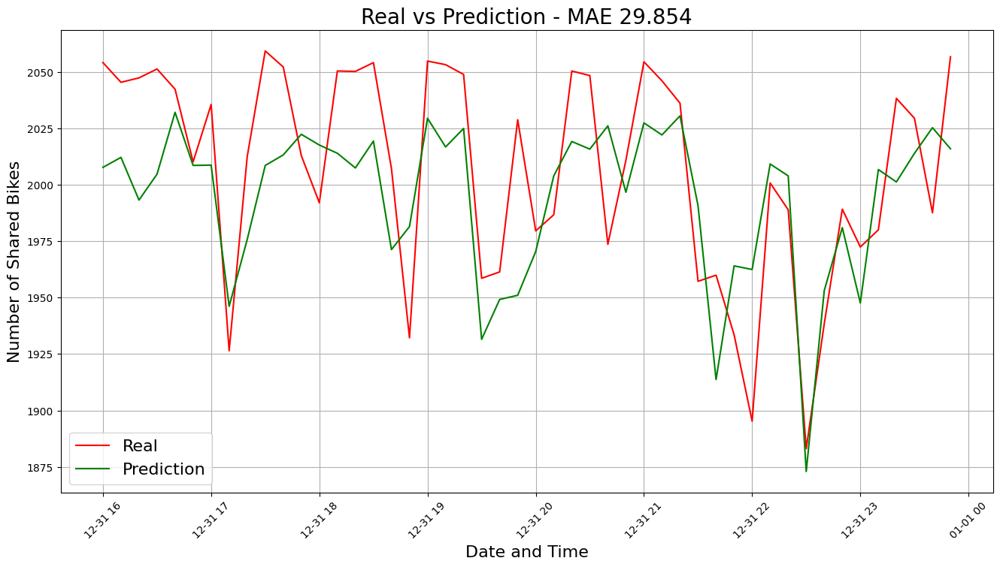

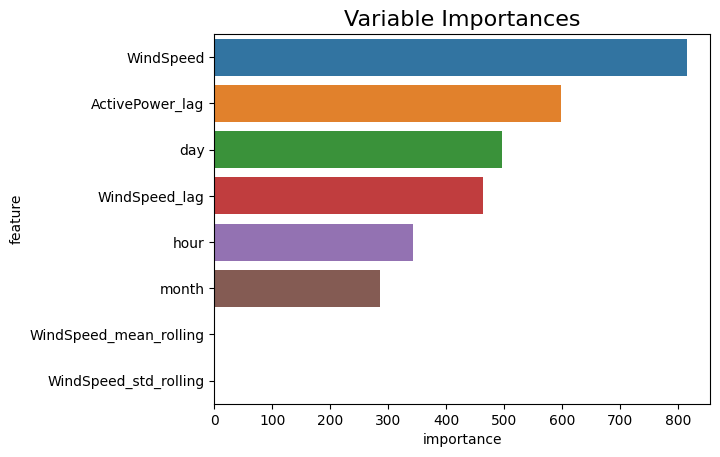

Lag: 12, Window: 2
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 25.293
Mean Squared Error (MSE): 1005.601
Mean Absolute Percentage Error (MAPE): 1.271%


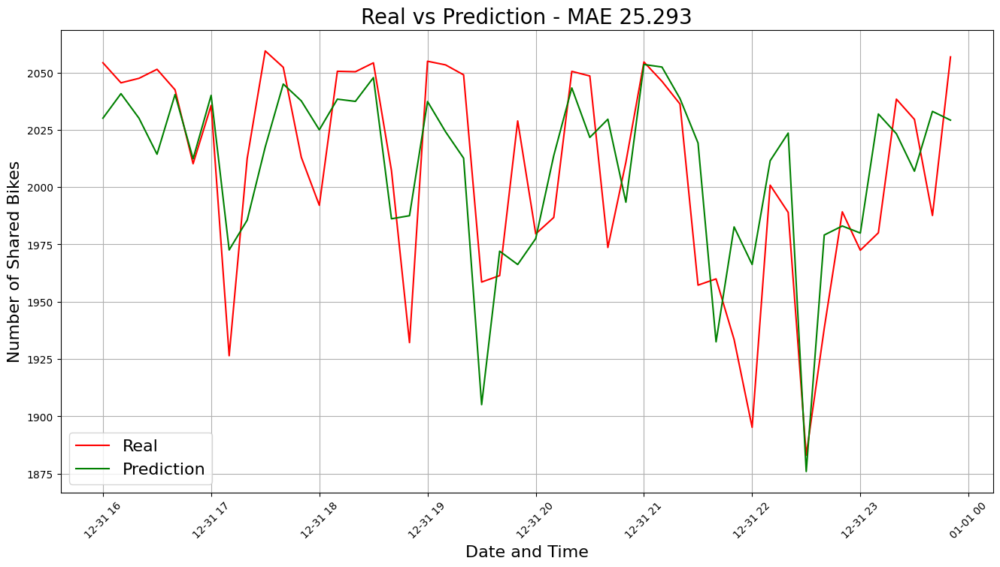

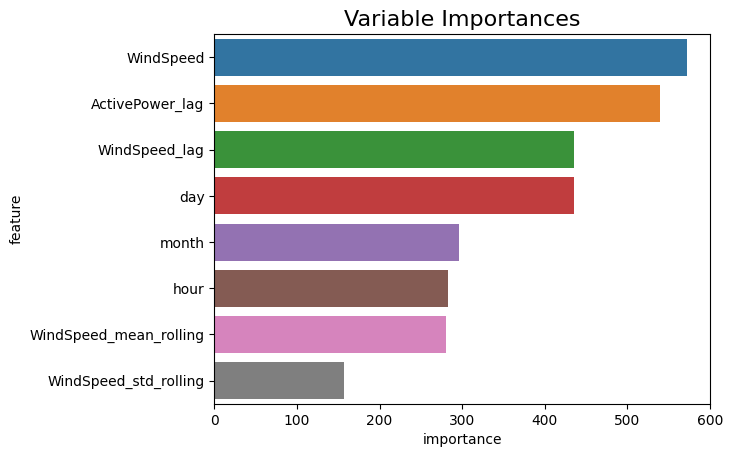

Lag: 12, Window: 3
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 28.21
Mean Squared Error (MSE): 1209.238
Mean Absolute Percentage Error (MAPE): 1.421%


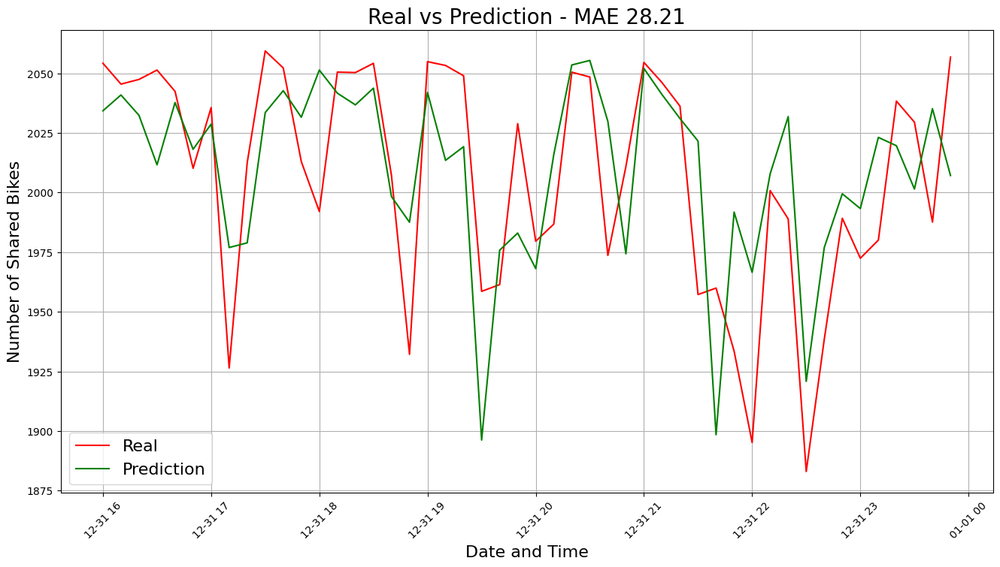

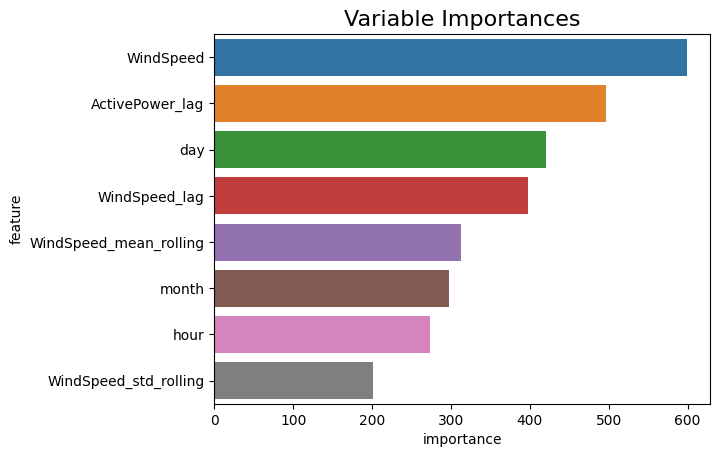

Lag: 12, Window: 5
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 26.666
Mean Squared Error (MSE): 1144.962
Mean Absolute Percentage Error (MAPE): 1.341%


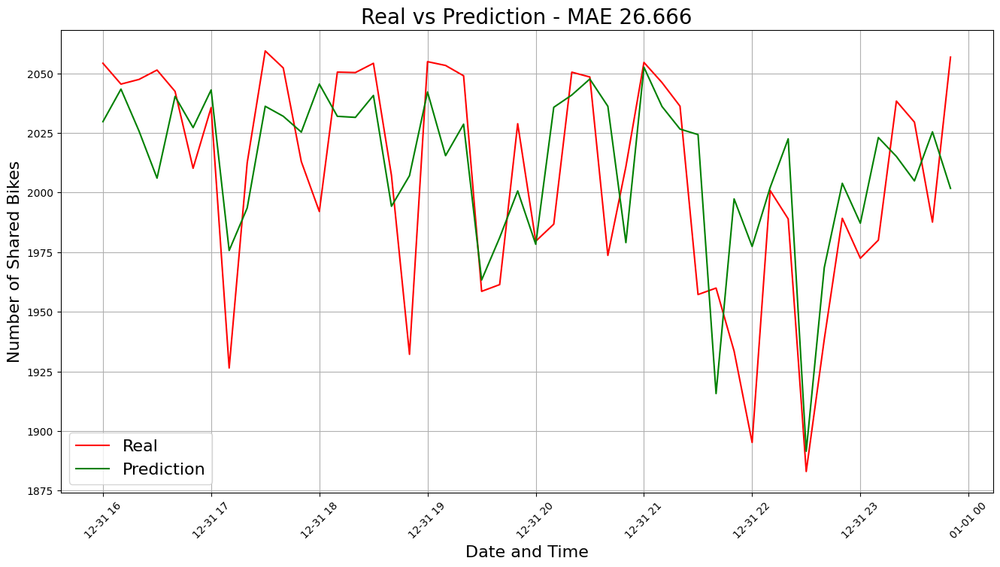

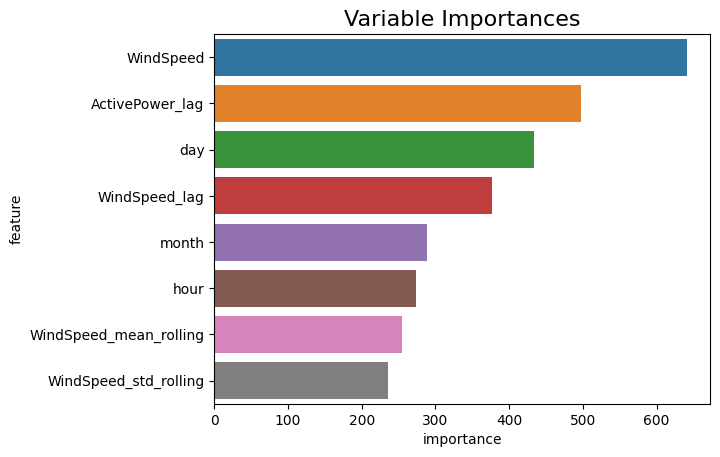

Lag: 12, Window: 10
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 27.876
Mean Squared Error (MSE): 1146.171
Mean Absolute Percentage Error (MAPE): 1.396%


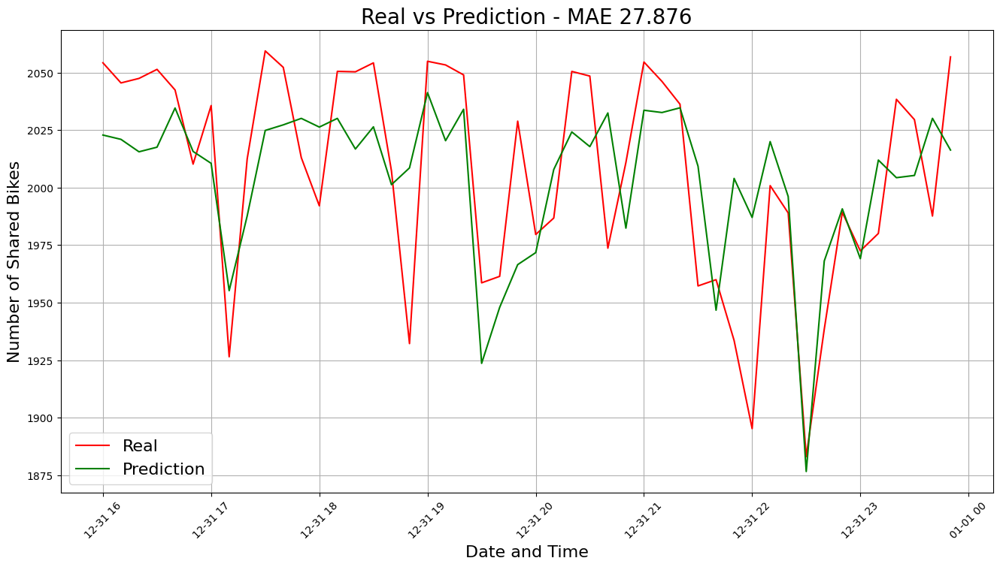

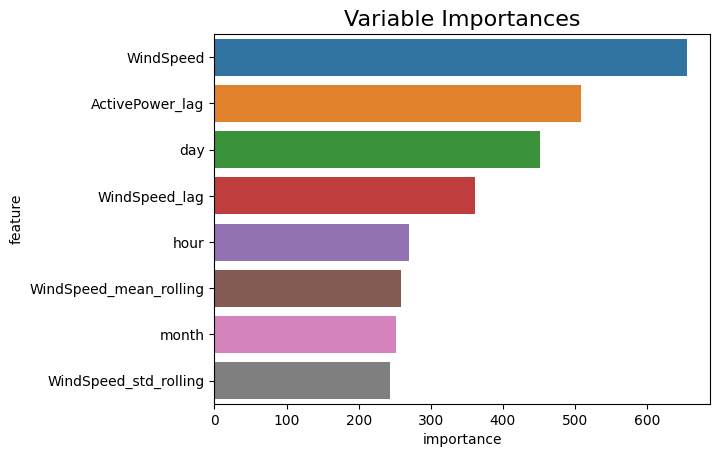

Lag: 24, Window: 1
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1089
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 7
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 30.39
Mean Squared Error (MSE): 1260.611
Mean Absolute Percentage Error (MAPE): 1.518%


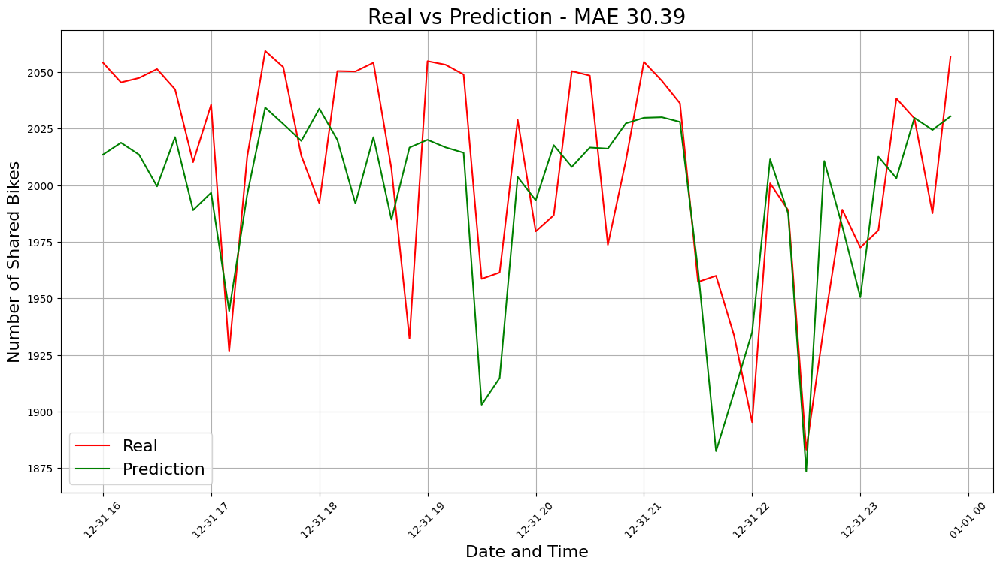

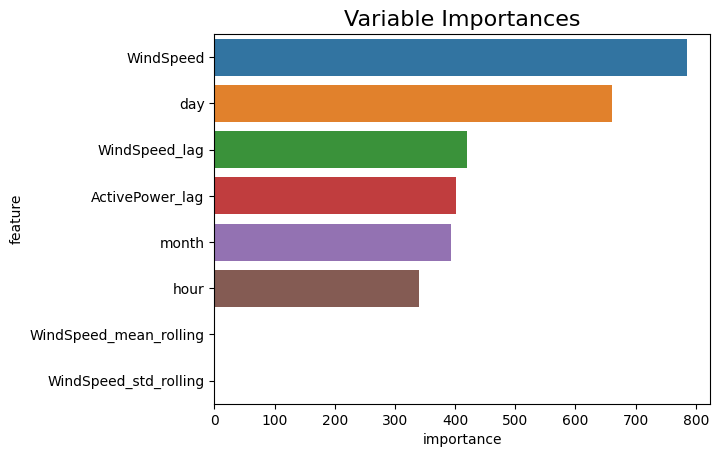

Lag: 24, Window: 2
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 31.041
Mean Squared Error (MSE): 1550.565
Mean Absolute Percentage Error (MAPE): 1.554%


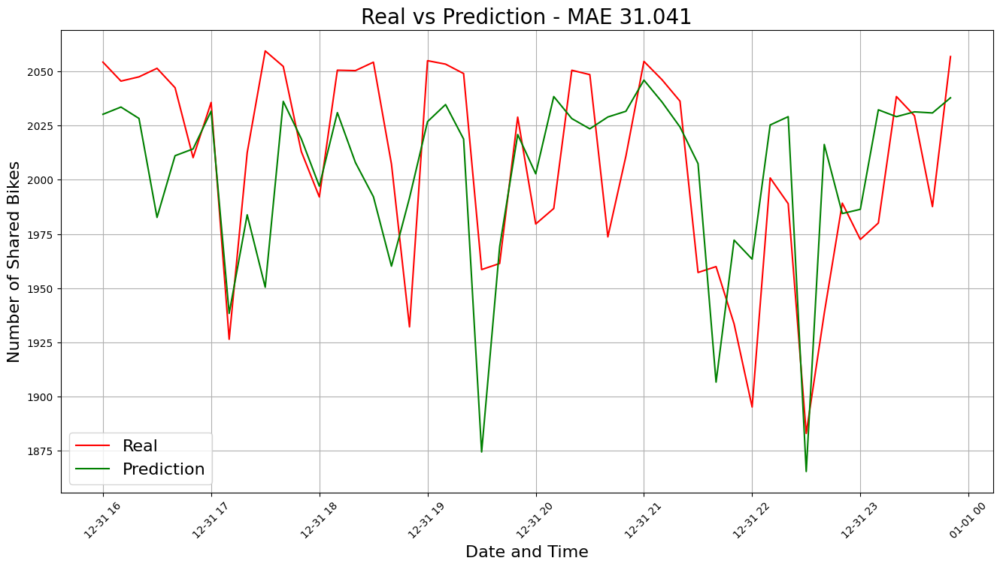

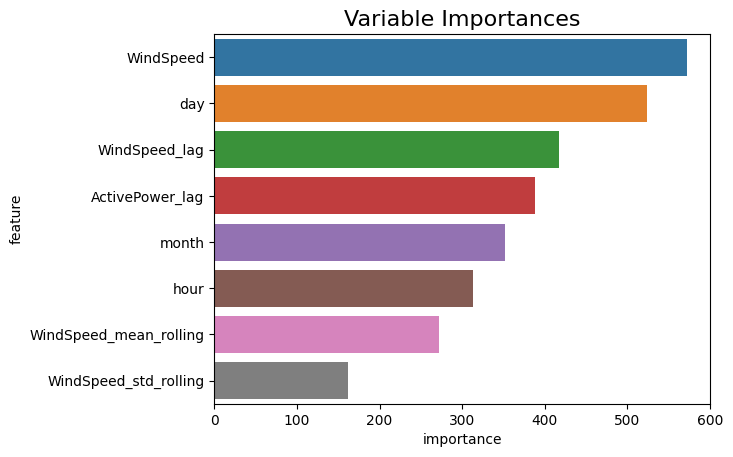

Lag: 24, Window: 3
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 39.429
Mean Squared Error (MSE): 2406.865
Mean Absolute Percentage Error (MAPE): 1.959%


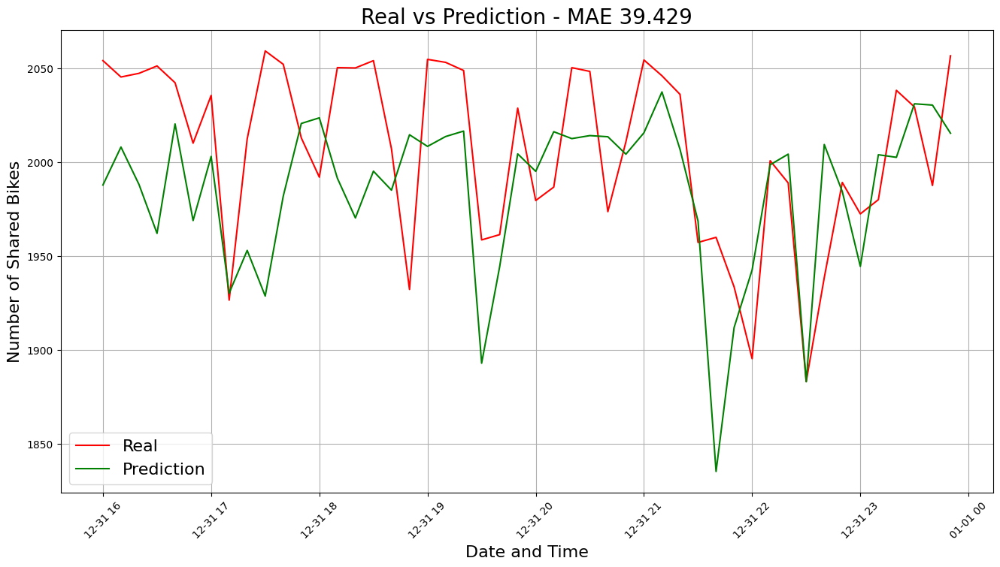

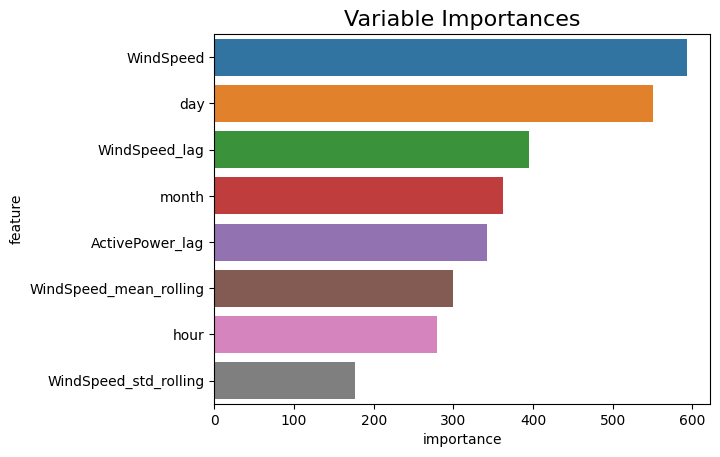

Lag: 24, Window: 5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 37.474
Mean Squared Error (MSE): 1903.812
Mean Absolute Percentage Error (MAPE): 1.868%


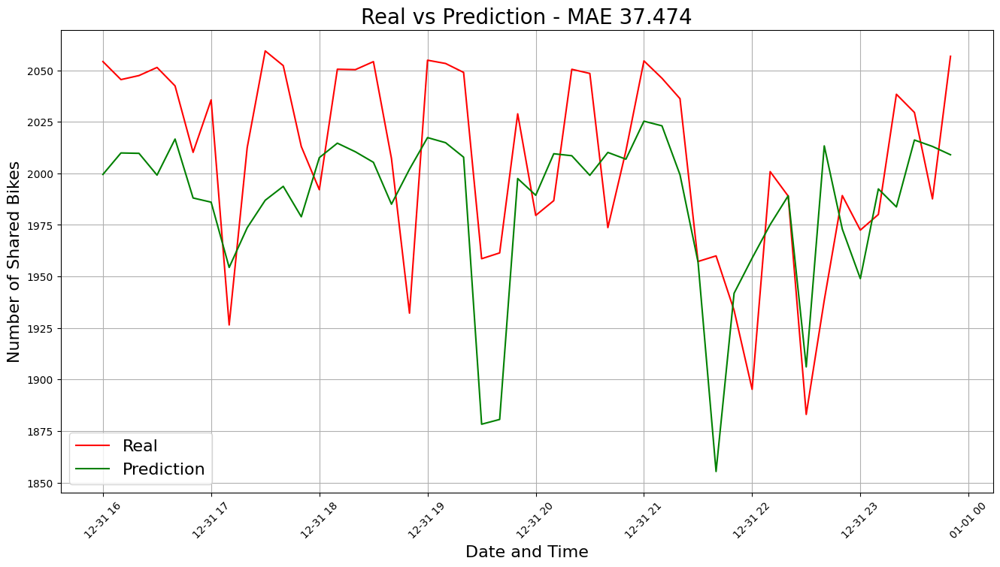

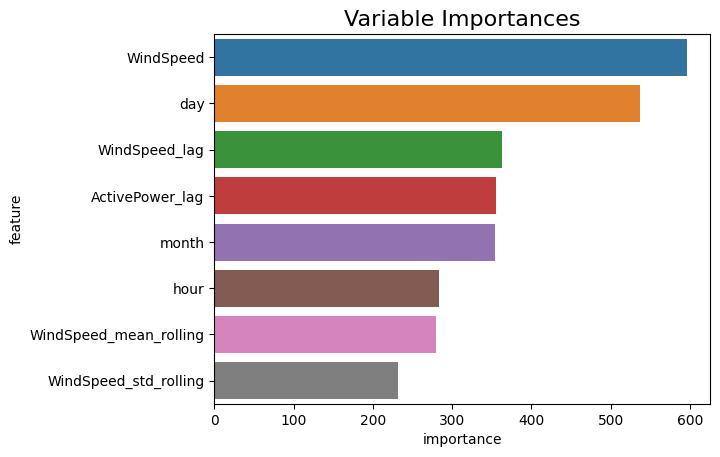

Lag: 24, Window: 10
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 33.894
Mean Squared Error (MSE): 1626.544
Mean Absolute Percentage Error (MAPE): 1.697%


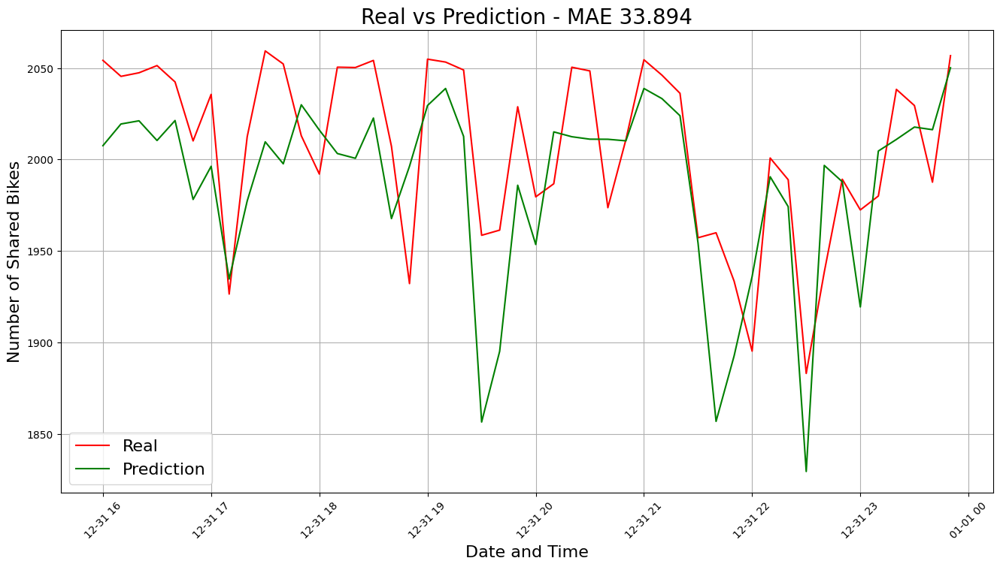

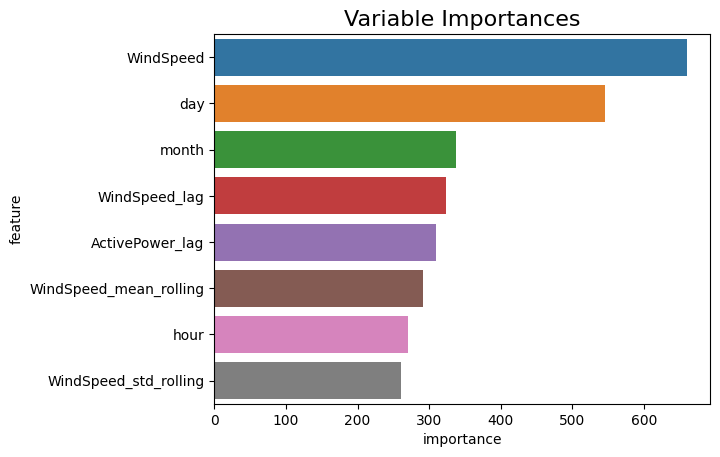

Lag: 48, Window: 1
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1089
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 7
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 32.81
Mean Squared Error (MSE): 1566.2
Mean Absolute Percentage Error (MAPE): 1.65%


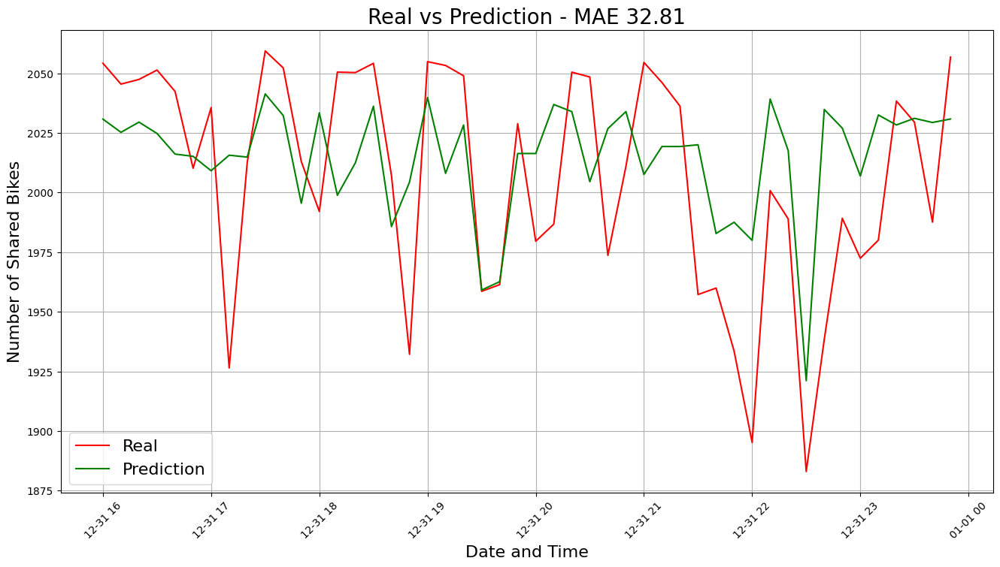

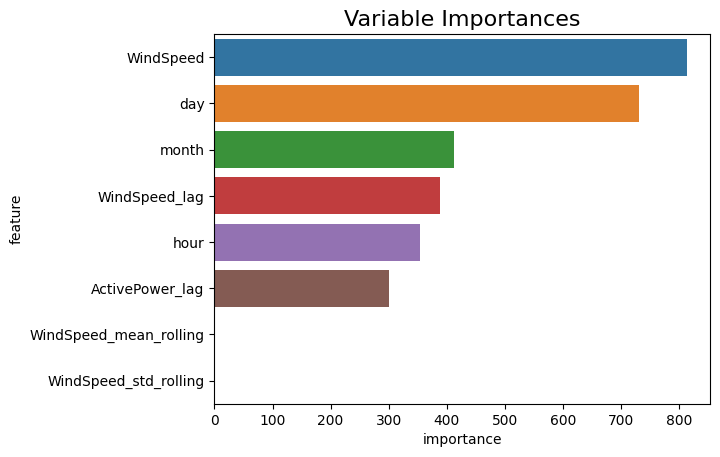

Lag: 48, Window: 2
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 28.003
Mean Squared Error (MSE): 1152.989
Mean Absolute Percentage Error (MAPE): 1.408%


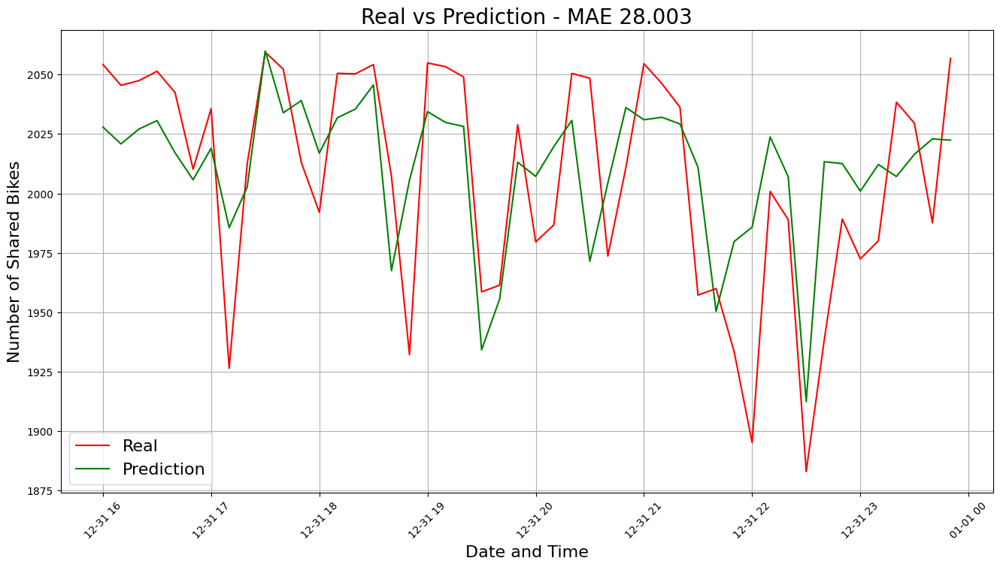

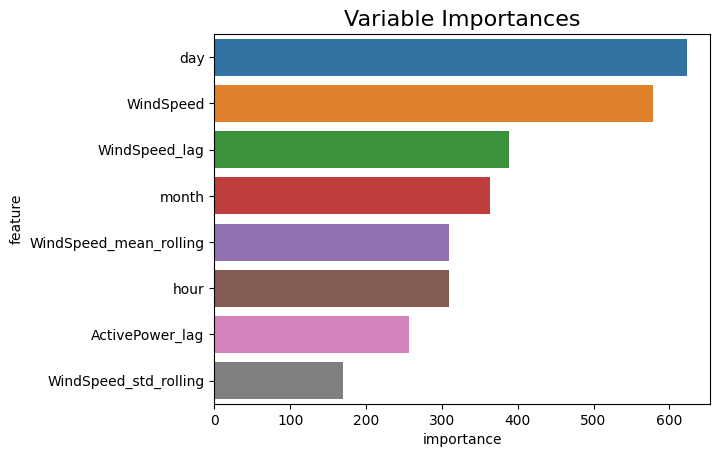

Lag: 48, Window: 3
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 27.78
Mean Squared Error (MSE): 1133.359
Mean Absolute Percentage Error (MAPE): 1.397%


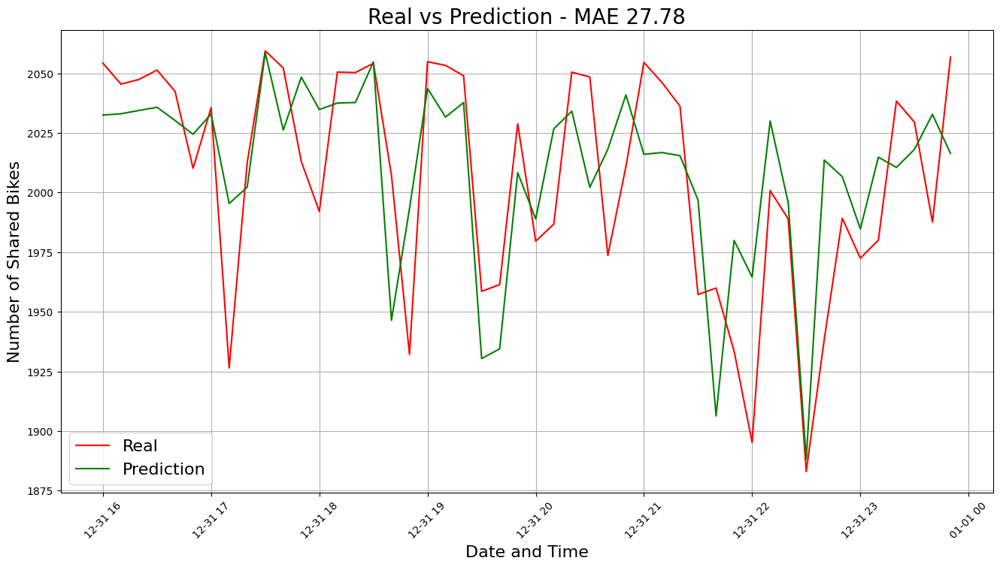

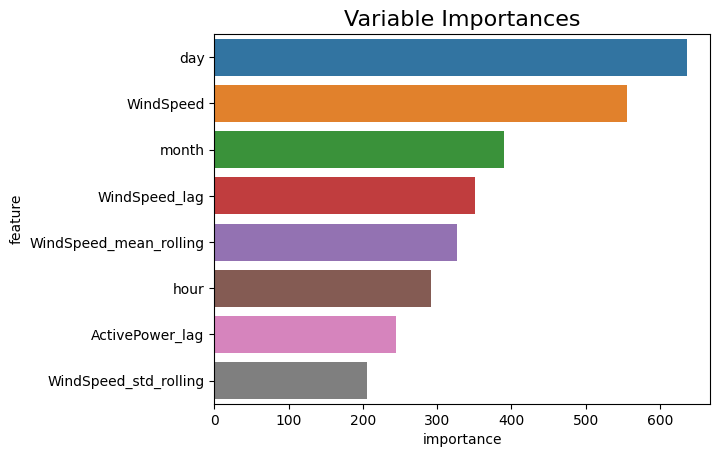

Lag: 48, Window: 5
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 31.679
Mean Squared Error (MSE): 1512.834
Mean Absolute Percentage Error (MAPE): 1.596%


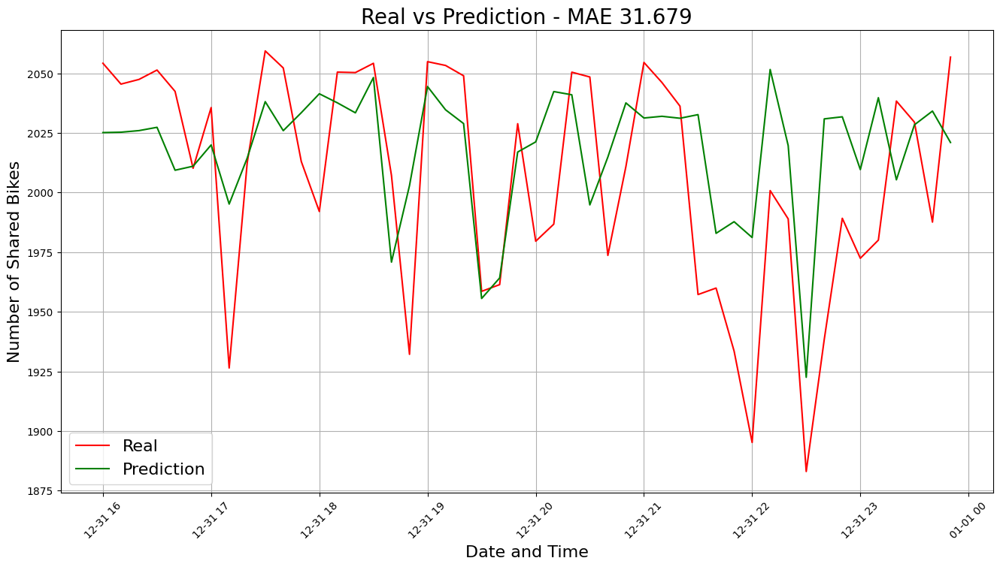

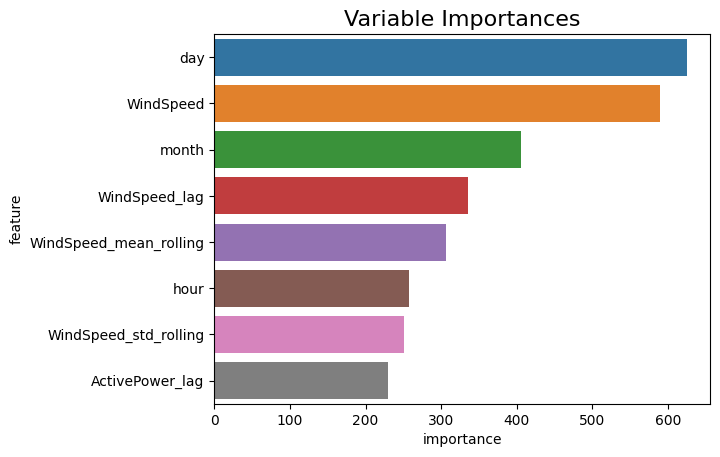

Lag: 48, Window: 10
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1344
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 8
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 27.337
Mean Squared Error (MSE): 1004.36
Mean Absolute Percentage Error (MAPE): 1.364%


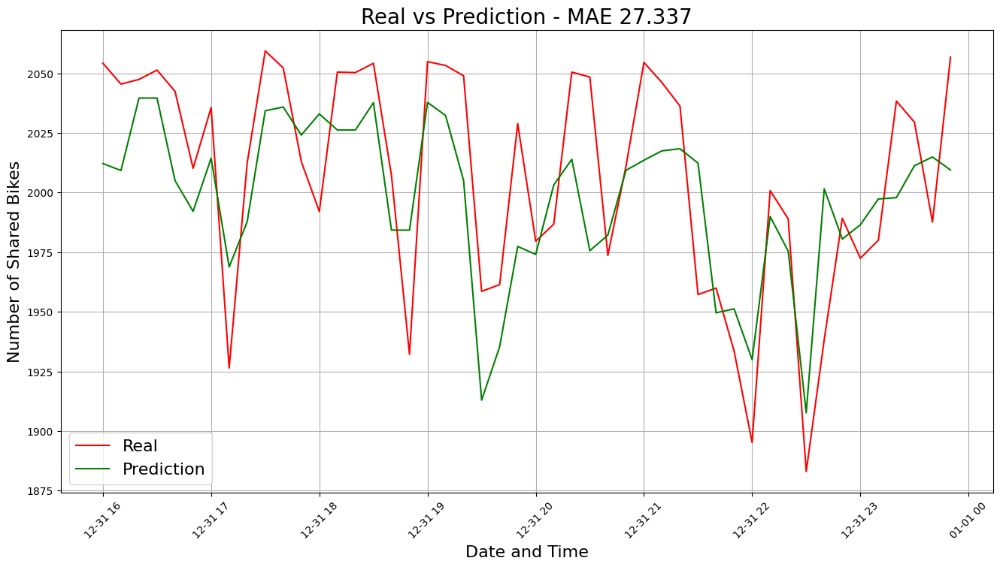

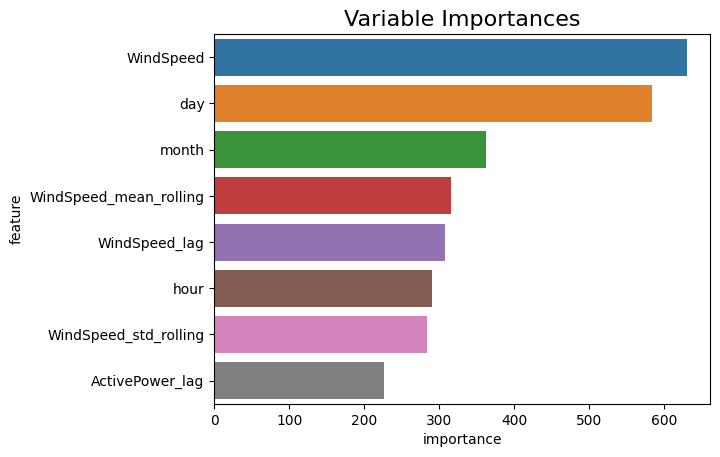


Best 3 Iterations:
Iteration 1: Lag=48, Window=10, MAE=27.337, MSE=1004.36, MAPE=1.364
Iteration 2: Lag=12, Window=2, MAE=25.293, MSE=1005.601, MAPE=1.271
Iteration 3: Lag=48, Window=3, MAE=27.78, MSE=1133.359, MAPE=1.397


[{'Lag': 48, 'Window': 10, 'MAE': 27.337, 'MSE': 1004.36, 'MAPE': 1.364},
 {'Lag': 12, 'Window': 2, 'MAE': 25.293, 'MSE': 1005.601, 'MAPE': 1.271},
 {'Lag': 48, 'Window': 3, 'MAE': 27.78, 'MSE': 1133.359, 'MAPE': 1.397},
 {'Lag': 12, 'Window': 5, 'MAE': 26.666, 'MSE': 1144.962, 'MAPE': 1.341},
 {'Lag': 12, 'Window': 10, 'MAE': 27.876, 'MSE': 1146.171, 'MAPE': 1.396},
 {'Lag': 48, 'Window': 2, 'MAE': 28.003, 'MSE': 1152.989, 'MAPE': 1.408},
 {'Lag': 12, 'Window': 1, 'MAE': 29.854, 'MSE': 1156.692, 'MAPE': 1.486},
 {'Lag': 12, 'Window': 3, 'MAE': 28.21, 'MSE': 1209.238, 'MAPE': 1.421},
 {'Lag': 24, 'Window': 1, 'MAE': 30.39, 'MSE': 1260.611, 'MAPE': 1.518},
 {'Lag': 1, 'Window': 5, 'MAE': 28.806, 'MSE': 1330.806, 'MAPE': 1.445},
 {'Lag': 1, 'Window': 1, 'MAE': 29.132, 'MSE': 1361.132, 'MAPE': 1.463},
 {'Lag': 1, 'Window': 10, 'MAE': 28.842, 'MSE': 1361.918, 'MAPE': 1.444},
 {'Lag': 1, 'Window': 2, 'MAE': 30.17, 'MSE': 1403.165, 'MAPE': 1.512},
 {'Lag': 1, 'Window': 3, 'MAE': 30.111, 'MSE

In [37]:
file_path_1 = ""
df= pd.read_csv(file_path_1, sep='\t')
df.drop(['WF', 'WT','Index'], axis=1, inplace=True)
hyperparameter_tuning(df)

In [31]:
#results=hyperparameter_tuning(df)


In [30]:
results

[{'Lag': 48, 'Window': 10, 'MAE': 27.337, 'MSE': 1004.36, 'MAPE': 1.364},
 {'Lag': 12, 'Window': 2, 'MAE': 25.293, 'MSE': 1005.601, 'MAPE': 1.271},
 {'Lag': 48, 'Window': 3, 'MAE': 27.78, 'MSE': 1133.359, 'MAPE': 1.397},
 {'Lag': 12, 'Window': 5, 'MAE': 26.666, 'MSE': 1144.962, 'MAPE': 1.341},
 {'Lag': 12, 'Window': 10, 'MAE': 27.876, 'MSE': 1146.171, 'MAPE': 1.396},
 {'Lag': 48, 'Window': 2, 'MAE': 28.003, 'MSE': 1152.989, 'MAPE': 1.408},
 {'Lag': 12, 'Window': 3, 'MAE': 28.21, 'MSE': 1209.238, 'MAPE': 1.421},
 {'Lag': 1, 'Window': 5, 'MAE': 28.806, 'MSE': 1330.806, 'MAPE': 1.445},
 {'Lag': 1, 'Window': 10, 'MAE': 28.842, 'MSE': 1361.918, 'MAPE': 1.444},
 {'Lag': 1, 'Window': 2, 'MAE': 30.17, 'MSE': 1403.165, 'MAPE': 1.512},
 {'Lag': 1, 'Window': 3, 'MAE': 30.111, 'MSE': 1484.679, 'MAPE': 1.509},
 {'Lag': 48, 'Window': 5, 'MAE': 31.679, 'MSE': 1512.834, 'MAPE': 1.596},
 {'Lag': 24, 'Window': 2, 'MAE': 31.041, 'MSE': 1550.565, 'MAPE': 1.554},
 {'Lag': 24, 'Window': 10, 'MAE': 33.894, '

Best 3 Iterations:
- Iteration 1: Lag=48, Window=10, MAE=27.337, MSE=1004.36, MAPE=1.364
- Iteration 2: Lag=12, Window=2, MAE=25.293, MSE=1005.601, MAPE=1.271
- Iteration 3: Lag=48, Window=3, MAE=27.78, MSE=1133.359, MAPE=1.397

# Best 3 iterations

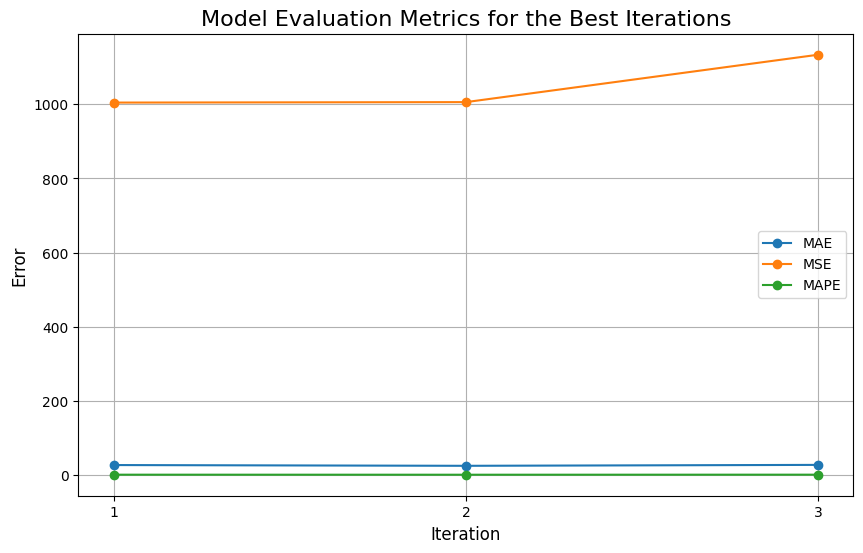

In [39]:
best_iterations = [
    {'Lag': 48, 'Window': 10, 'MAE': 27.337, 'MSE': 1004.36, 'MAPE': 1.364},
    {'Lag': 12, 'Window': 2, 'MAE': 25.293, 'MSE': 1005.601, 'MAPE': 1.271},
    {'Lag': 48, 'Window': 3, 'MAE': 27.78, 'MSE': 1133.359, 'MAPE': 1.397}
]

# Convert the best_iterations list to a DataFrame
df_best_iterations = pd.DataFrame(best_iterations)

# Plot MAE, MSE, and MAPE for the best iterations
plt.figure(figsize=(10, 6))
plt.plot(df_best_iterations.index + 1, df_best_iterations['MAE'], marker='o', label='MAE')
plt.plot(df_best_iterations.index + 1, df_best_iterations['MSE'], marker='o', label='MSE')
plt.plot(df_best_iterations.index + 1, df_best_iterations['MAPE'], marker='o', label='MAPE')
plt.xlabel('Iteration', fontsize=12)
plt.ylabel('Error', fontsize=12)
plt.title('Model Evaluation Metrics for the Best Iterations', fontsize=16)
plt.xticks(df_best_iterations.index + 1)
plt.legend()
plt.grid(True)
plt.show()


Training for Best Iteration 1: Lag=48, Window=10
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2874
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 14
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 26.413
Mean Squared Error (MSE): 1050.873
Mean Absolute Percentage Error (MAPE): 1.33%


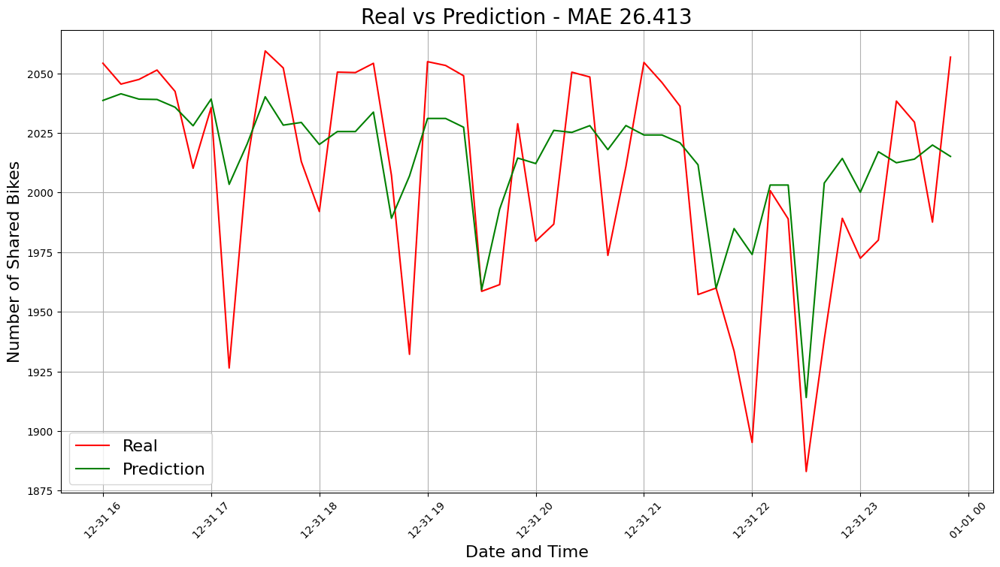

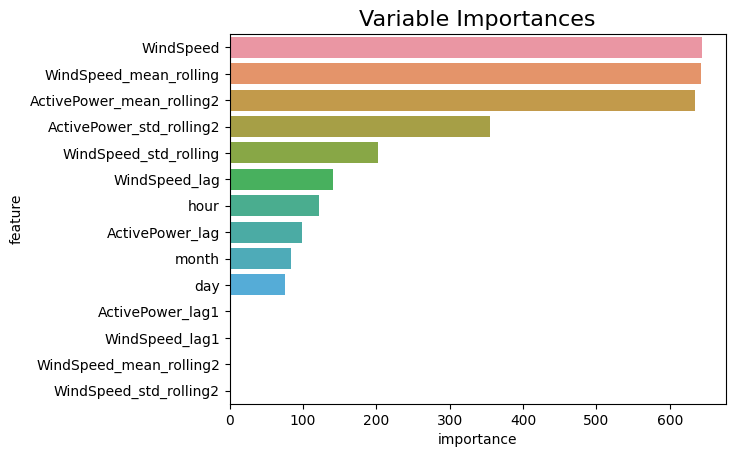


Table for Best Iteration - MAE: 26.413
                          Date and Time  Real ActivePower  \
DATE                                                        
2020-12-31 16:00:00 2020-12-31 16:00:00        2054.23077   
2020-12-31 16:10:00 2020-12-31 16:10:00        2045.48718   
2020-12-31 16:20:00 2020-12-31 16:20:00        2047.45000   
2020-12-31 16:30:00 2020-12-31 16:30:00        2051.38462   
2020-12-31 16:40:00 2020-12-31 16:40:00        2042.43590   
2020-12-31 16:50:00 2020-12-31 16:50:00        2010.20000   
2020-12-31 17:00:00 2020-12-31 17:00:00        2035.65000   
2020-12-31 17:10:00 2020-12-31 17:10:00        1926.47500   
2020-12-31 17:20:00 2020-12-31 17:20:00        2012.47500   
2020-12-31 17:30:00 2020-12-31 17:30:00        2059.40000   
2020-12-31 17:40:00 2020-12-31 17:40:00        2052.26316   
2020-12-31 17:50:00 2020-12-31 17:50:00        2013.02632   
2020-12-31 18:00:00 2020-12-31 18:00:00        1992.07895   
2020-12-31 18:10:00 2020-12-31 18:10:00      

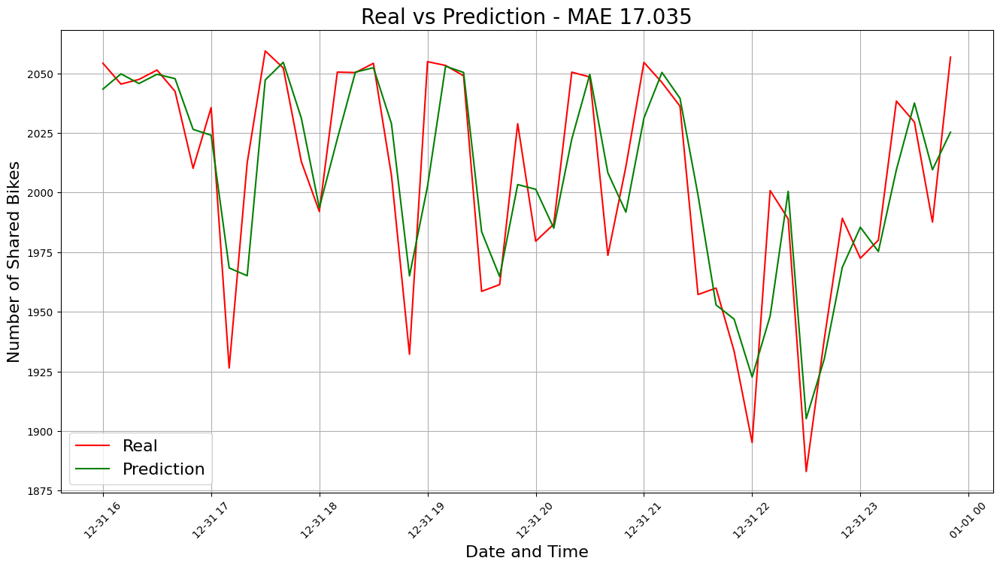

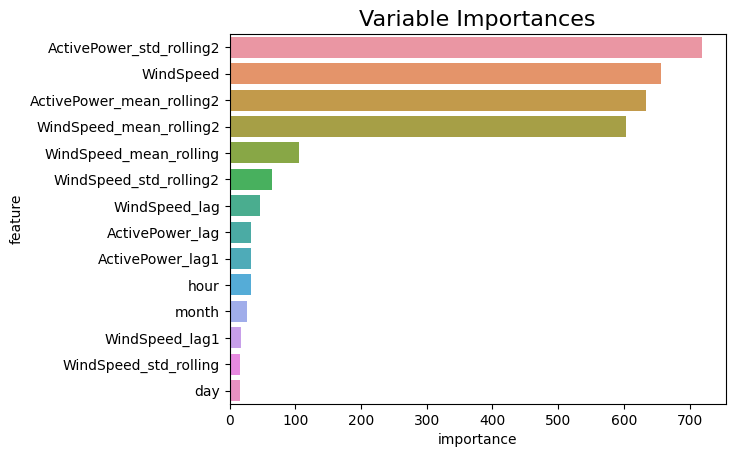


Table for Best Iteration - MAE: 17.035
                          Date and Time  Real ActivePower  \
DATE                                                        
2020-12-31 16:00:00 2020-12-31 16:00:00        2054.23077   
2020-12-31 16:10:00 2020-12-31 16:10:00        2045.48718   
2020-12-31 16:20:00 2020-12-31 16:20:00        2047.45000   
2020-12-31 16:30:00 2020-12-31 16:30:00        2051.38462   
2020-12-31 16:40:00 2020-12-31 16:40:00        2042.43590   
2020-12-31 16:50:00 2020-12-31 16:50:00        2010.20000   
2020-12-31 17:00:00 2020-12-31 17:00:00        2035.65000   
2020-12-31 17:10:00 2020-12-31 17:10:00        1926.47500   
2020-12-31 17:20:00 2020-12-31 17:20:00        2012.47500   
2020-12-31 17:30:00 2020-12-31 17:30:00        2059.40000   
2020-12-31 17:40:00 2020-12-31 17:40:00        2052.26316   
2020-12-31 17:50:00 2020-12-31 17:50:00        2013.02632   
2020-12-31 18:00:00 2020-12-31 18:00:00        1992.07895   
2020-12-31 18:10:00 2020-12-31 18:10:00      

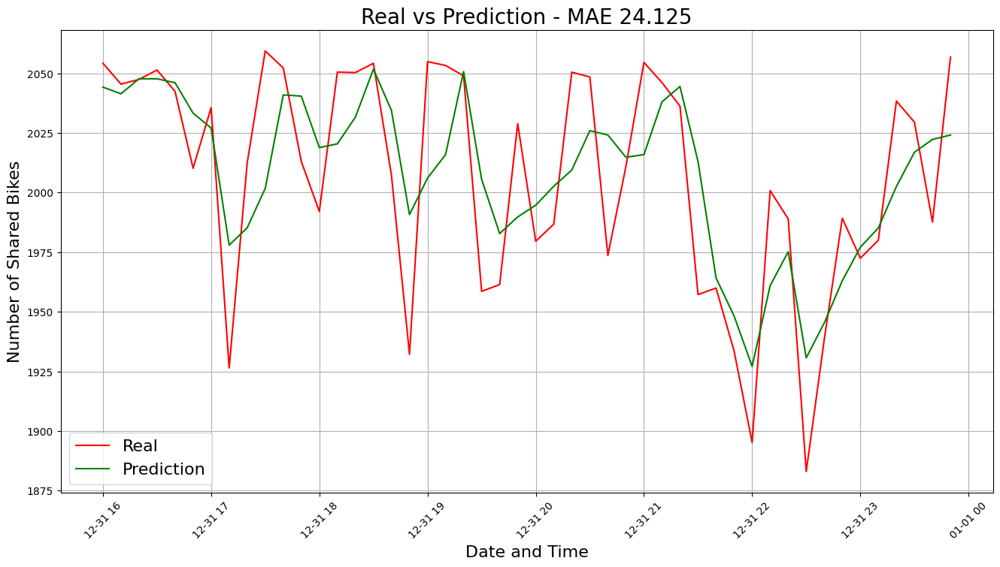

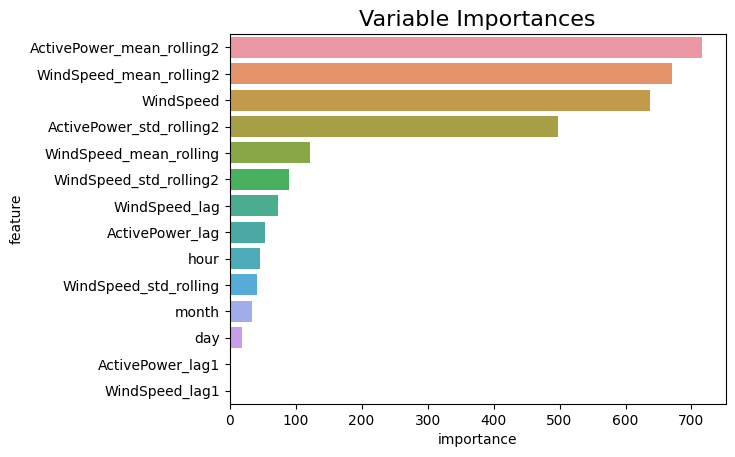


Table for Best Iteration - MAE: 24.125
                          Date and Time  Real ActivePower  \
DATE                                                        
2020-12-31 16:00:00 2020-12-31 16:00:00        2054.23077   
2020-12-31 16:10:00 2020-12-31 16:10:00        2045.48718   
2020-12-31 16:20:00 2020-12-31 16:20:00        2047.45000   
2020-12-31 16:30:00 2020-12-31 16:30:00        2051.38462   
2020-12-31 16:40:00 2020-12-31 16:40:00        2042.43590   
2020-12-31 16:50:00 2020-12-31 16:50:00        2010.20000   
2020-12-31 17:00:00 2020-12-31 17:00:00        2035.65000   
2020-12-31 17:10:00 2020-12-31 17:10:00        1926.47500   
2020-12-31 17:20:00 2020-12-31 17:20:00        2012.47500   
2020-12-31 17:30:00 2020-12-31 17:30:00        2059.40000   
2020-12-31 17:40:00 2020-12-31 17:40:00        2052.26316   
2020-12-31 17:50:00 2020-12-31 17:50:00        2013.02632   
2020-12-31 18:00:00 2020-12-31 18:00:00        1992.07895   
2020-12-31 18:10:00 2020-12-31 18:10:00      

In [41]:
# Best 3 Iterations:
best_iterations = [
    {'Lag': 48, 'Window': 10, 'MAE': 27.337, 'MSE': 1004.36, 'MAPE': 1.364},
    {'Lag': 12, 'Window': 2, 'MAE': 25.293, 'MSE': 1005.601, 'MAPE': 1.271},
    {'Lag': 48, 'Window': 3, 'MAE': 27.78, 'MSE': 1133.359, 'MAPE': 1.397}
]

# Call the training function for the three different sets of lag and window values
for i, iteration in enumerate(best_iterations, 1):
    lag_value = iteration['Lag']
    window_value = iteration['Window']
    print(f"Training for Best Iteration {i}: Lag={lag_value}, Window={window_value}")
    
    # Filter the DataFrame with the current lag and window values
    df_filtered = df.copy()
    df_filtered['ActivePower_lag1'] = df_filtered['ActivePower'].shift(lag_value)
    df_filtered['WindSpeed_lag1'] = df_filtered['WindSpeed'].shift(lag_value)
    df_filtered['ActivePower_mean_rolling2'] = df_filtered['ActivePower'].rolling(window=window_value).mean()
    df_filtered['ActivePower_std_rolling2'] = df_filtered['ActivePower'].rolling(window=window_value).std()
    df_filtered['WindSpeed_mean_rolling2'] = df_filtered['WindSpeed'].rolling(window=window_value).mean()
    df_filtered['WindSpeed_std_rolling2'] = df_filtered['WindSpeed'].rolling(window=window_value).std()

    # Call the training function with the filtered DataFrame
    train_time_series_with_folds(df_filtered, horizon=48)


- horizon of 48= 480 minutes = 8 hours
- Lag=12, Window=2 seems like the best set 

# For every Turbine 

In [91]:
def train_time_series_with_folds(df, horizon=48):
    #df.drop(['WF', 'WT','Index'], axis=1, inplace=True)
    df.drop(['WF', 'WT','Index'], axis=1, inplace=True)
    df['DATE'] = pd.to_datetime(df['DATE'])
    #set datetime as index
    df = df.set_index(df.DATE)
    #drop datetime column
    df.drop('DATE', axis=1, inplace=True)

    #create hour, day and month variables from datetime index
    #df['hour'] = df.index.hour
    #df['day'] = df.index.day
    #df['month'] = df.index.month
    #df['ActivePower_lag1'] = df['ActivePower'].shift(12)
    #df['WindSpeed_lag1'] = df['WindSpeed'].shift(12)

# Create rolling statistics (mean and standard deviation) for ActivePower and WindSpeed over a window of 2 time steps
    df['ActivePower_mean_rolling2'] = df['ActivePower'].rolling(window=2).mean()
    df['ActivePower_std_rolling2'] = df['ActivePower'].rolling(window=2).std()
    df['WindSpeed_mean_rolling2'] = df['WindSpeed'].rolling(window=2).mean()
    df['WindSpeed_std_rolling2'] = df['WindSpeed'].rolling(window=2).std()
    X = df.drop('ActivePower', axis=1)
    y = df['ActivePower']
    
    # Take last part of the dataset for validation
    X_train, X_test = X.iloc[:-horizon, :], X.iloc[-horizon:, :]
    y_train, y_test = y.iloc[:-horizon], y.iloc[-horizon:]
   
    # Create, train and do inference of the model
    model = LGBMRegressor(random_state=42)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    residuals=y_test-predictions
    # Calculate MAE
    mae = np.round(mean_absolute_error(y_test, predictions), 3)
    print(f'Mean Absolute Error (MAE): {mae}')

    # Calculate MSE
    mse = np.round(mean_squared_error(y_test, predictions), 3)
    print(f'Mean Squared Error (MSE): {mse}')

    # Calculate MAPE
    mape = np.round(np.mean(np.abs((y_test - predictions) / y_test)) * 100, 3)
    print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

    # Plot reality vs prediction for the last week of the dataset
    fig, ax = plt.subplots(figsize=(16, 8))
    plt.title(f'Real vs Prediction - MAE {mae}', fontsize=20)
    ax.plot(y_test.index, y_test, color='red', label='Real')
    ax.plot(y_test.index, predictions, color='green', label='Prediction')
    plt.xlabel('Date and Time', fontsize=16)
    plt.ylabel('Number of Shared Bikes', fontsize=16)
    plt.legend(fontsize=16)
    plt.grid()
    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
    plt.show()

    # Create a dataframe with the variable importances of the model
    df_importances = pd.DataFrame({
        'feature': model.feature_name_,
        'importance': model.feature_importances_
    }).sort_values(by='importance', ascending=False)

    # Plot variable importances of the model
    plt.title('Variable Importances', fontsize=16)
    sns.barplot(x=df_importances.importance, y=df_importances.feature, orient='h')
    plt.show()
    
    # Store real, prediction, and date and time values for the last week of the dataset
    

    # Print the table
    #print(f"\nTable for Best Iteration - MAE: {mae}")
    #print(table_data)

    return mae, mse, mape,predictions, residuals

In [92]:
# Function to apply train_time_series_with_folds to txt files in a folder
def apply_train_time_series_to_files(folder_path, horizon=48):
    # Initialize lists to store results for each file
    files_list = []
    mae_list = []
    mse_list = []
    mape_list = []
    res_list=[]
    # Get a list of all files in the folder
    files = os.listdir(folder_path)

    # Loop through each file in the folder
    for file in files:
        # Check if the file is a txt file
        if file.endswith(".txt"):
            # Read the file as a DataFrame
            file_path = os.path.join(folder_path, file)
            df = pd.read_csv(file_path, sep='\t')

            # Print the file name
            print(f"File: {file}")

            # Call the train_time_series_with_folds function for the current DataFrame
            mae, mse, mape, predictions,residuals = train_time_series_with_folds(df, horizon)

            # Append results to lists
            files_list.append(file)
            mae_list.append(mae)
            mse_list.append(mse)
            mape_list.append(mape)
            res_list.append(residuals)


    # Create a DataFrame to display the results
    results_df = pd.DataFrame({
        'File': files_list,
        'MAE': mae_list,
        'MSE': mse_list,
        'MAPE': mape_list
    })

    # Print the results table
    print("\nResults Table:")
    print(results_df)

File: arganil_turbine_1.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 54732, number of used features: 5
[LightGBM] [Info] Start training from score 806.368736
Mean Absolute Error (MAE): 119.81
Mean Squared Error (MSE): 30734.78
Mean Absolute Percentage Error (MAPE): 15.533%


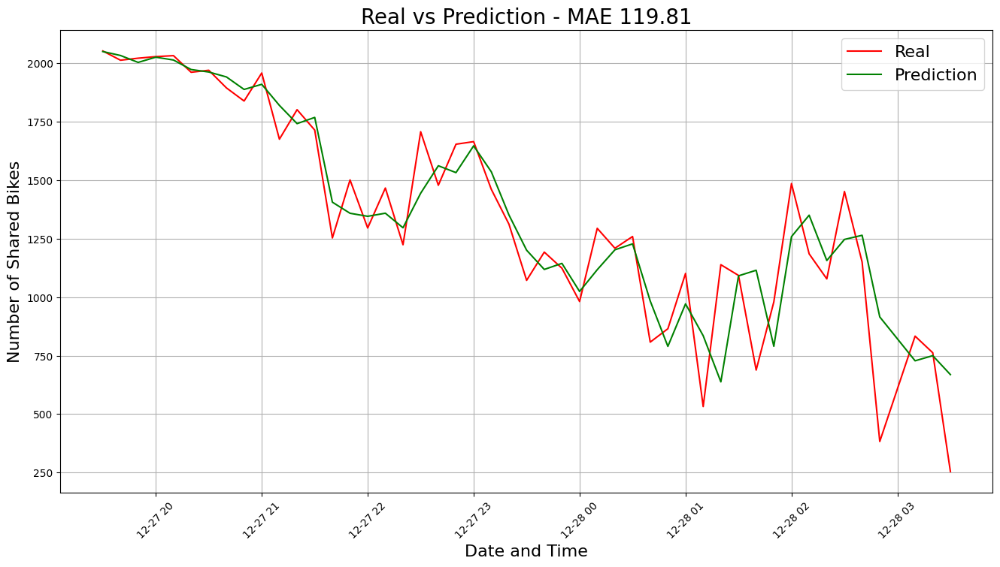

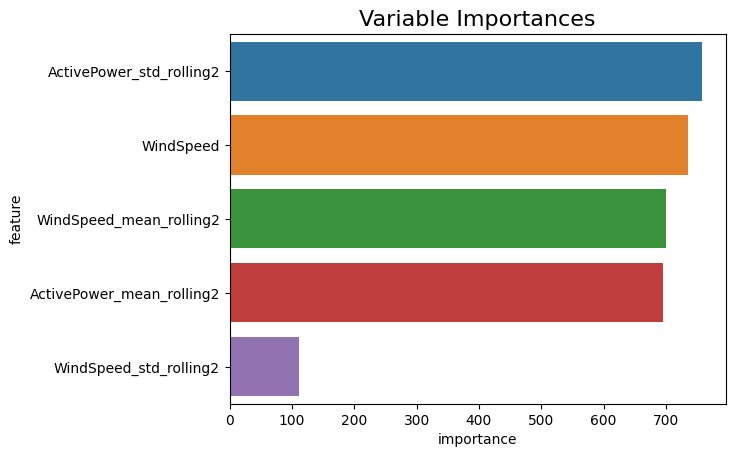

File: arganil_turbine_10.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55760, number of used features: 5
[LightGBM] [Info] Start training from score 714.964205
Mean Absolute Error (MAE): 19.629
Mean Squared Error (MSE): 1056.32
Mean Absolute Percentage Error (MAPE): 1.034%


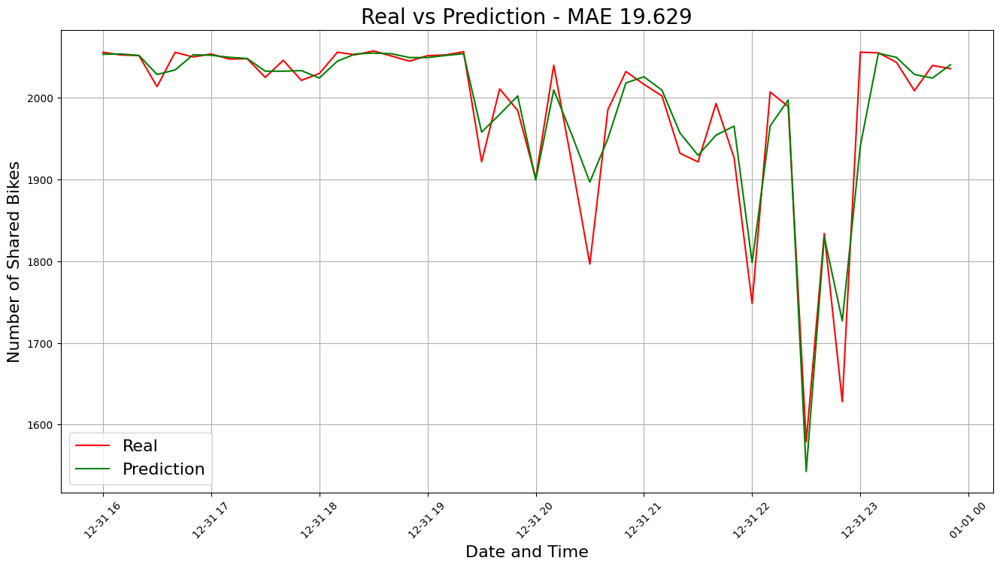

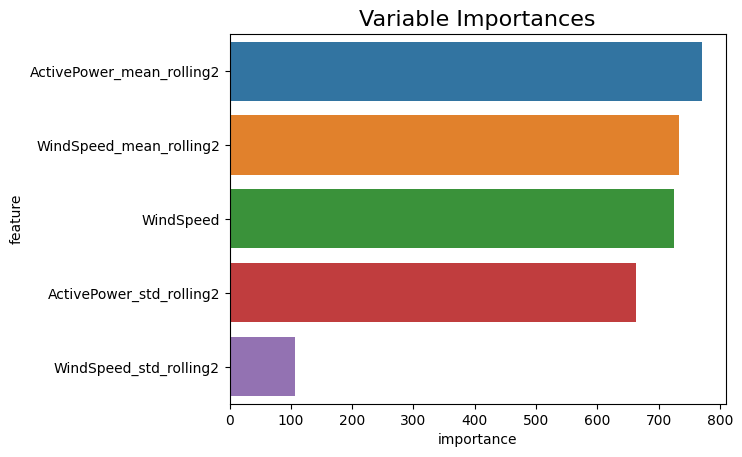

File: arganil_turbine_11.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55423, number of used features: 5
[LightGBM] [Info] Start training from score 730.811036
Mean Absolute Error (MAE): 82.697
Mean Squared Error (MSE): 15259.734
Mean Absolute Percentage Error (MAPE): inf%


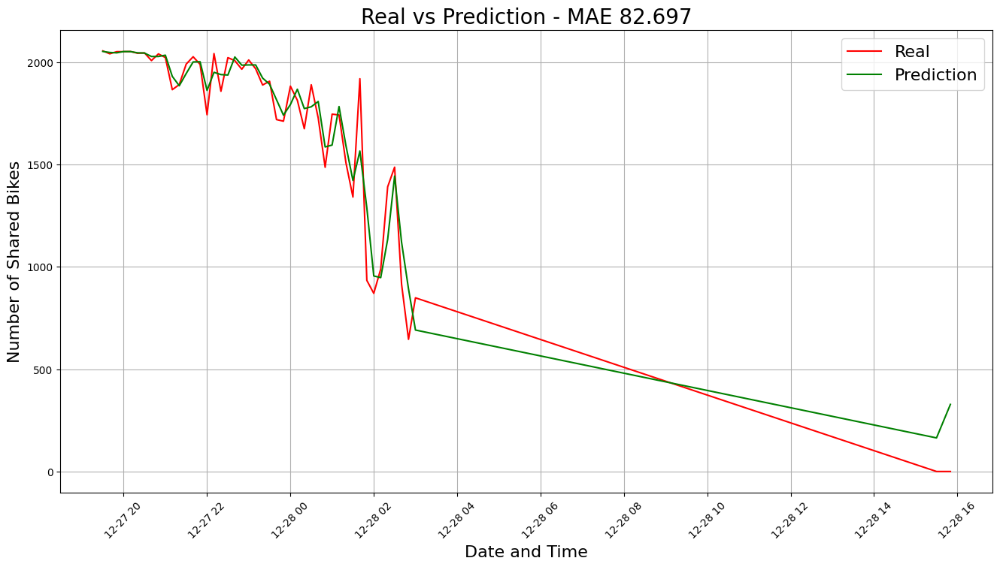

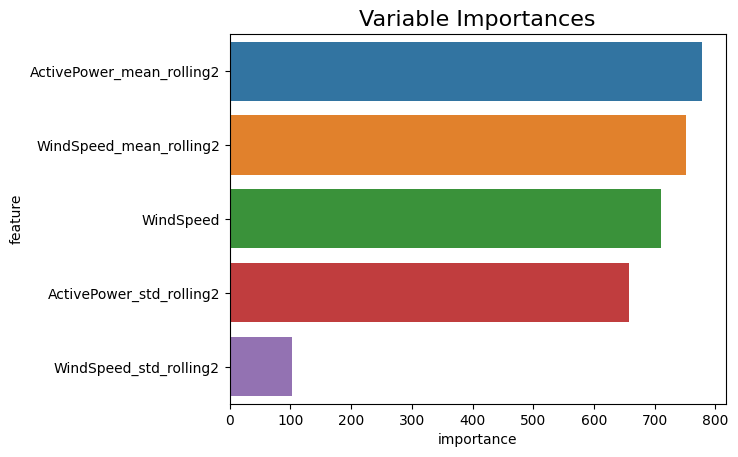

File: arganil_turbine_12.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55900, number of used features: 5
[LightGBM] [Info] Start training from score 735.891165
Mean Absolute Error (MAE): 14.611
Mean Squared Error (MSE): 401.792
Mean Absolute Percentage Error (MAPE): 0.766%


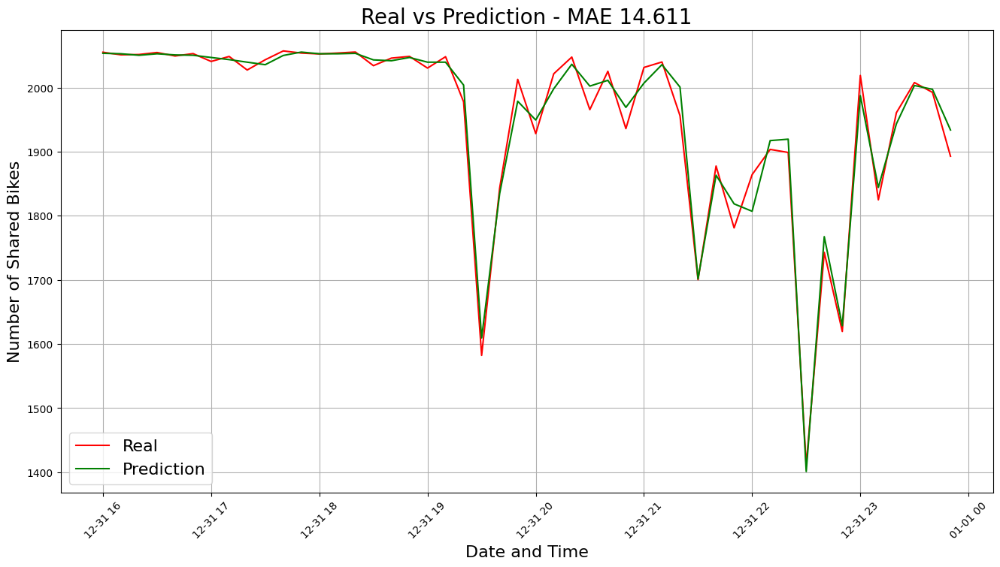

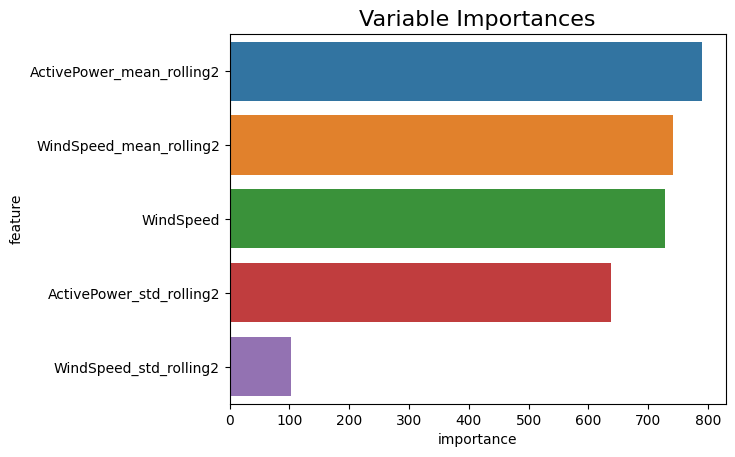

File: arganil_turbine_13.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55843, number of used features: 5
[LightGBM] [Info] Start training from score 739.722579
Mean Absolute Error (MAE): 16.028
Mean Squared Error (MSE): 425.596
Mean Absolute Percentage Error (MAPE): 0.847%


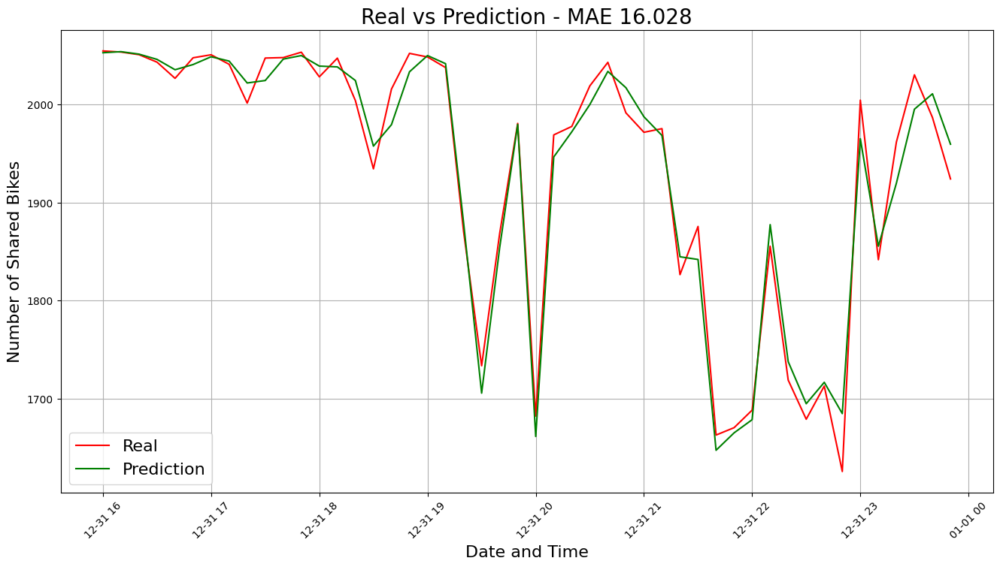

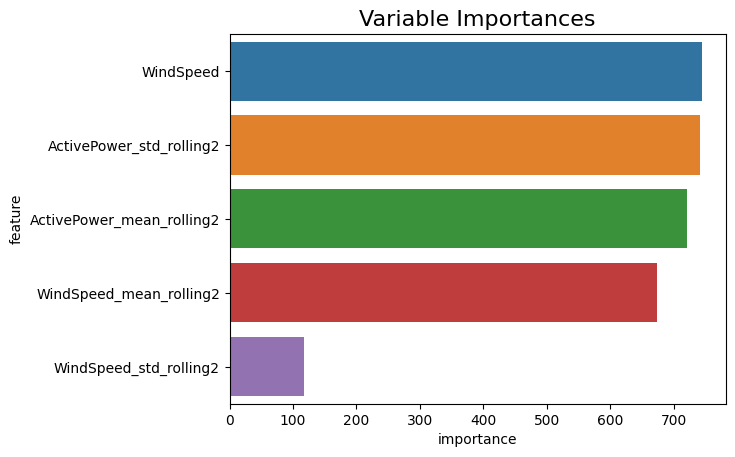

File: arganil_turbine_14.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56195, number of used features: 5
[LightGBM] [Info] Start training from score 757.672457
Mean Absolute Error (MAE): 21.366
Mean Squared Error (MSE): 912.668
Mean Absolute Percentage Error (MAPE): 1.177%


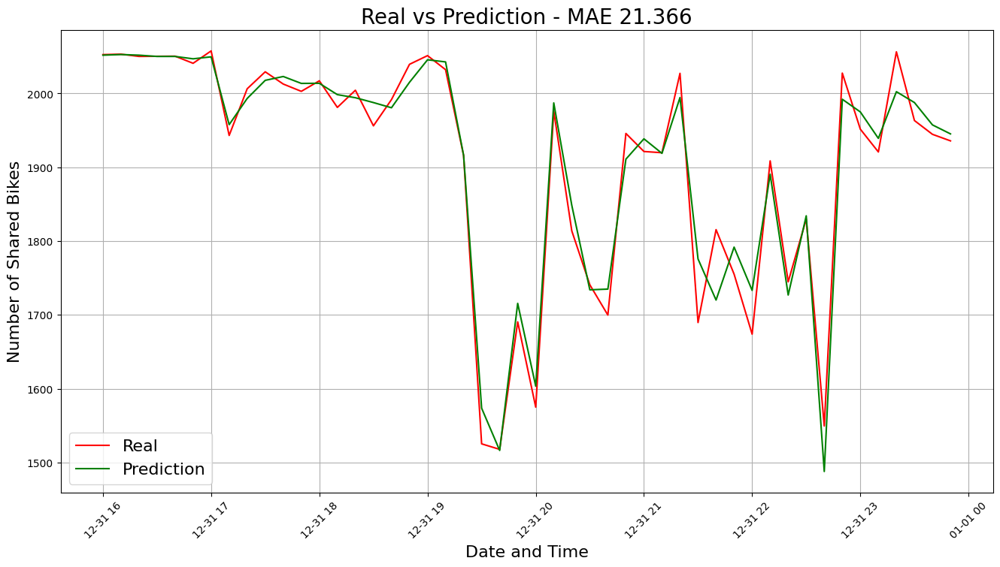

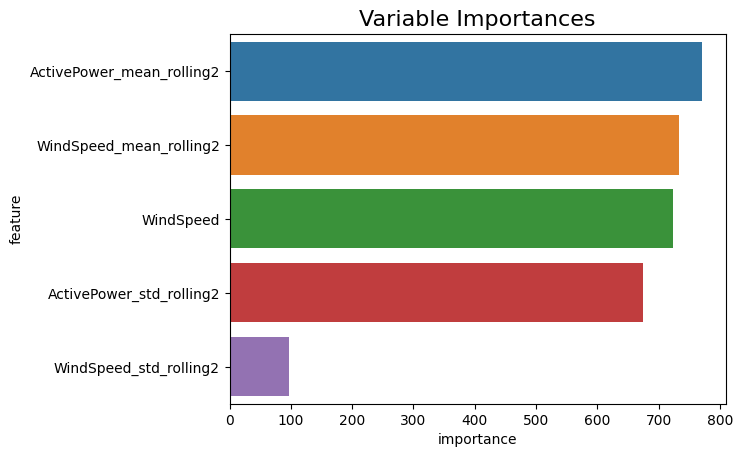

File: arganil_turbine_15.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56359, number of used features: 5
[LightGBM] [Info] Start training from score 762.194336
Mean Absolute Error (MAE): 14.658
Mean Squared Error (MSE): 378.888
Mean Absolute Percentage Error (MAPE): 0.754%


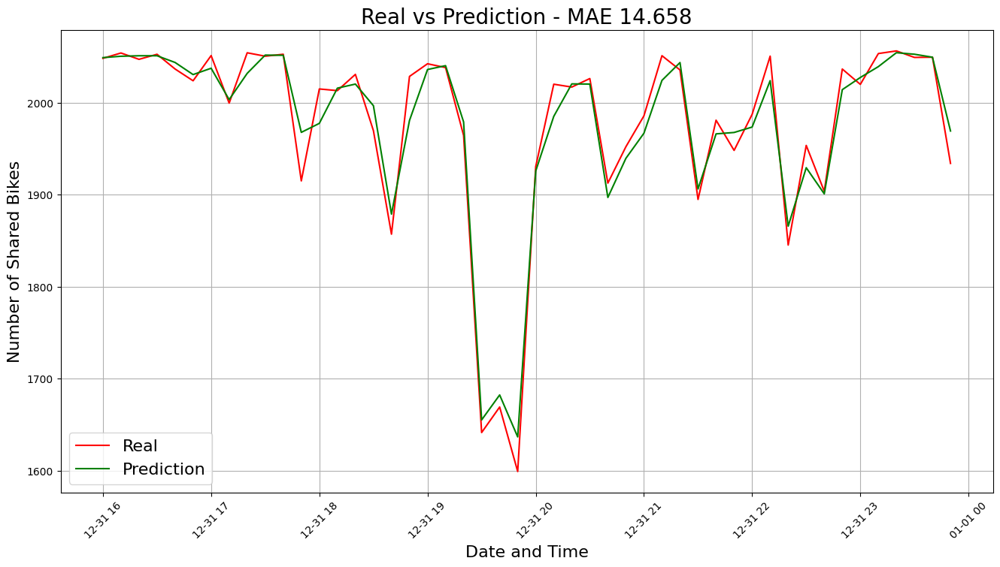

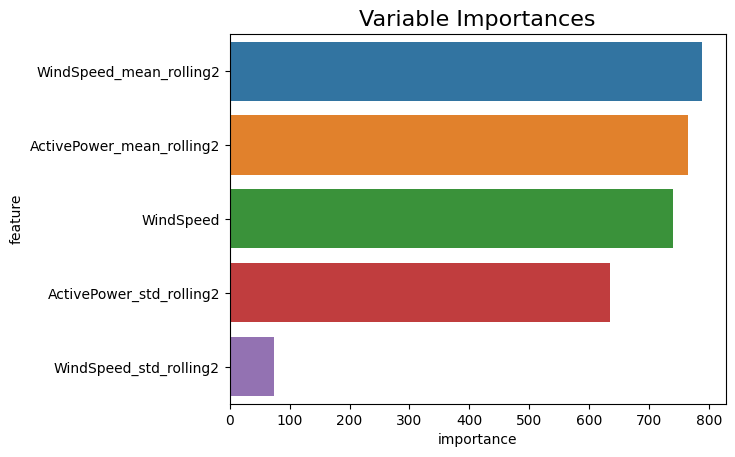

File: arganil_turbine_16.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56116, number of used features: 5
[LightGBM] [Info] Start training from score 791.385402
Mean Absolute Error (MAE): 17.413
Mean Squared Error (MSE): 505.756
Mean Absolute Percentage Error (MAPE): 0.877%


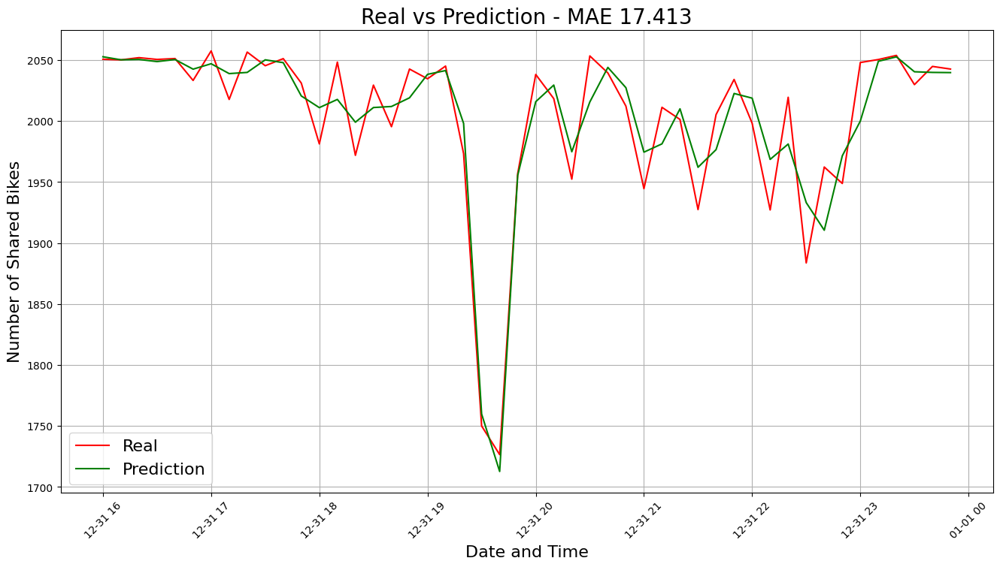

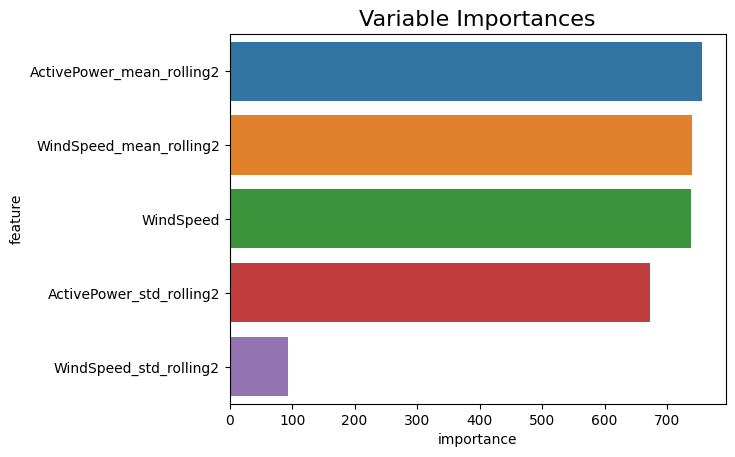

File: arganil_turbine_17.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55611, number of used features: 5
[LightGBM] [Info] Start training from score 783.551221
Mean Absolute Error (MAE): 27.191
Mean Squared Error (MSE): 2243.717
Mean Absolute Percentage Error (MAPE): 1.465%


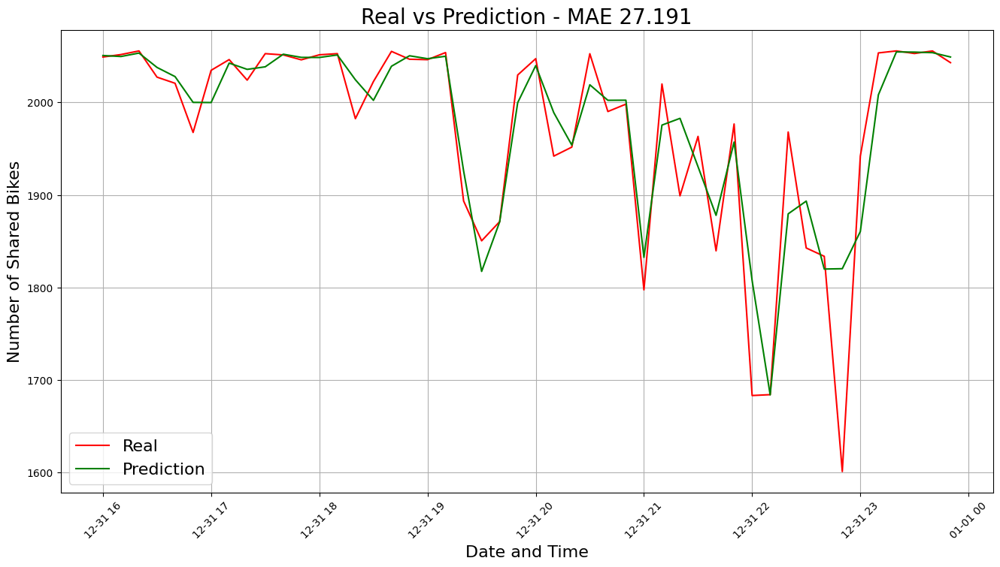

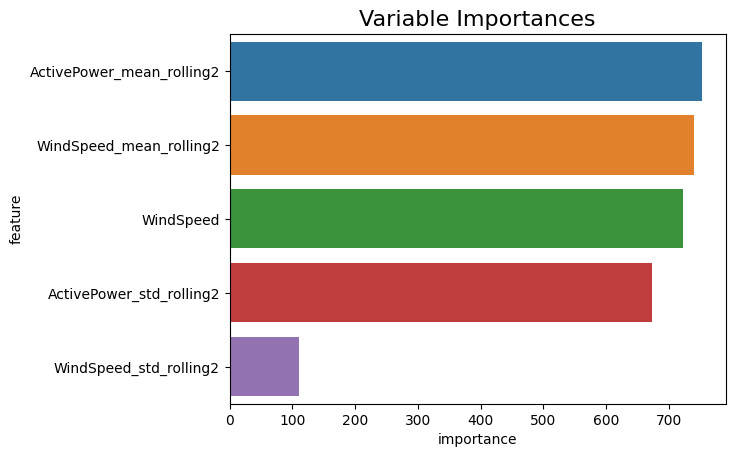

File: arganil_turbine_18.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55002, number of used features: 5
[LightGBM] [Info] Start training from score 731.746295
Mean Absolute Error (MAE): 26.059
Mean Squared Error (MSE): 1864.203
Mean Absolute Percentage Error (MAPE): 1.54%


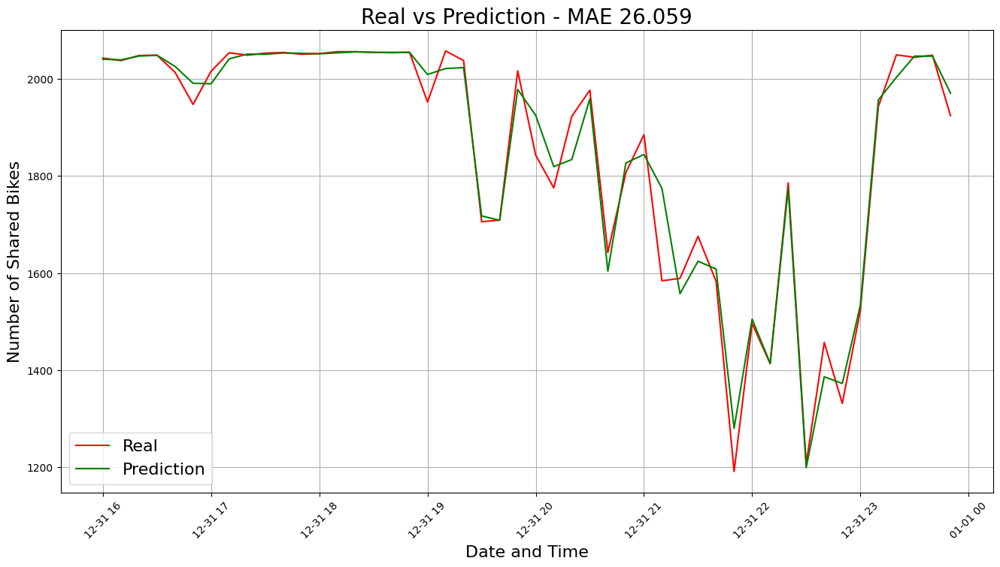

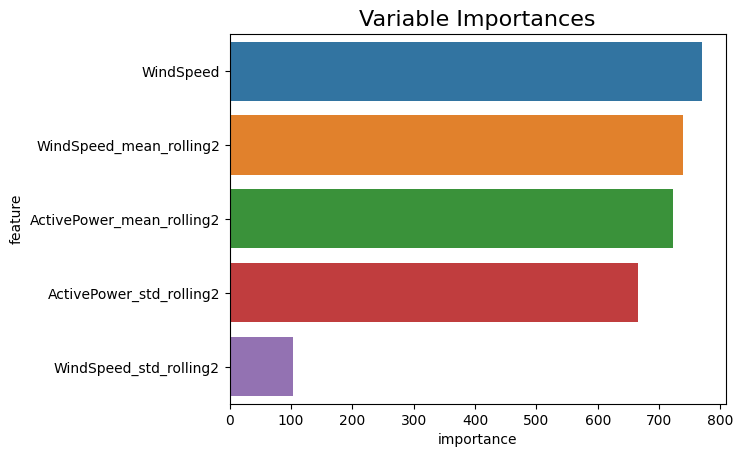

File: arganil_turbine_2.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 5
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 17.224
Mean Squared Error (MSE): 503.638
Mean Absolute Percentage Error (MAPE): 0.863%


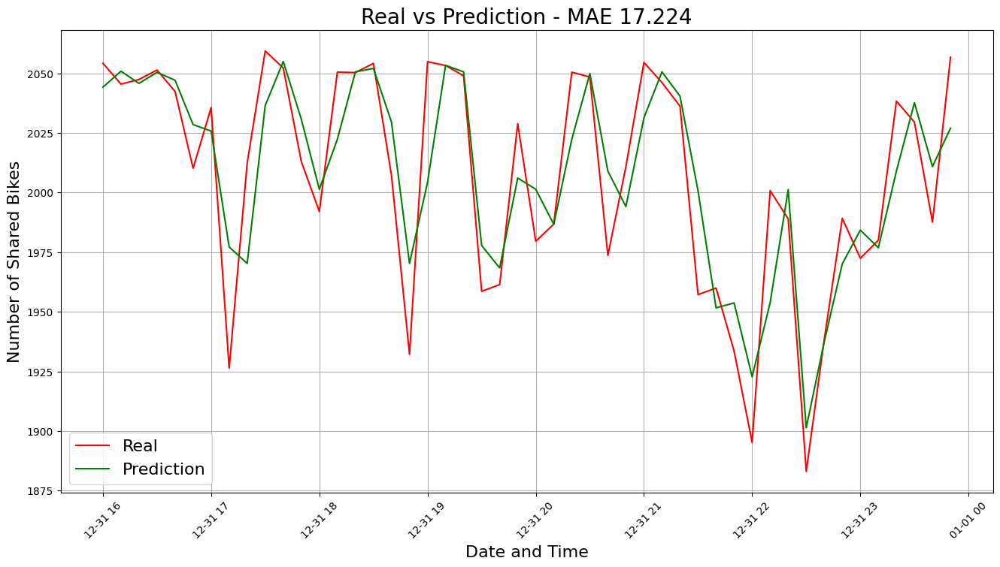

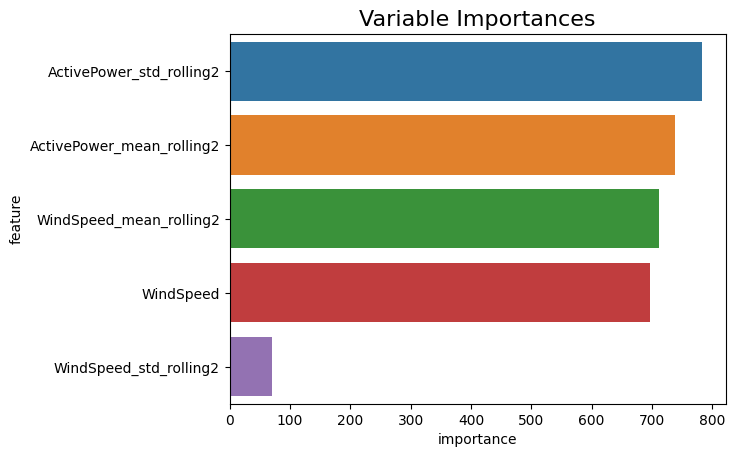

File: arganil_turbine_3.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 54931, number of used features: 5
[LightGBM] [Info] Start training from score 792.631686
Mean Absolute Error (MAE): 95.618
Mean Squared Error (MSE): 22393.582
Mean Absolute Percentage Error (MAPE): 9.221%


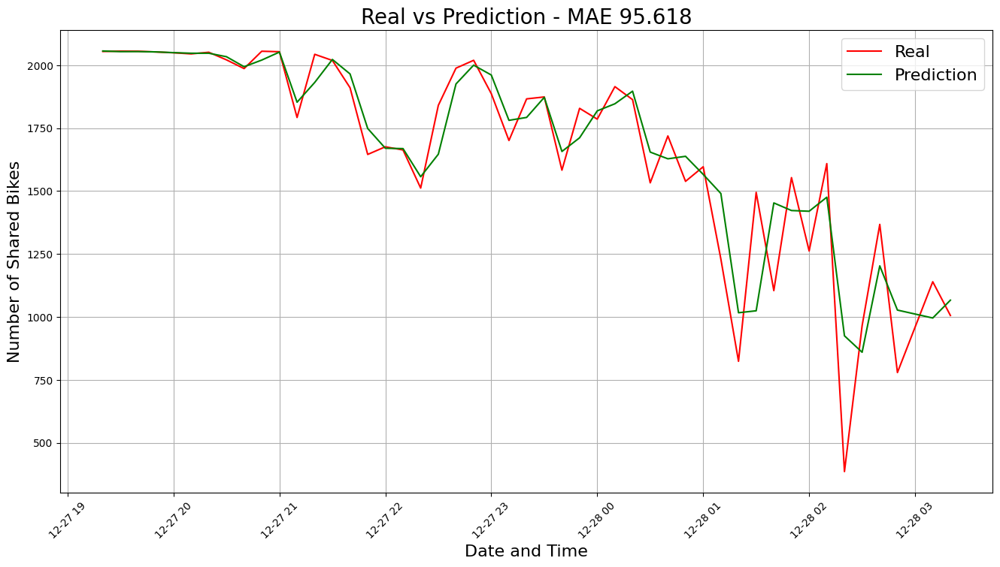

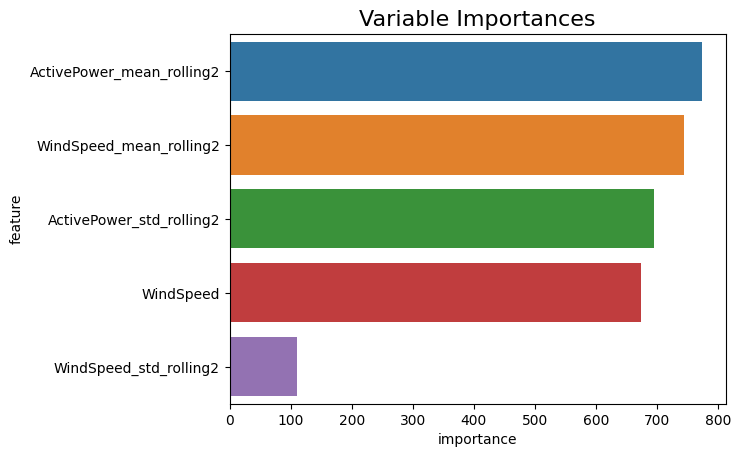

File: arganil_turbine_4.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55514, number of used features: 5
[LightGBM] [Info] Start training from score 783.374509
Mean Absolute Error (MAE): 92.795
Mean Squared Error (MSE): 17246.596
Mean Absolute Percentage Error (MAPE): 11.517%


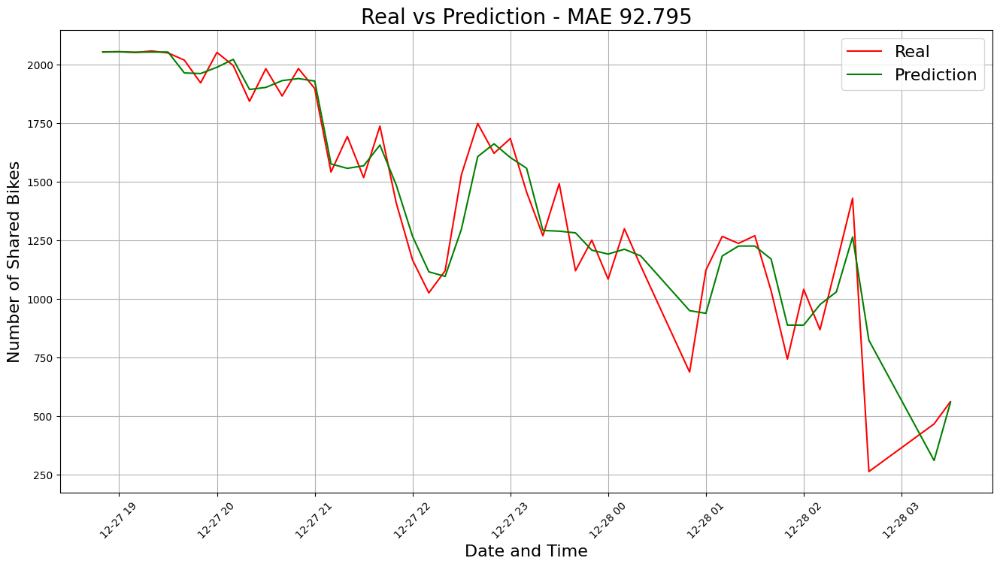

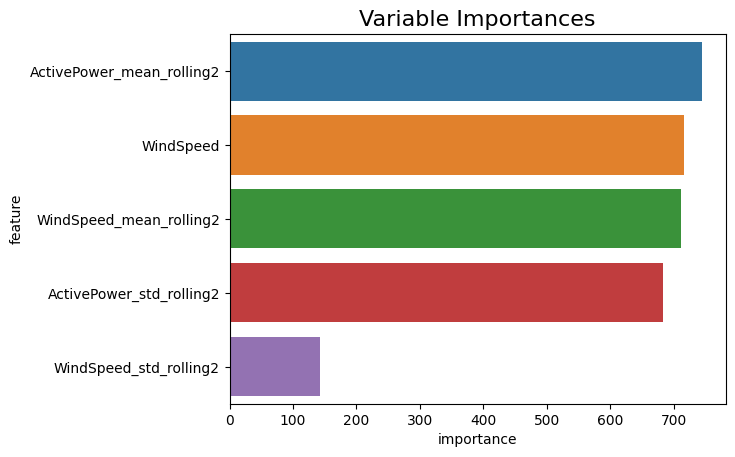

File: arganil_turbine_5.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55420, number of used features: 5
[LightGBM] [Info] Start training from score 748.531950
Mean Absolute Error (MAE): 102.558
Mean Squared Error (MSE): 22293.972
Mean Absolute Percentage Error (MAPE): 19.363%


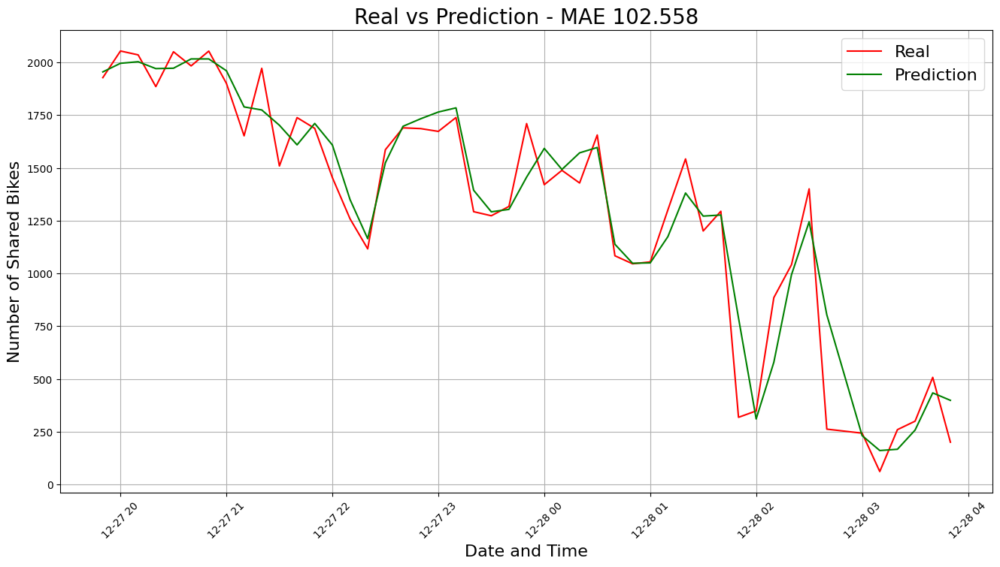

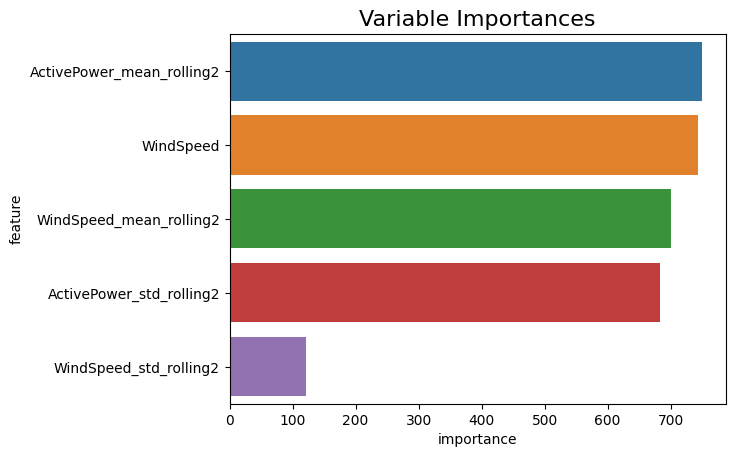

File: arganil_turbine_6.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55635, number of used features: 5
[LightGBM] [Info] Start training from score 736.620922
Mean Absolute Error (MAE): 75.734
Mean Squared Error (MSE): 18073.816
Mean Absolute Percentage Error (MAPE): 15.614%


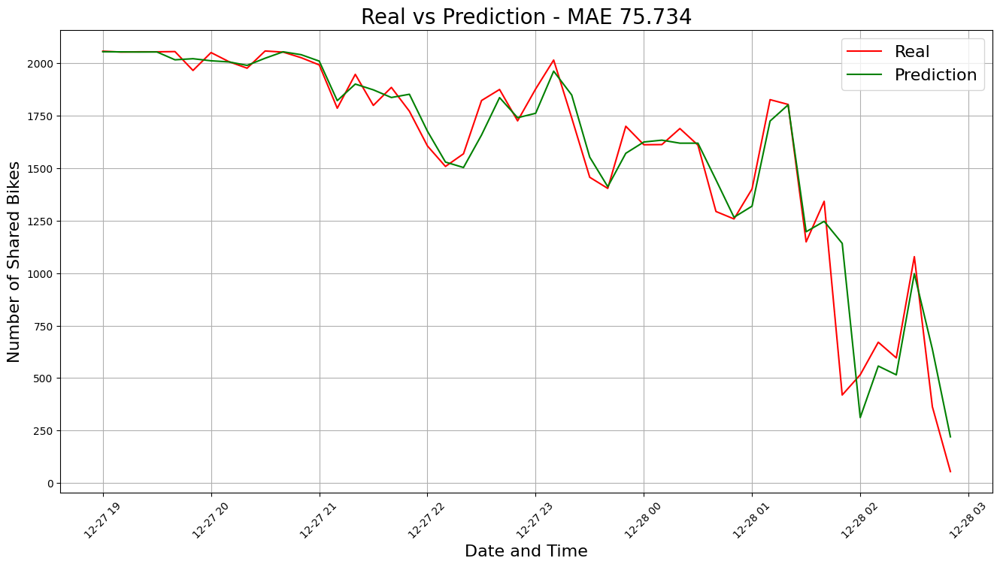

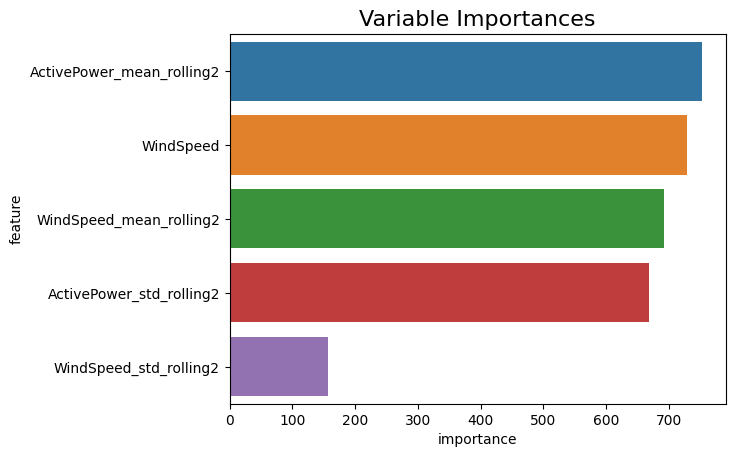

File: arganil_turbine_7.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55643, number of used features: 5
[LightGBM] [Info] Start training from score 718.891073
Mean Absolute Error (MAE): 45.082
Mean Squared Error (MSE): 14488.372
Mean Absolute Percentage Error (MAPE): 4.814%


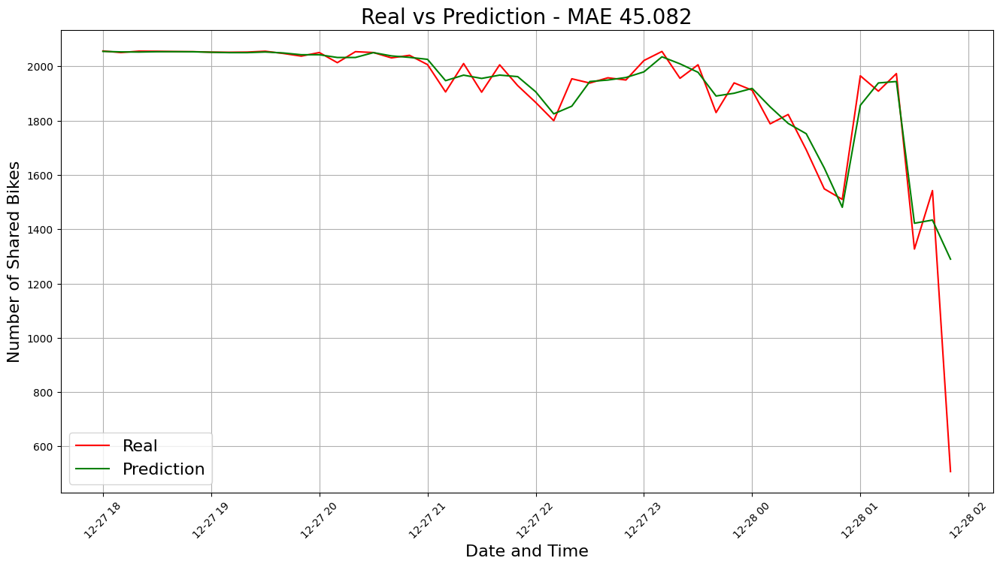

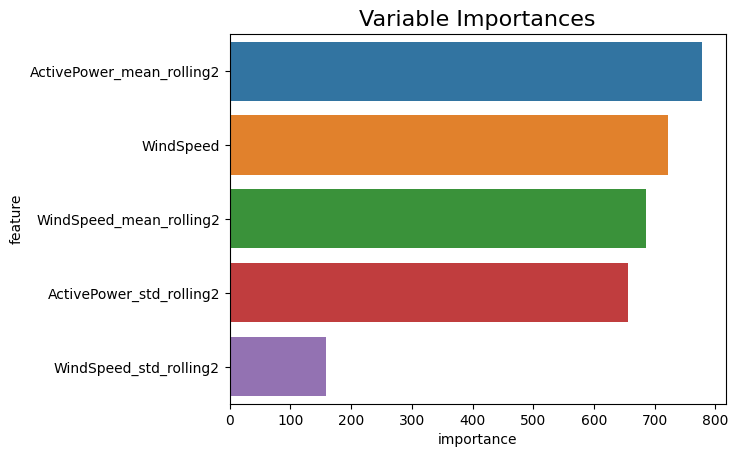

File: arganil_turbine_8.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55523, number of used features: 5
[LightGBM] [Info] Start training from score 708.998140
Mean Absolute Error (MAE): 18.46
Mean Squared Error (MSE): 859.466
Mean Absolute Percentage Error (MAPE): 0.94%


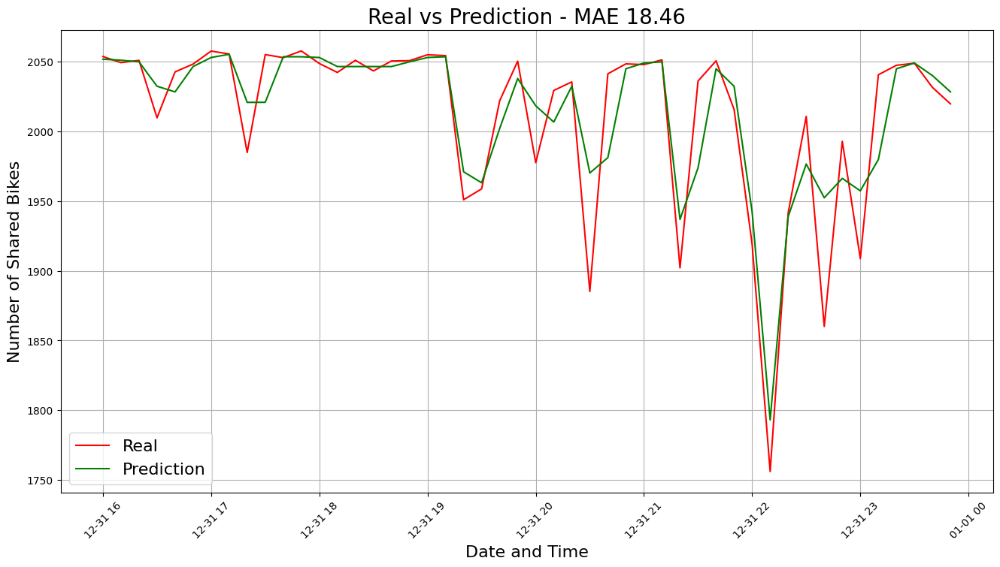

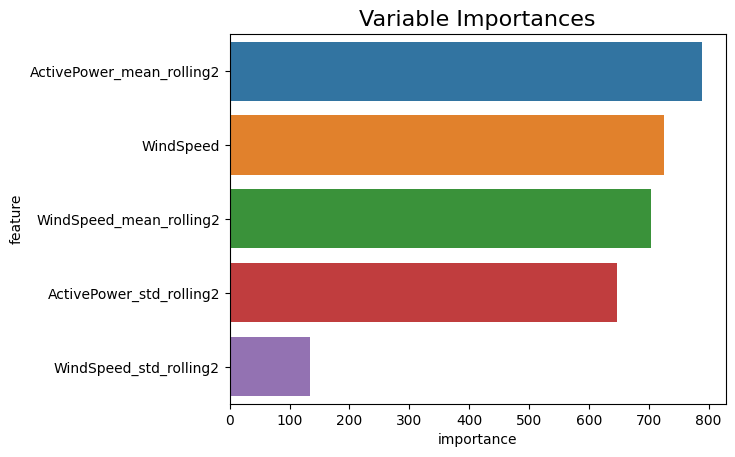

File: arganil_turbine_9.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56125, number of used features: 5
[LightGBM] [Info] Start training from score 691.638510
Mean Absolute Error (MAE): 19.761
Mean Squared Error (MSE): 830.978
Mean Absolute Percentage Error (MAPE): 1.034%


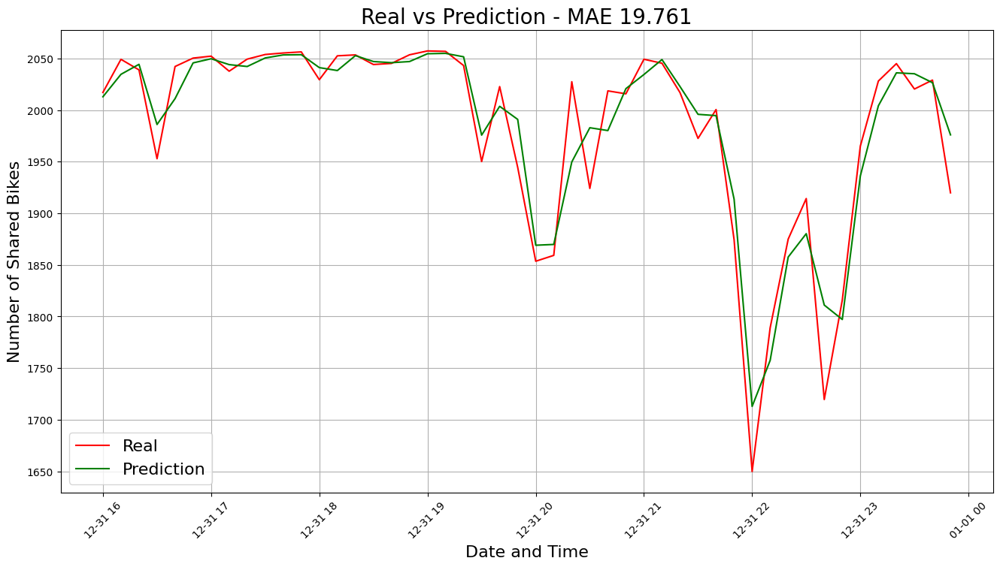

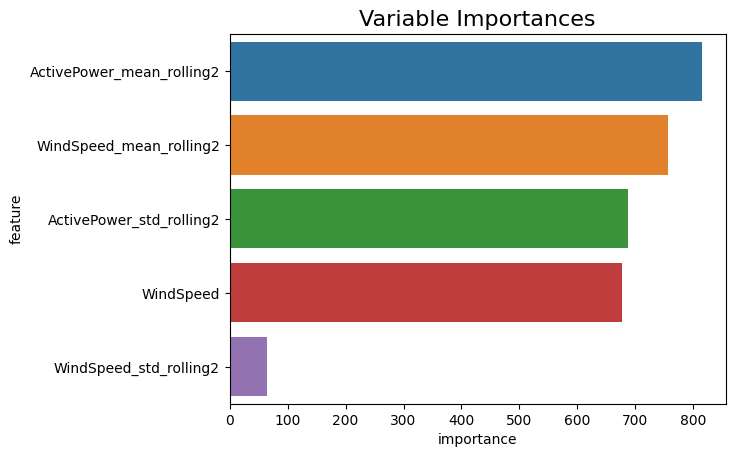


Results Table:
                      File      MAE        MSE    MAPE
0    arganil_turbine_1.txt  119.810  30734.780  15.533
1   arganil_turbine_10.txt   19.629   1056.320   1.034
2   arganil_turbine_11.txt   82.697  15259.734     inf
3   arganil_turbine_12.txt   14.611    401.792   0.766
4   arganil_turbine_13.txt   16.028    425.596   0.847
5   arganil_turbine_14.txt   21.366    912.668   1.177
6   arganil_turbine_15.txt   14.658    378.888   0.754
7   arganil_turbine_16.txt   17.413    505.756   0.877
8   arganil_turbine_17.txt   27.191   2243.717   1.465
9   arganil_turbine_18.txt   26.059   1864.203   1.540
10   arganil_turbine_2.txt   17.224    503.638   0.863
11   arganil_turbine_3.txt   95.618  22393.582   9.221
12   arganil_turbine_4.txt   92.795  17246.596  11.517
13   arganil_turbine_5.txt  102.558  22293.972  19.363
14   arganil_turbine_6.txt   75.734  18073.816  15.614
15   arganil_turbine_7.txt   45.082  14488.372   4.814
16   arganil_turbine_8.txt   18.460    859.466   

In [93]:
# Call the function with the folder path and horizon
folder_path = ""
horizon = 48
x=apply_train_time_series_to_files(folder_path, horizon)

# Using Plotly

In [95]:
import plotly.graph_objects as go
import pandas as pd
import os

def train_time_series_with_folds(df, file_name, horizon=48):
    #df.drop(['WF', 'WT','Index'], axis=1, inplace=True)
    df.drop(['WF', 'WT','Index'], axis=1, inplace=True)
    df['DATE'] = pd.to_datetime(df['DATE'])
    #set datetime as index
    df = df.set_index(df.DATE)
    #drop datetime column
    df.drop('DATE', axis=1, inplace=True)

    #create hour, day and month variables from datetime index
    df['hour'] = df.index.hour
    df['day'] = df.index.day
    df['month'] = df.index.month
    df['ActivePower_lag1'] = df['ActivePower'].shift(12)
    df['WindSpeed_lag1'] = df['WindSpeed'].shift(12)

# Create rolling statistics (mean and standard deviation) for ActivePower and WindSpeed over a window of 2 time steps
    df['ActivePower_mean_rolling2'] = df['ActivePower'].rolling(window=2).mean()
    df['ActivePower_std_rolling2'] = df['ActivePower'].rolling(window=2).std()
    df['WindSpeed_mean_rolling2'] = df['WindSpeed'].rolling(window=2).mean()
    df['WindSpeed_std_rolling2'] = df['WindSpeed'].rolling(window=2).std()
    X = df.drop('ActivePower', axis=1)
    y = df['ActivePower']
    
    # Take last part of the dataset for validation
    X_train, X_test = X.iloc[:-horizon, :], X.iloc[-horizon:, :]
    y_train, y_test = y.iloc[:-horizon], y.iloc[-horizon:]

    # Create, train and do inference of the model
    model = LGBMRegressor(random_state=42)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Calculate MAE
    mae = np.round(mean_absolute_error(y_test, predictions), 3)
    print(f'Mean Absolute Error (MAE): {mae}')

    # Calculate MSE
    mse = np.round(mean_squared_error(y_test, predictions), 3)
    print(f'Mean Squared Error (MSE): {mse}')

    # Calculate MAPE
    mape = np.round(np.mean(np.abs((y_test - predictions) / y_test)) * 100, 3)
    print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

    # Plot reality vs prediction for the last week of the dataset using Plotly
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=y_test.index, y=y_test, mode='lines', name='Real', line=dict(color='red')))
    fig.add_trace(go.Scatter(x=y_test.index, y=predictions, mode='lines', name='Prediction', line=dict(color='green')))

    fig.update_layout(title=f'Real vs Prediction - MAE {mae}', xaxis_title='Date and Time', yaxis_title='AP',
                      legend=dict(font=dict(size=16)))

    fig.show()
    # Save the plot as an image
    #image_path = f"/Users/E708126/OneDrive - EDP/jupyter_notebooks/Synthetic Data/Data/Arganil/Original/plot_{file_name}.png"
    #fig.write_image(image_path)
    print('111')
    # Combine the plot and table in a PDF file
    #pdf_path = f"/Users/E708126/OneDrive - EDP/jupyter_notebooks/Synthetic Data/Data/Arganil/Original/pdf_{file_name}.pdf"
    #doc = SimpleDocTemplate(pdf_path, pagesize=letter)
    #flowables = []
    print('222')
    # Add the plot image to the PDF
    #img = Image(image_path, width=500, height=250)
    #flowables.append(img)

    # Add the table to the PDF
    #table = Table(table_data.values.tolist(), colWidths=100, rowHeights=30)
    #table.setStyle(TableStyle([
     #   ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
      #  ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
       # ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
       # ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        #('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        #('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        #('GRID', (0, 0), (-1, -1), 1, colors.black)
    #]))
    #flowables.append(table)

    #doc.build(flowables)
    return mae, mse, mape, predictions, y_test

def apply_train_time_series_to_files(folder_path, horizon=48):
    # Initialize lists to store results for each file
    files_list = []
    mae_list = []
    mse_list = []
    mape_list = []

    # Get a list of all files in the folder
    files = os.listdir(folder_path)

    # Loop through each file in the folder
    for file in files:
        # Check if the file is a txt file
        if file.endswith(".txt"):
            # Read the file as a DataFrame
            file_path = os.path.join(folder_path, file)
            df = pd.read_csv(file_path, sep='\t')

            # Get the file name without the extension
            file_name = os.path.splitext(file)[0]

            # Print the file name
            print(f"File: {file}")

            # Call the train_time_series_with_folds function for the current DataFrame
            mae, mse, mape, predictions, y_test = train_time_series_with_folds(df, file_name, horizon)

            # Append results to lists
            files_list.append(file)
            mae_list.append(mae)
            mse_list.append(mse)
            mape_list.append(mape)

    # Create a table to display the results
    results_df = pd.DataFrame({
        'File': files_list,
        'MAE': mae_list,
        'MSE': mse_list,
        'MAPE': mape_list
    })

    print("\nResults Table:")
    print(results_df)

# Call the function with the folder path and horizon
folder_path =  ""
horizon = 48
apply_train_time_series_to_files(folder_path, horizon)


File: arganil_turbine_1.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 54732, number of used features: 10
[LightGBM] [Info] Start training from score 806.368736
Mean Absolute Error (MAE): 119.99
Mean Squared Error (MSE): 31169.334
Mean Absolute Percentage Error (MAPE): 15.686%


111
222
File: arganil_turbine_10.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55760, number of used features: 10
[LightGBM] [Info] Start training from score 714.964205
Mean Absolute Error (MAE): 20.457
Mean Squared Error (MSE): 1028.292
Mean Absolute Percentage Error (MAPE): 1.075%


111
222
File: arganil_turbine_11.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55423, number of used features: 10
[LightGBM] [Info] Start training from score 730.811036
Mean Absolute Error (MAE): 80.685
Mean Squared Error (MSE): 15647.348
Mean Absolute Percentage Error (MAPE): inf%


111
222
File: arganil_turbine_12.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55900, number of used features: 10
[LightGBM] [Info] Start training from score 735.891165
Mean Absolute Error (MAE): 17.556
Mean Squared Error (MSE): 588.02
Mean Absolute Percentage Error (MAPE): 0.923%


111
222
File: arganil_turbine_13.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55843, number of used features: 10
[LightGBM] [Info] Start training from score 739.722579
Mean Absolute Error (MAE): 16.75
Mean Squared Error (MSE): 477.94
Mean Absolute Percentage Error (MAPE): 0.883%


111
222
File: arganil_turbine_14.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 56195, number of used features: 10
[LightGBM] [Info] Start training from score 757.672457
Mean Absolute Error (MAE): 21.169
Mean Squared Error (MSE): 935.337
Mean Absolute Percentage Error (MAPE): 1.169%


111
222
File: arganil_turbine_15.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 56359, number of used features: 10
[LightGBM] [Info] Start training from score 762.194336
Mean Absolute Error (MAE): 14.682
Mean Squared Error (MSE): 370.43
Mean Absolute Percentage Error (MAPE): 0.752%


111
222
File: arganil_turbine_16.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 56116, number of used features: 10
[LightGBM] [Info] Start training from score 791.385402
Mean Absolute Error (MAE): 19.095
Mean Squared Error (MSE): 607.731
Mean Absolute Percentage Error (MAPE): 0.962%


111
222
File: arganil_turbine_17.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55611, number of used features: 10
[LightGBM] [Info] Start training from score 783.551221
Mean Absolute Error (MAE): 28.61
Mean Squared Error (MSE): 2333.655
Mean Absolute Percentage Error (MAPE): 1.539%


111
222
File: arganil_turbine_18.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55002, number of used features: 10
[LightGBM] [Info] Start training from score 731.746295
Mean Absolute Error (MAE): 28.846
Mean Squared Error (MSE): 2288.263
Mean Absolute Percentage Error (MAPE): 1.699%


111
222
File: arganil_turbine_2.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 10
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 18.2
Mean Squared Error (MSE): 564.01
Mean Absolute Percentage Error (MAPE): 0.913%


111
222
File: arganil_turbine_3.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 54931, number of used features: 10
[LightGBM] [Info] Start training from score 792.631686
Mean Absolute Error (MAE): 102.227
Mean Squared Error (MSE): 26286.318
Mean Absolute Percentage Error (MAPE): 10.2%


111
222
File: arganil_turbine_4.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55514, number of used features: 10
[LightGBM] [Info] Start training from score 783.374509
Mean Absolute Error (MAE): 98.064
Mean Squared Error (MSE): 19838.834
Mean Absolute Percentage Error (MAPE): 12.358%


111
222
File: arganil_turbine_5.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55420, number of used features: 10
[LightGBM] [Info] Start training from score 748.531950
Mean Absolute Error (MAE): 101.435
Mean Squared Error (MSE): 23735.502
Mean Absolute Percentage Error (MAPE): 19.779%


111
222
File: arganil_turbine_6.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55635, number of used features: 10
[LightGBM] [Info] Start training from score 736.620922
Mean Absolute Error (MAE): 79.888
Mean Squared Error (MSE): 23275.982
Mean Absolute Percentage Error (MAPE): 18.385%


111
222
File: arganil_turbine_7.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55643, number of used features: 10
[LightGBM] [Info] Start training from score 718.891073
Mean Absolute Error (MAE): 44.318
Mean Squared Error (MSE): 12930.443
Mean Absolute Percentage Error (MAPE): 4.623%


111
222
File: arganil_turbine_8.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 55523, number of used features: 10
[LightGBM] [Info] Start training from score 708.998140
Mean Absolute Error (MAE): 20.013
Mean Squared Error (MSE): 913.601
Mean Absolute Percentage Error (MAPE): 1.019%


111
222
File: arganil_turbine_9.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1854
[LightGBM] [Info] Number of data points in the train set: 56125, number of used features: 10
[LightGBM] [Info] Start training from score 691.638510
Mean Absolute Error (MAE): 19.501
Mean Squared Error (MSE): 790.537
Mean Absolute Percentage Error (MAPE): 1.017%


111
222

Results Table:
                      File      MAE        MSE    MAPE
0    arganil_turbine_1.txt  119.990  31169.334  15.686
1   arganil_turbine_10.txt   20.457   1028.292   1.075
2   arganil_turbine_11.txt   80.685  15647.348     inf
3   arganil_turbine_12.txt   17.556    588.020   0.923
4   arganil_turbine_13.txt   16.750    477.940   0.883
5   arganil_turbine_14.txt   21.169    935.337   1.169
6   arganil_turbine_15.txt   14.682    370.430   0.752
7   arganil_turbine_16.txt   19.095    607.731   0.962
8   arganil_turbine_17.txt   28.610   2333.655   1.539
9   arganil_turbine_18.txt   28.846   2288.263   1.699
10   arganil_turbine_2.txt   18.200    564.010   0.913
11   arganil_turbine_3.txt  102.227  26286.318  10.200
12   arganil_turbine_4.txt   98.064  19838.834  12.358
13   arganil_turbine_5.txt  101.435  23735.502  19.779
14   arganil_turbine_6.txt   79.888  23275.982  18.385
15   arganil_turbine_7.txt   44.318  12930.443   4.623
16   arganil_turbine_8.txt   20.013    91

# Residuals

Steps you can take to analyze the noise plot:

-Check for Stationarity

-Check for Autocorrelation

-Check for Residual Patterns

-Check for Constant Variance

-Check for Normality

-Evaluate Model Fit

File: arganil_turbine_1.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 54732, number of used features: 5
[LightGBM] [Info] Start training from score 806.368736
Mean Absolute Error (MAE): 119.81
Mean Squared Error (MSE): 30734.78
Mean Absolute Percentage Error (MAPE): 15.533%


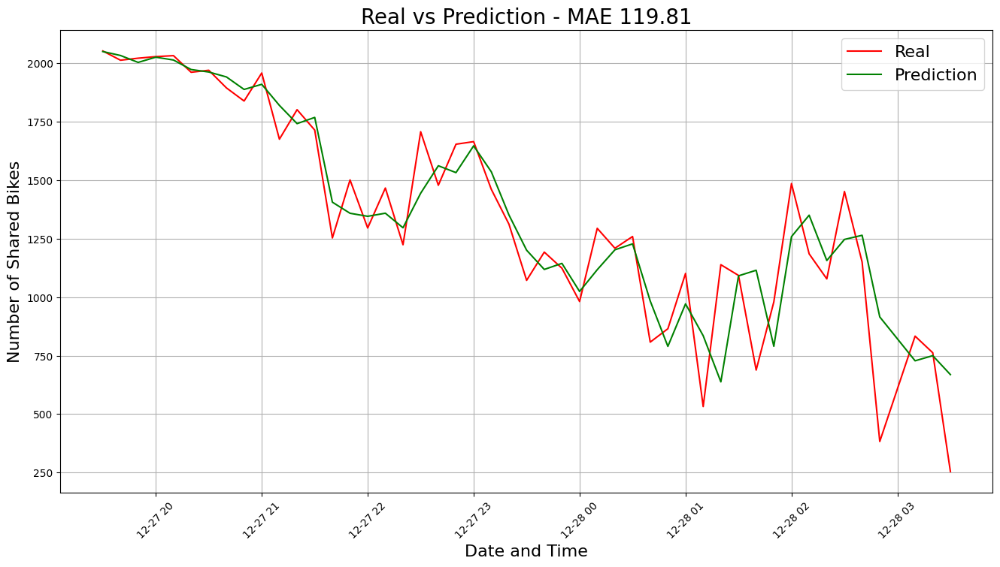

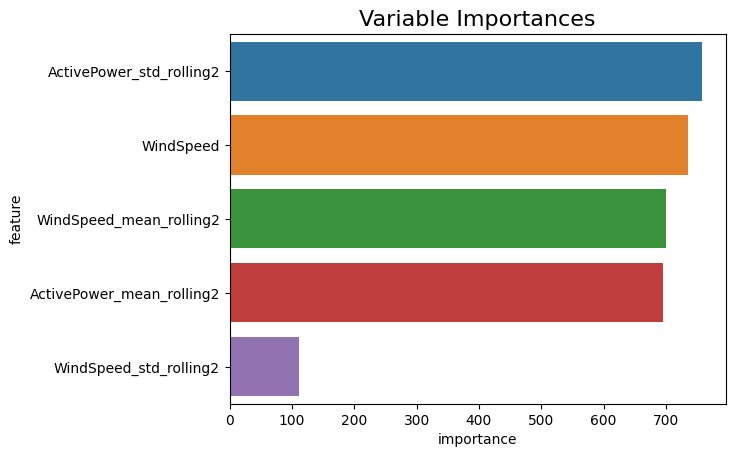

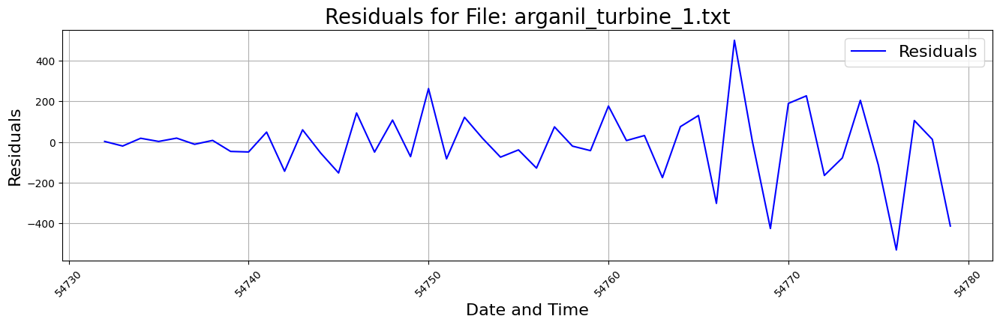

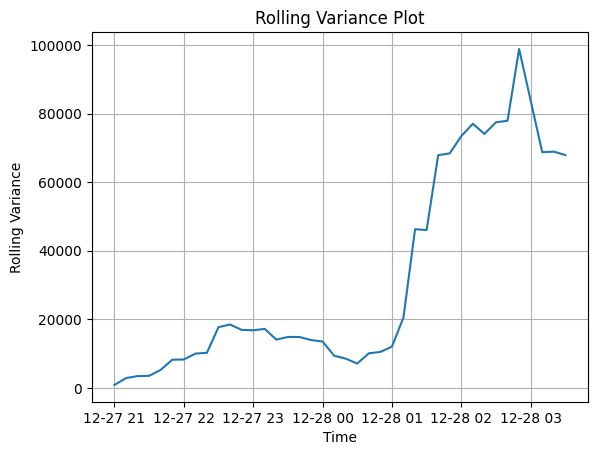

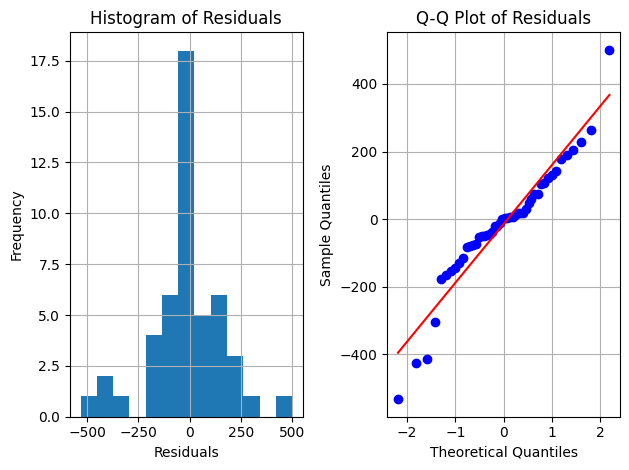

File: arganil_turbine_10.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55760, number of used features: 5
[LightGBM] [Info] Start training from score 714.964205
Mean Absolute Error (MAE): 19.629
Mean Squared Error (MSE): 1056.32
Mean Absolute Percentage Error (MAPE): 1.034%


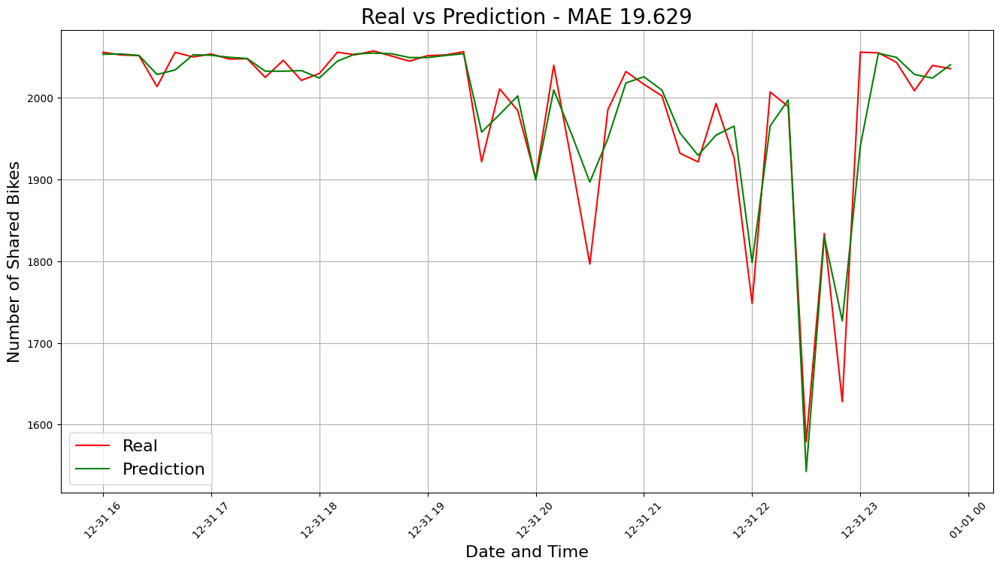

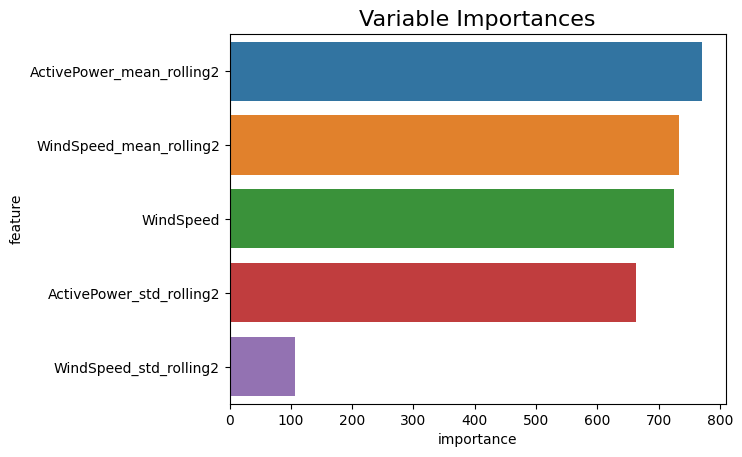

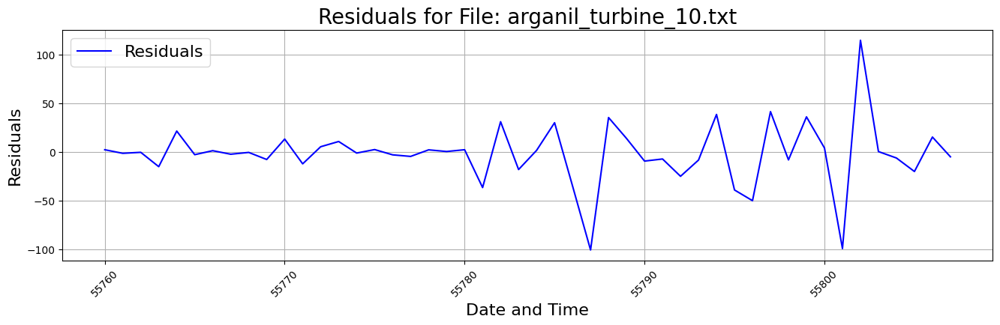

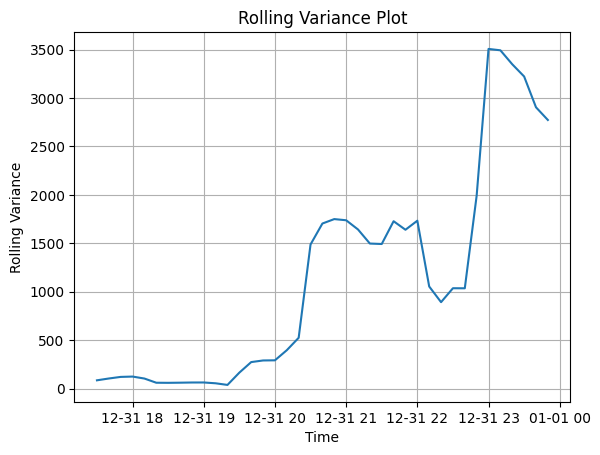

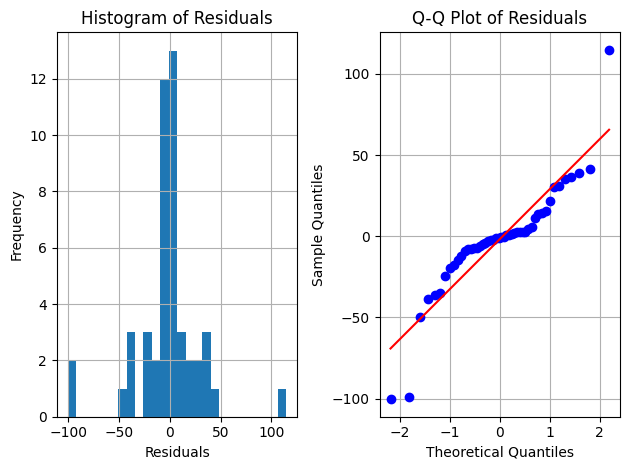

File: arganil_turbine_11.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55423, number of used features: 5
[LightGBM] [Info] Start training from score 730.811036
Mean Absolute Error (MAE): 82.697
Mean Squared Error (MSE): 15259.734
Mean Absolute Percentage Error (MAPE): inf%


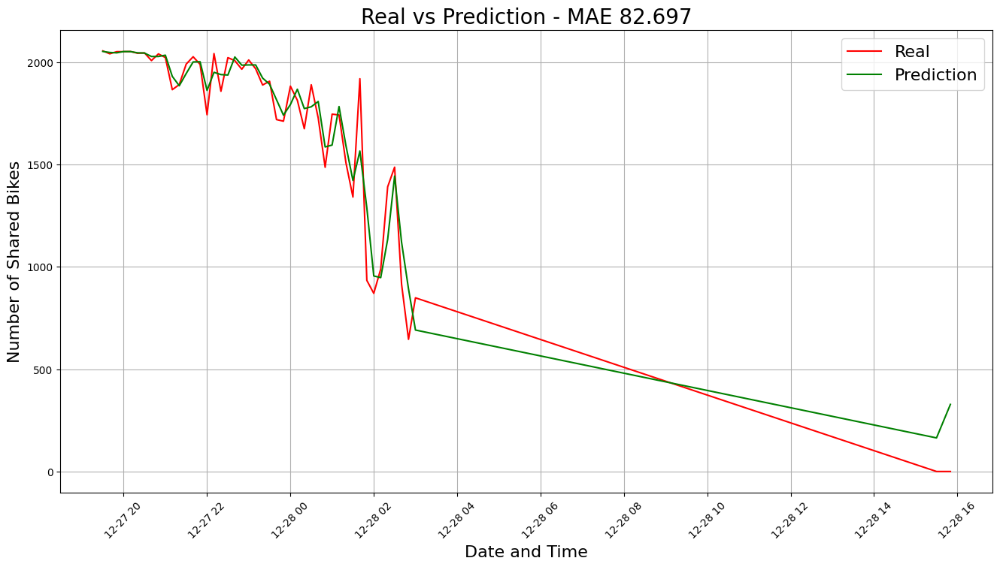

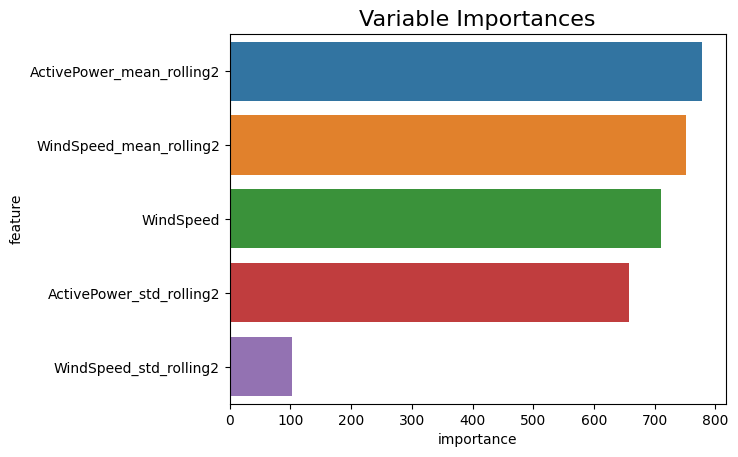

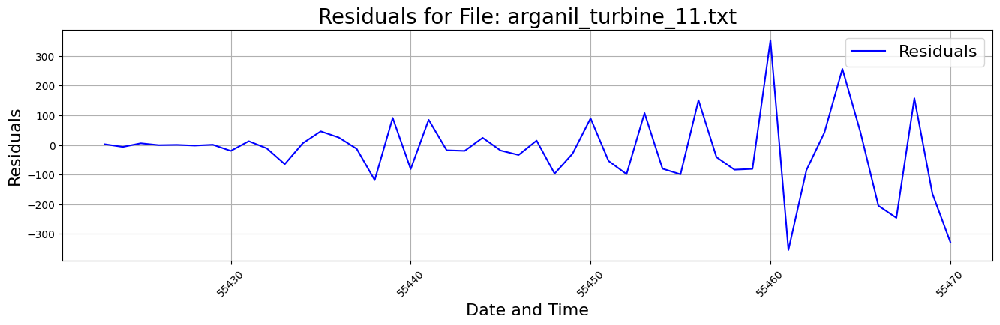

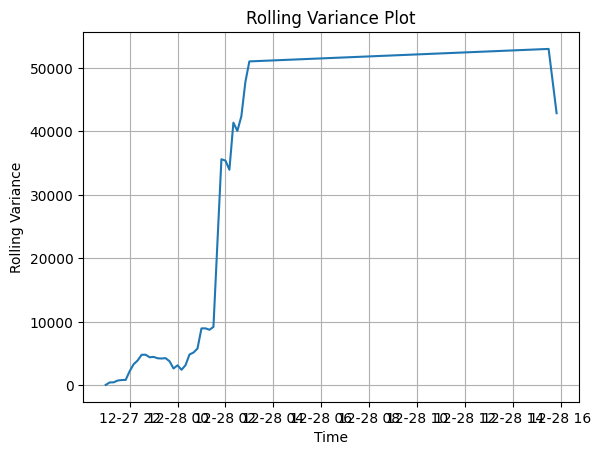

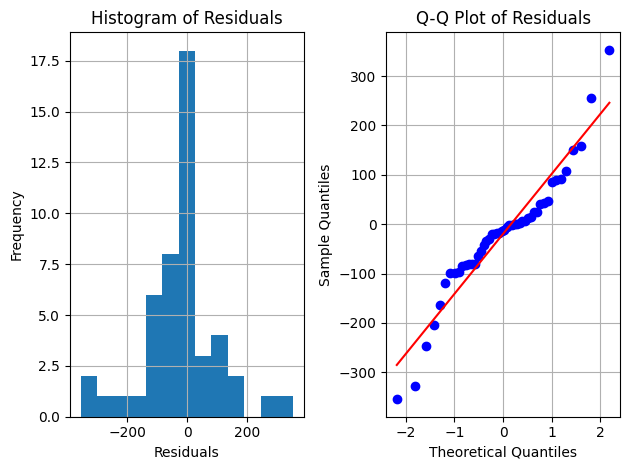

File: arganil_turbine_12.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55900, number of used features: 5
[LightGBM] [Info] Start training from score 735.891165
Mean Absolute Error (MAE): 14.611
Mean Squared Error (MSE): 401.792
Mean Absolute Percentage Error (MAPE): 0.766%


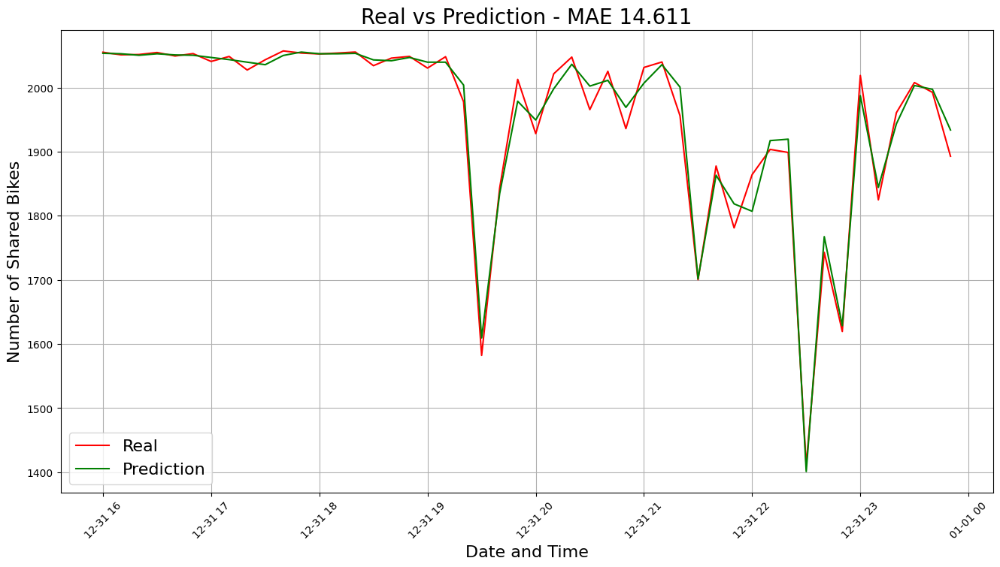

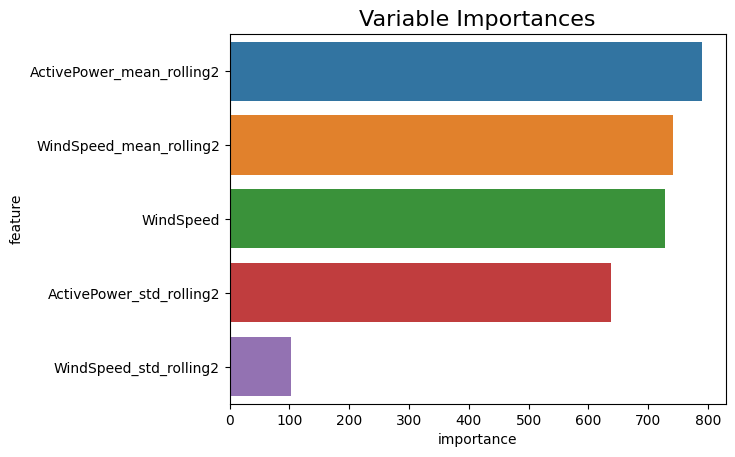

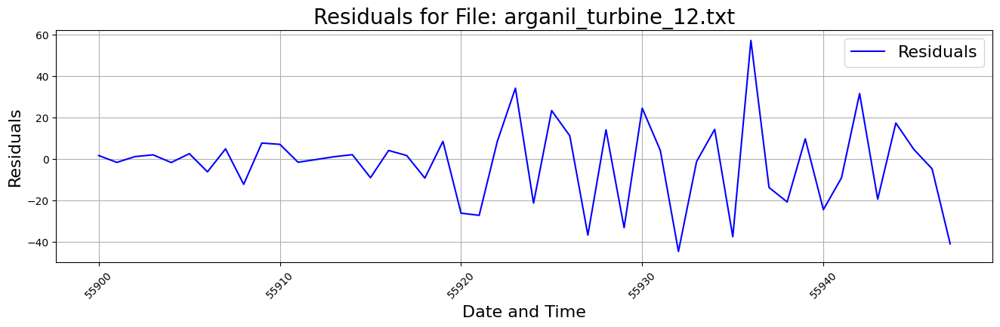

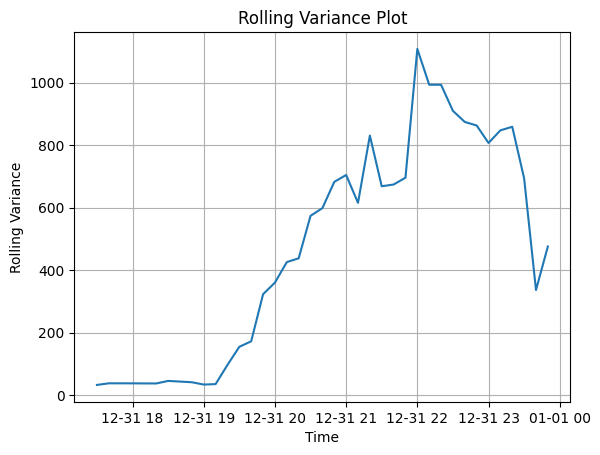

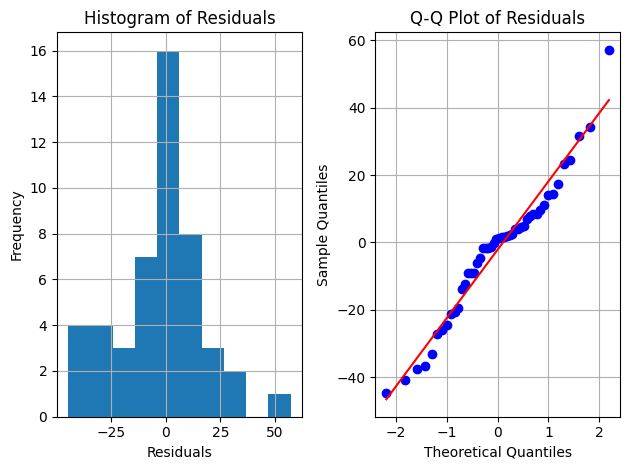

File: arganil_turbine_13.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55843, number of used features: 5
[LightGBM] [Info] Start training from score 739.722579
Mean Absolute Error (MAE): 16.028
Mean Squared Error (MSE): 425.596
Mean Absolute Percentage Error (MAPE): 0.847%


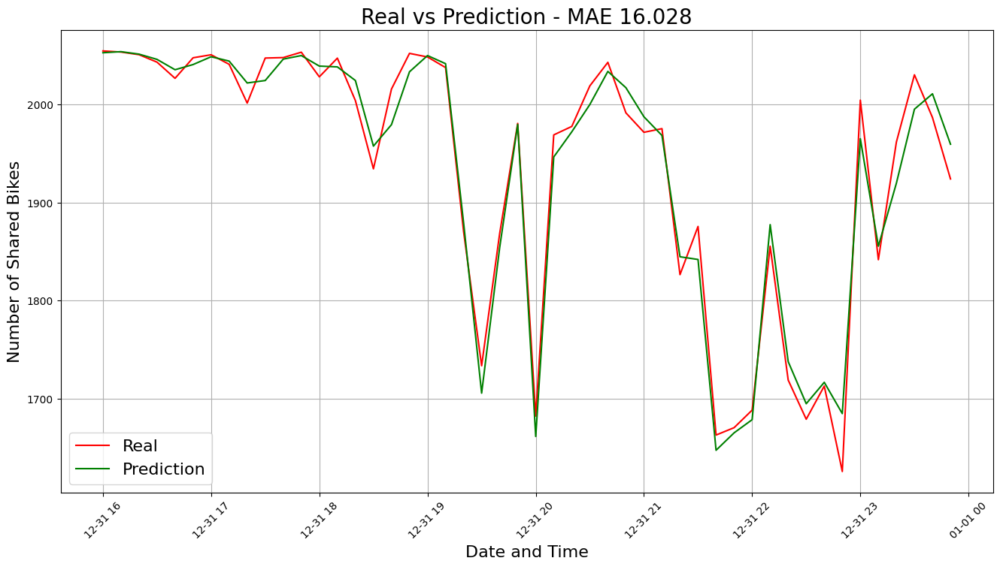

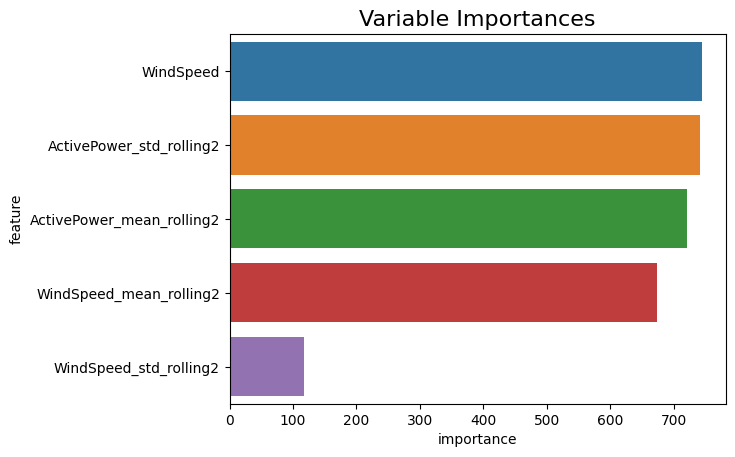

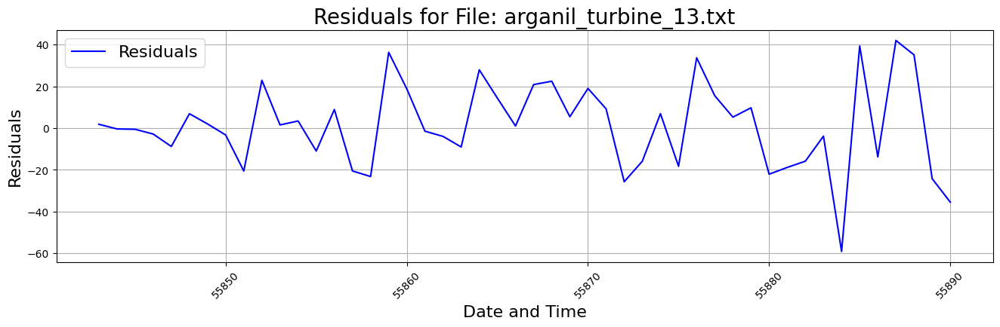

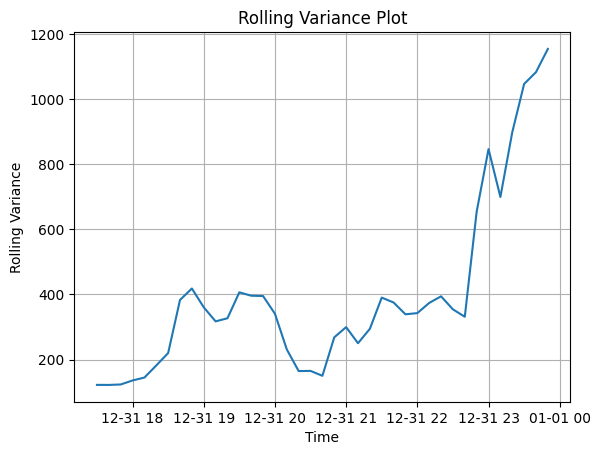

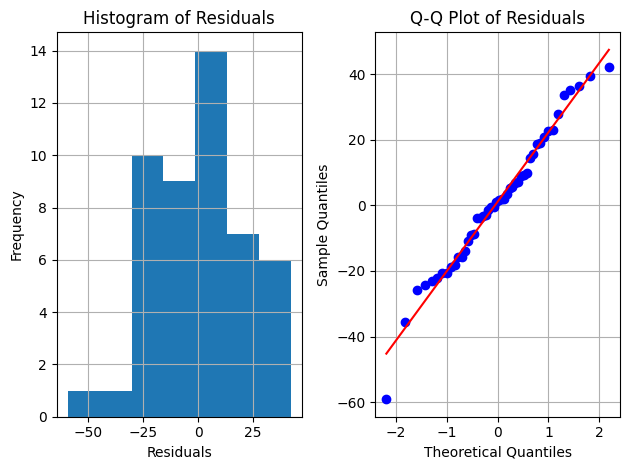

File: arganil_turbine_14.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56195, number of used features: 5
[LightGBM] [Info] Start training from score 757.672457
Mean Absolute Error (MAE): 21.366
Mean Squared Error (MSE): 912.668
Mean Absolute Percentage Error (MAPE): 1.177%


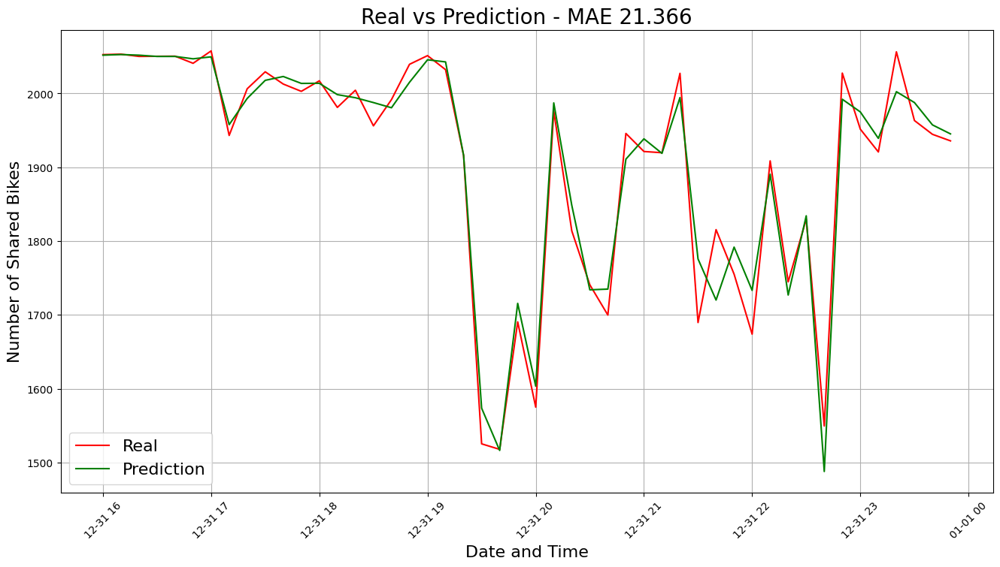

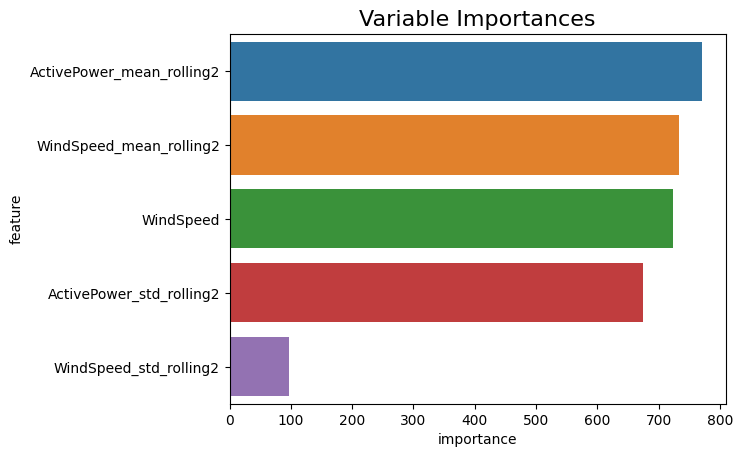

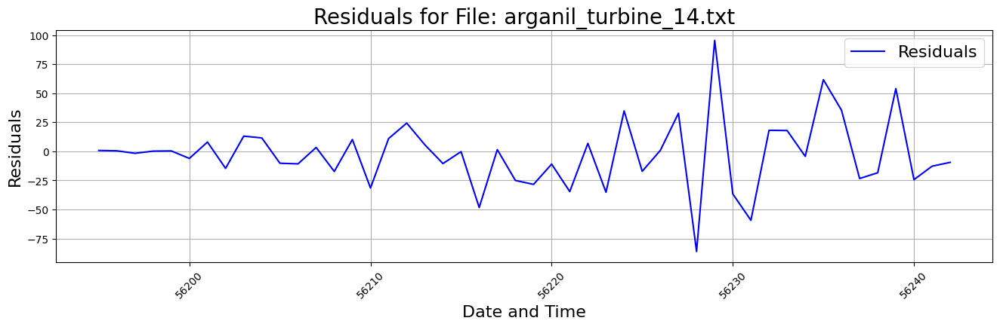

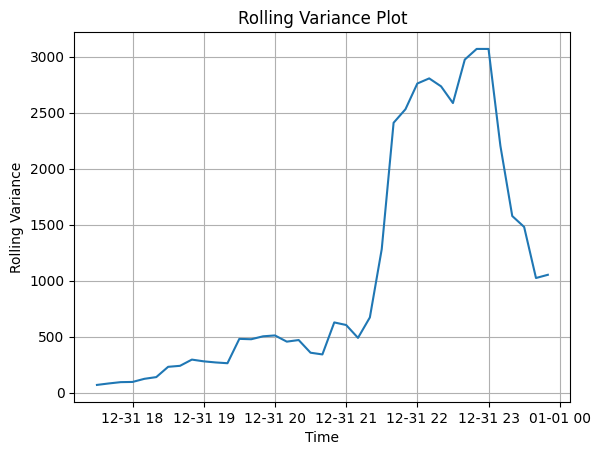

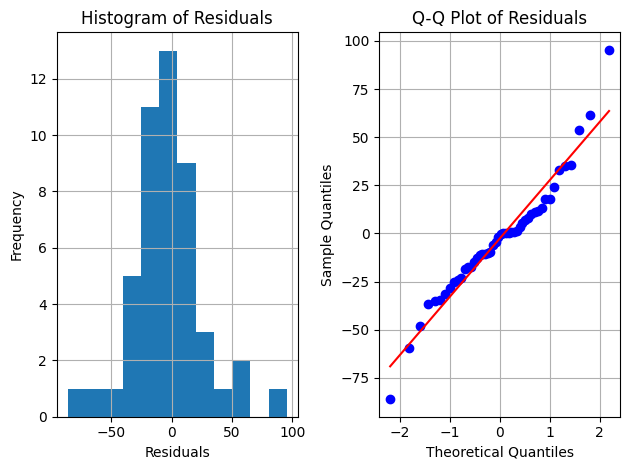

File: arganil_turbine_15.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56359, number of used features: 5
[LightGBM] [Info] Start training from score 762.194336
Mean Absolute Error (MAE): 14.658
Mean Squared Error (MSE): 378.888
Mean Absolute Percentage Error (MAPE): 0.754%


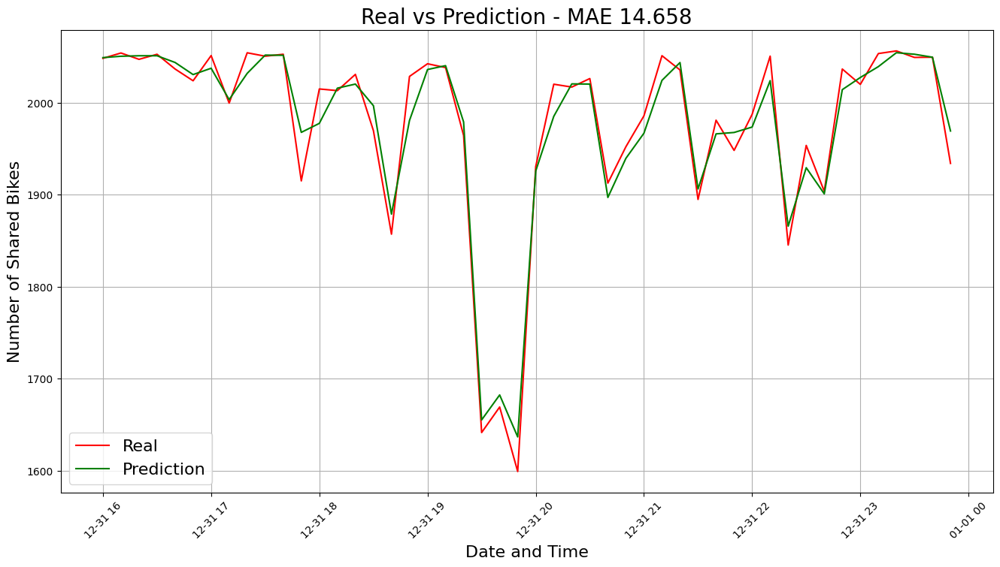

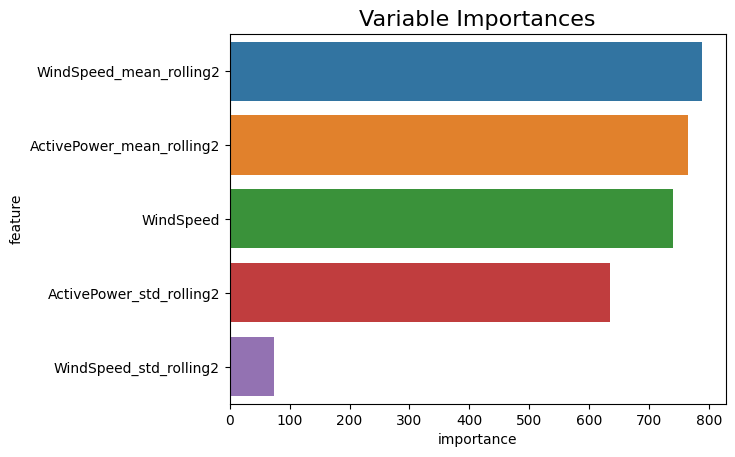

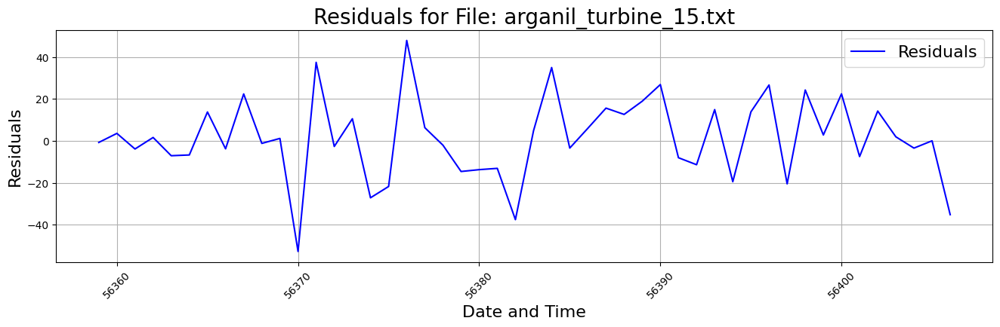

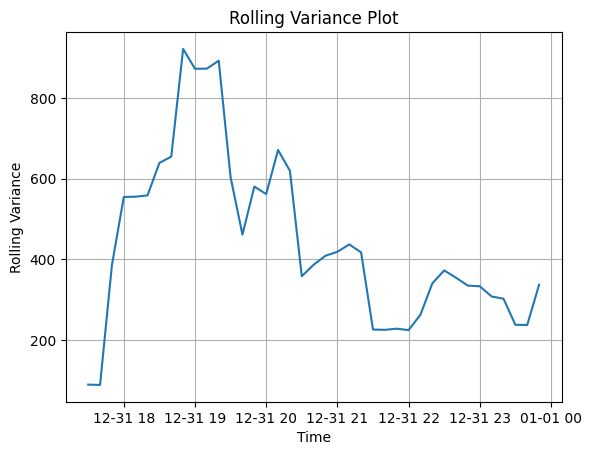

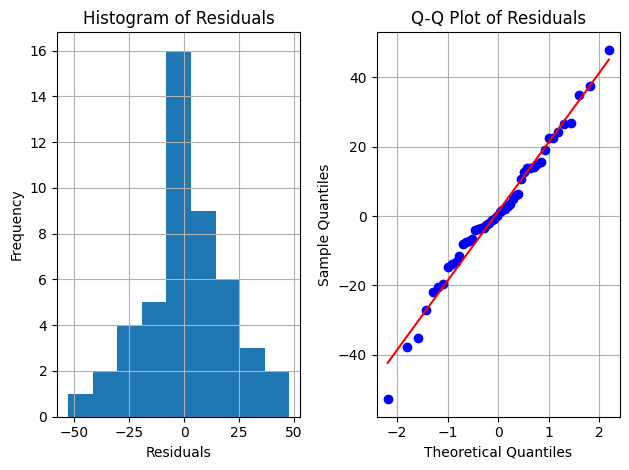

File: arganil_turbine_16.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56116, number of used features: 5
[LightGBM] [Info] Start training from score 791.385402
Mean Absolute Error (MAE): 17.413
Mean Squared Error (MSE): 505.756
Mean Absolute Percentage Error (MAPE): 0.877%


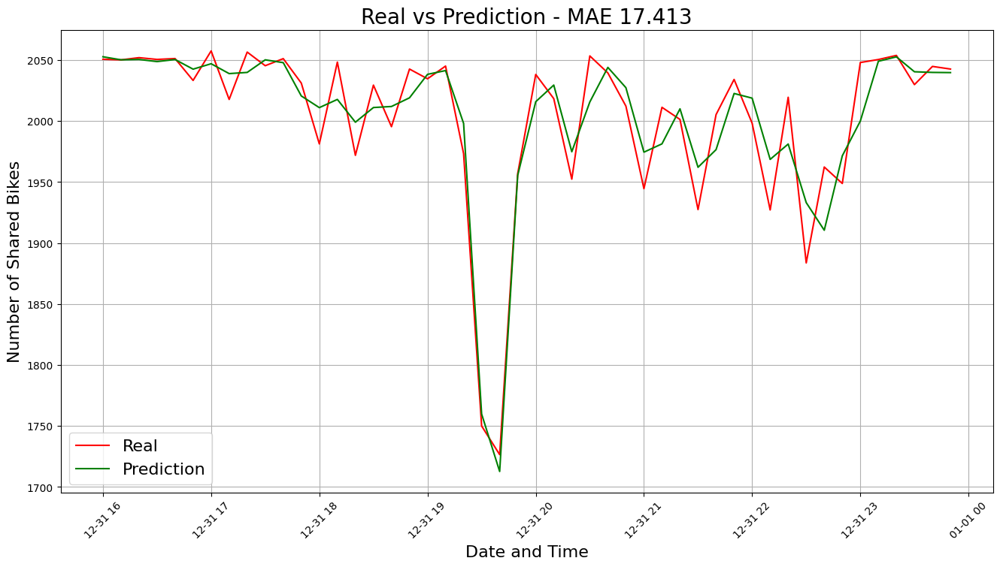

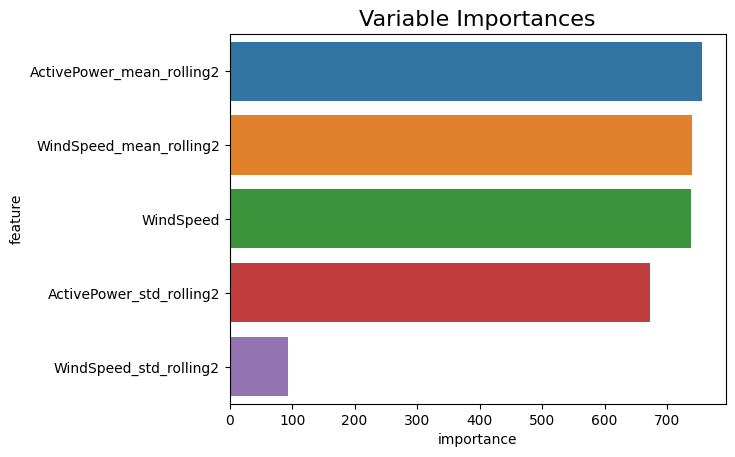

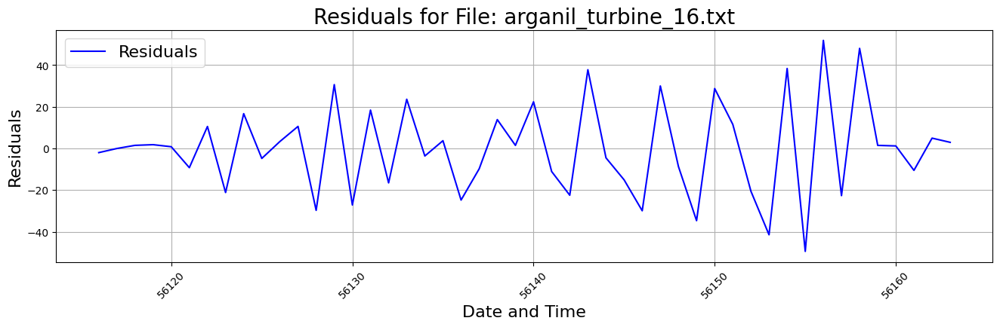

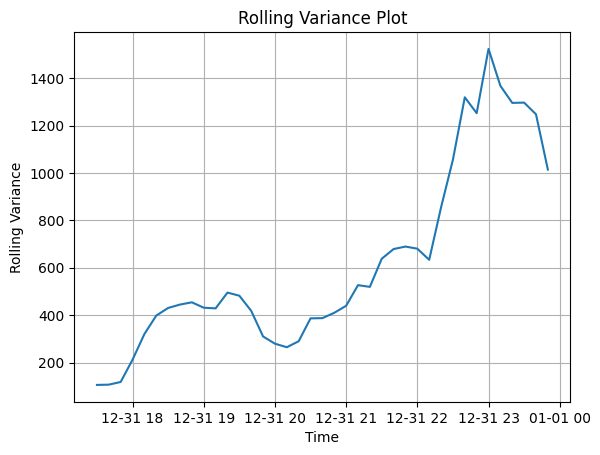

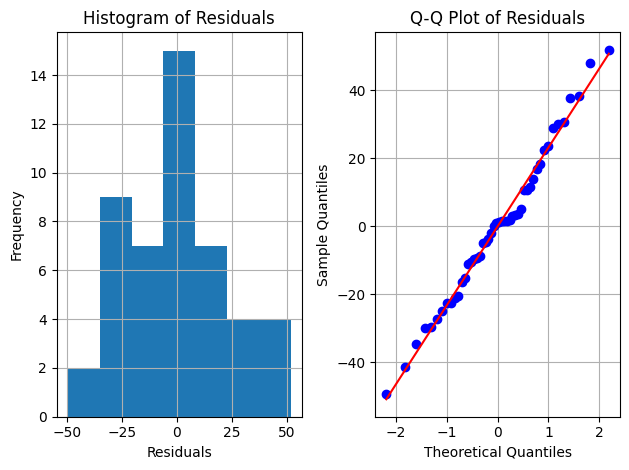

File: arganil_turbine_17.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55611, number of used features: 5
[LightGBM] [Info] Start training from score 783.551221
Mean Absolute Error (MAE): 27.191
Mean Squared Error (MSE): 2243.717
Mean Absolute Percentage Error (MAPE): 1.465%


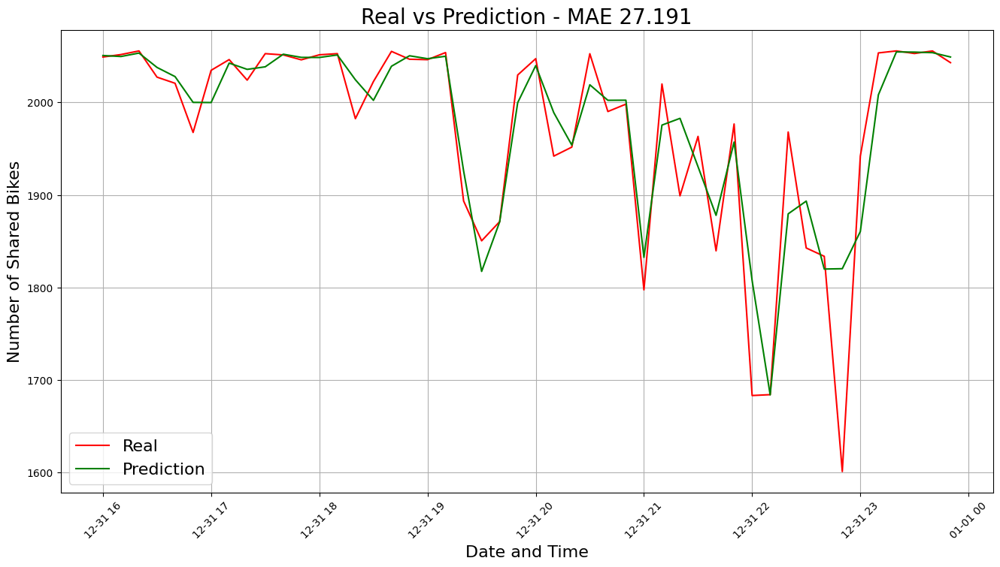

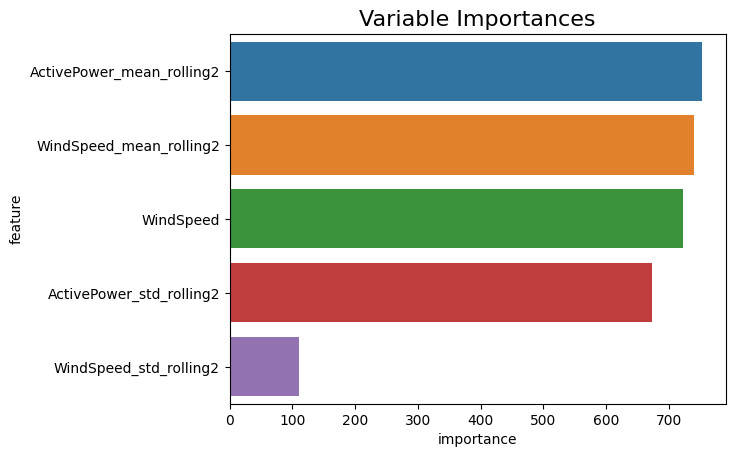

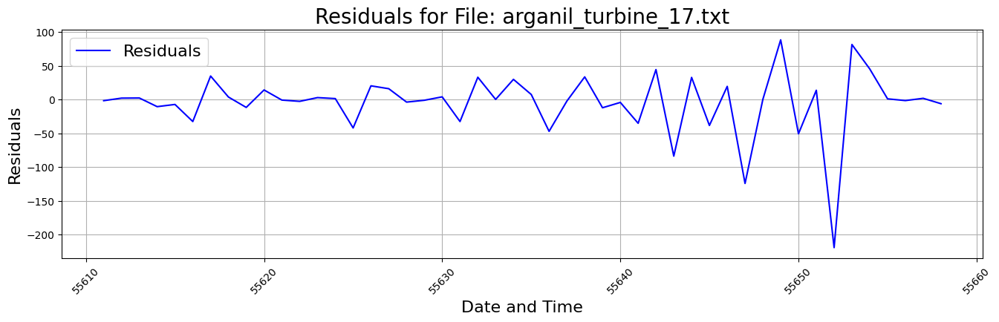

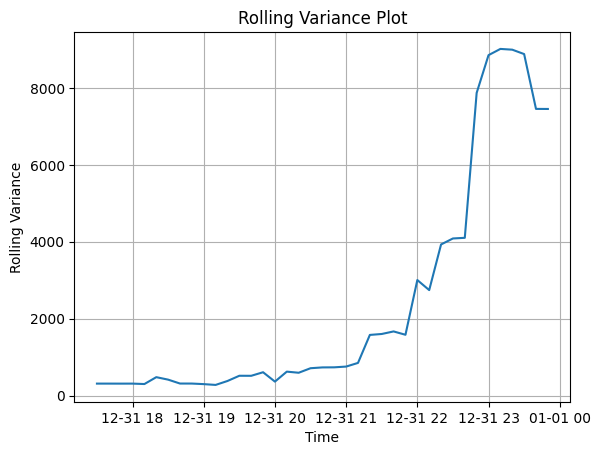

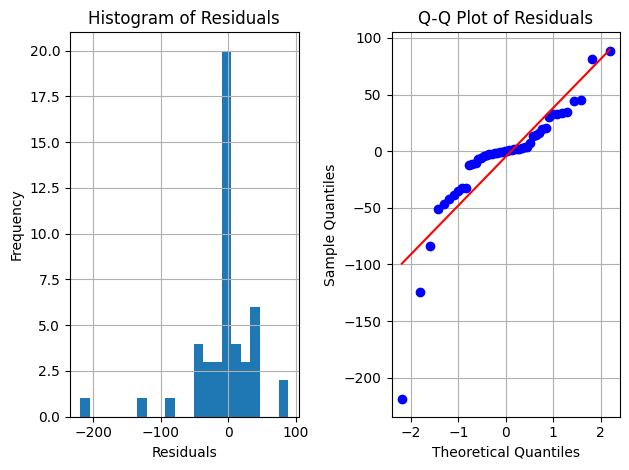

File: arganil_turbine_18.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55002, number of used features: 5
[LightGBM] [Info] Start training from score 731.746295
Mean Absolute Error (MAE): 26.059
Mean Squared Error (MSE): 1864.203
Mean Absolute Percentage Error (MAPE): 1.54%


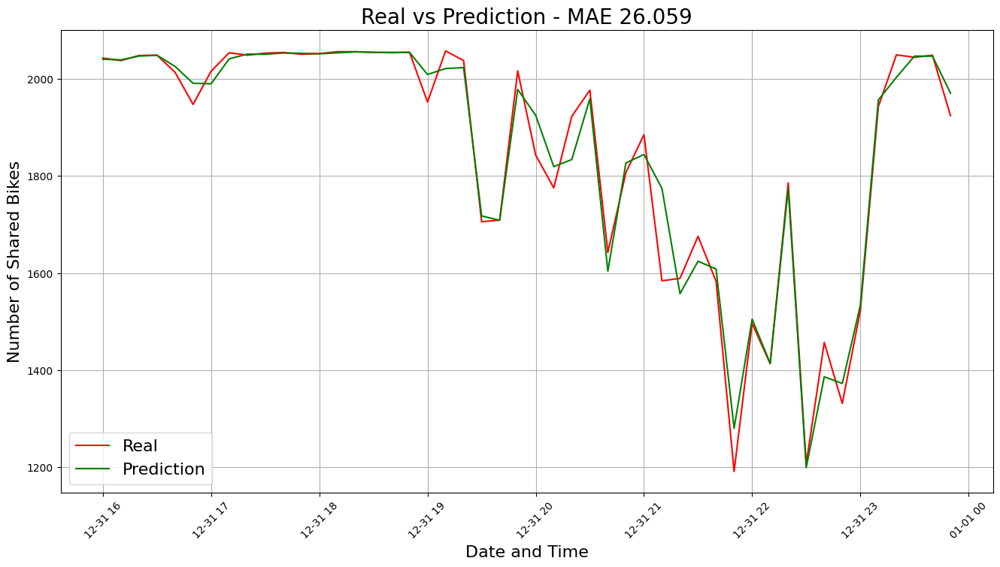

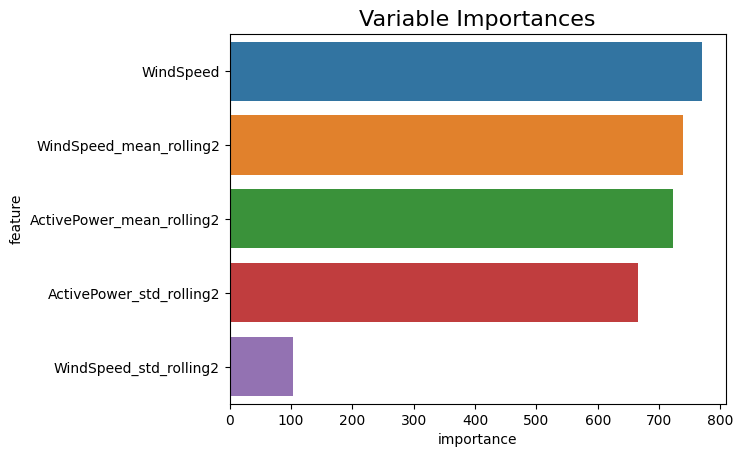

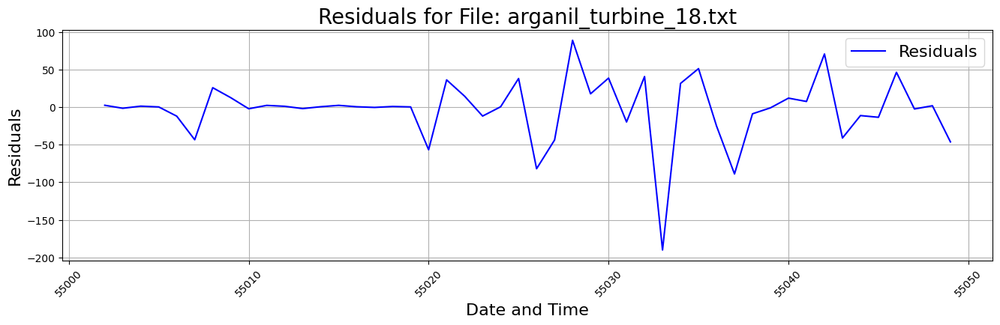

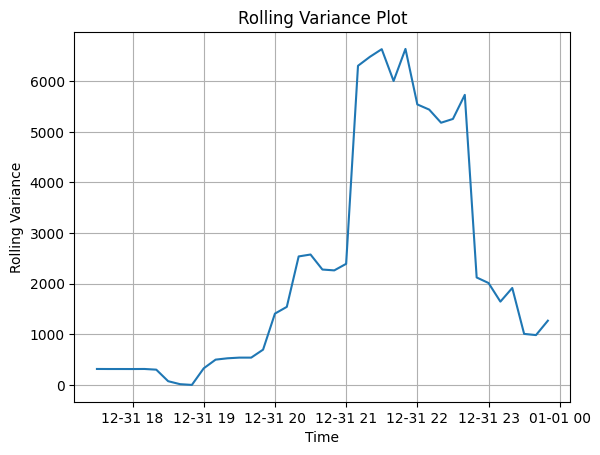

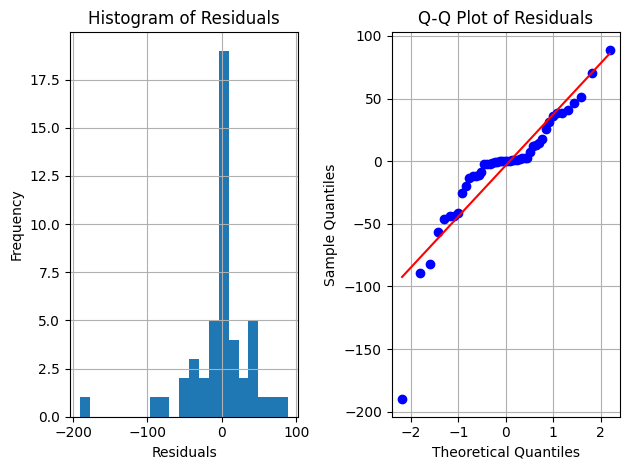

File: arganil_turbine_2.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 54786, number of used features: 5
[LightGBM] [Info] Start training from score 783.069503
Mean Absolute Error (MAE): 17.224
Mean Squared Error (MSE): 503.638
Mean Absolute Percentage Error (MAPE): 0.863%


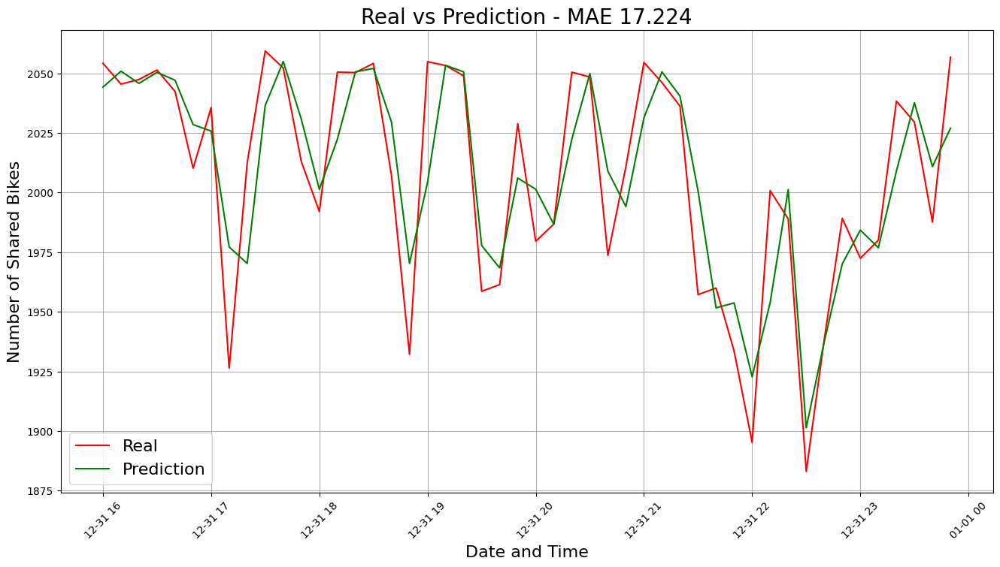

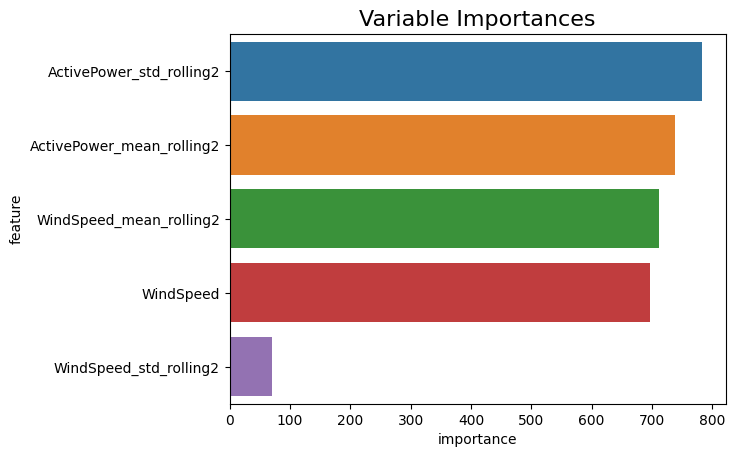

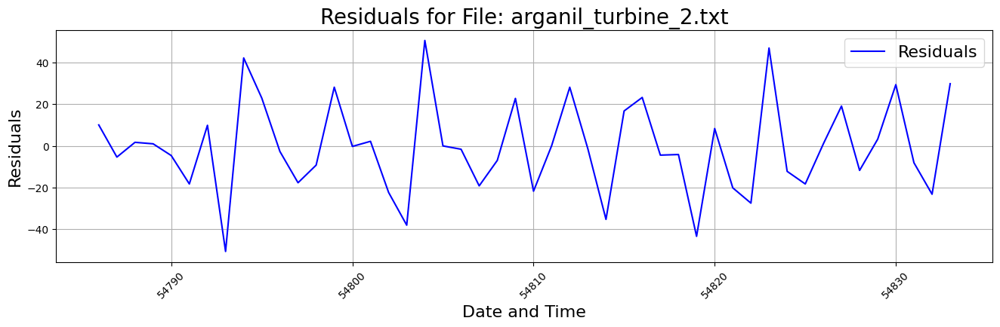

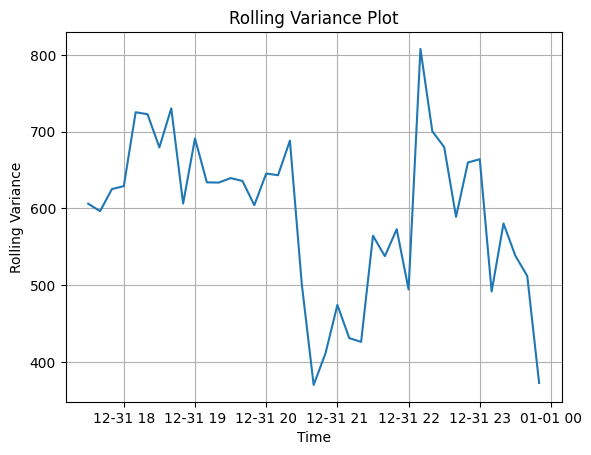

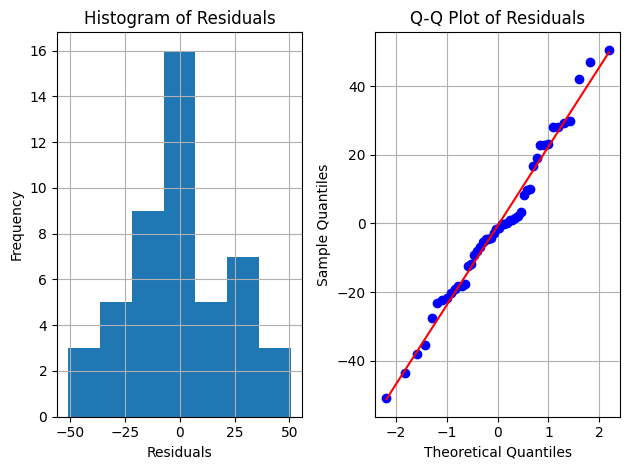

File: arganil_turbine_3.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 54931, number of used features: 5
[LightGBM] [Info] Start training from score 792.631686
Mean Absolute Error (MAE): 95.618
Mean Squared Error (MSE): 22393.582
Mean Absolute Percentage Error (MAPE): 9.221%


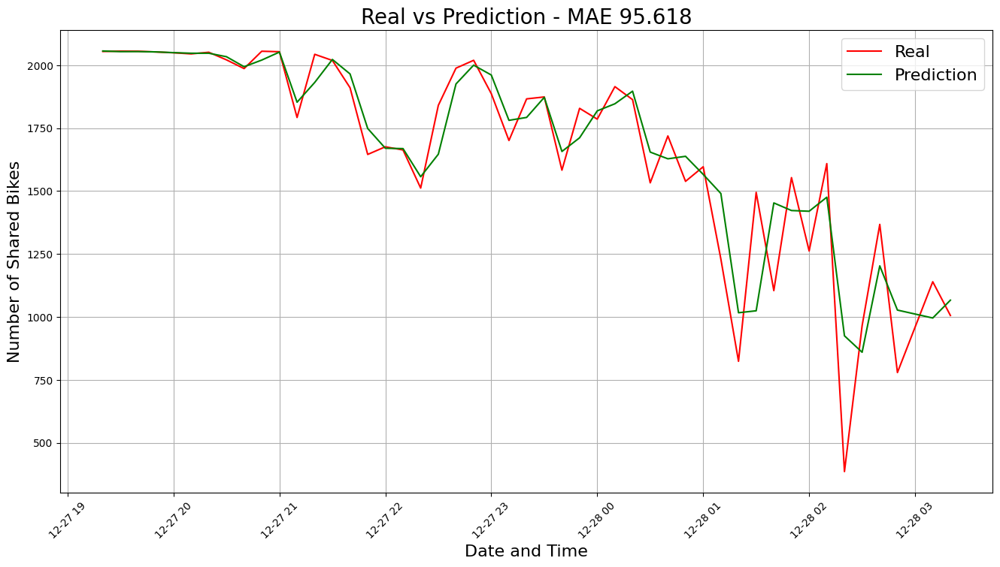

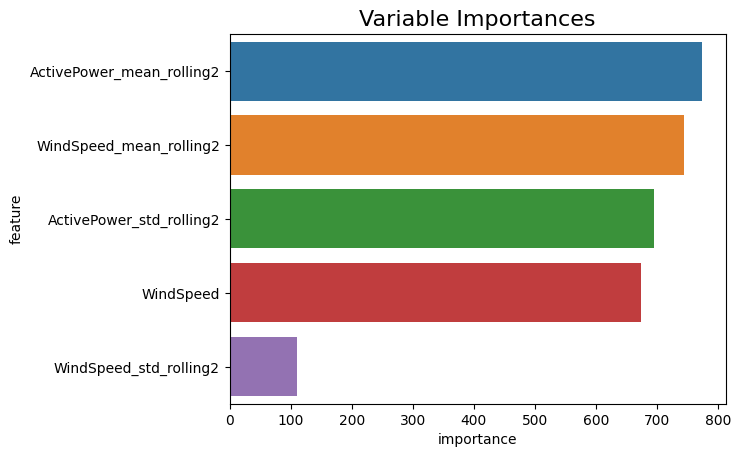

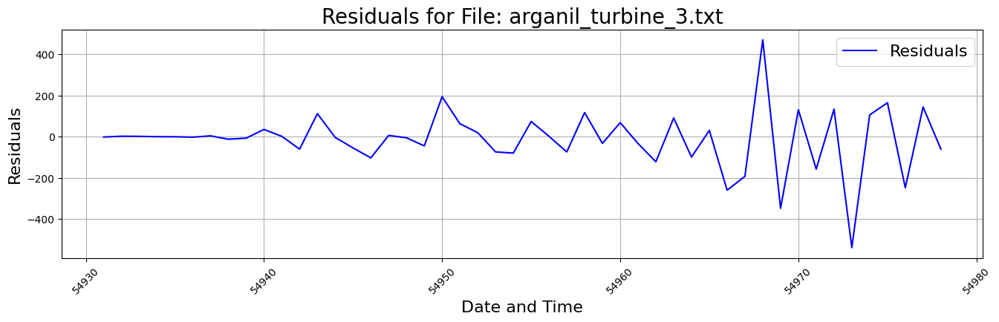

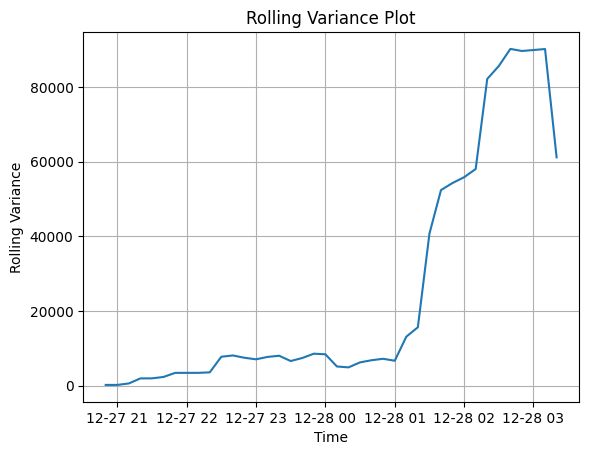

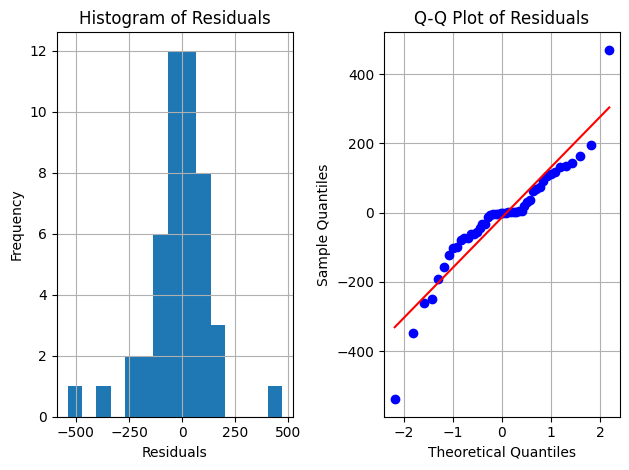

File: arganil_turbine_4.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55514, number of used features: 5
[LightGBM] [Info] Start training from score 783.374509
Mean Absolute Error (MAE): 92.795
Mean Squared Error (MSE): 17246.596
Mean Absolute Percentage Error (MAPE): 11.517%


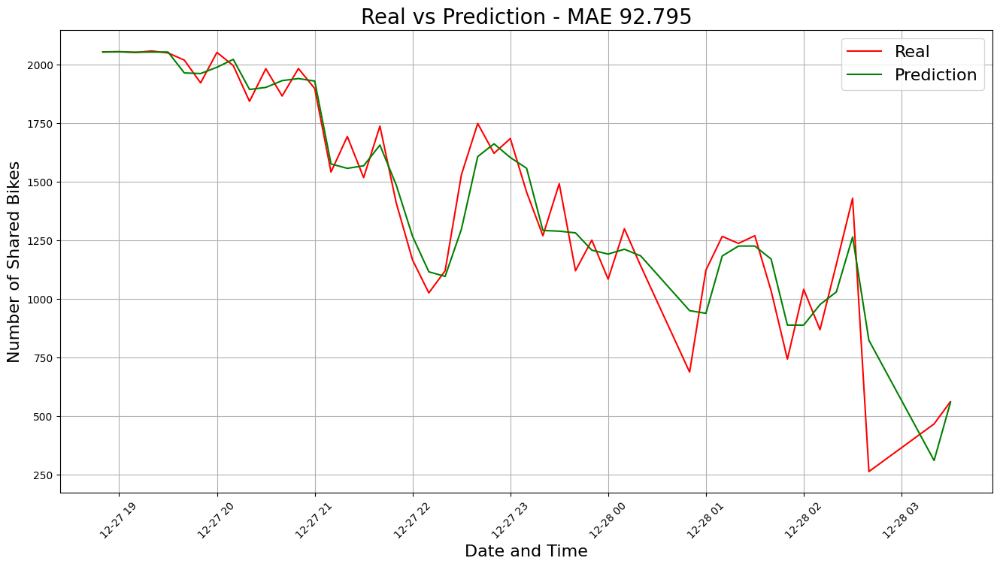

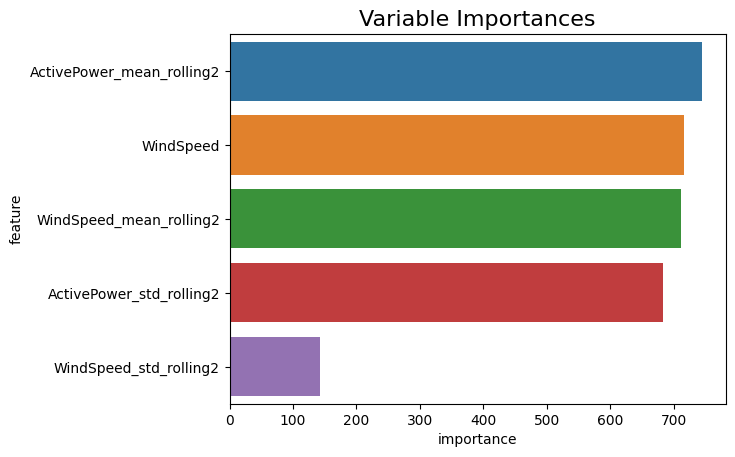

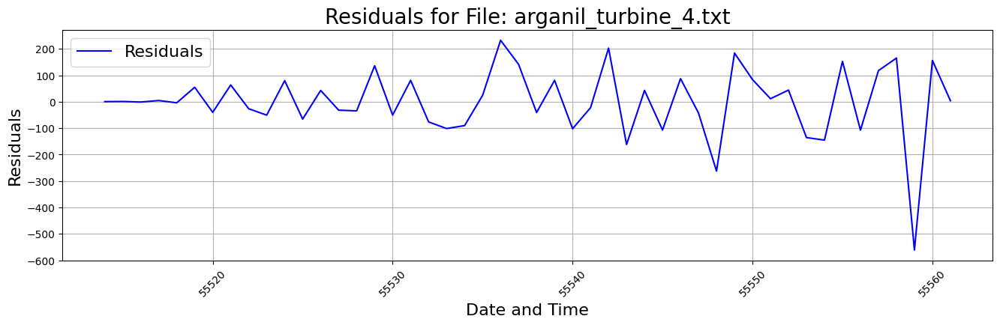

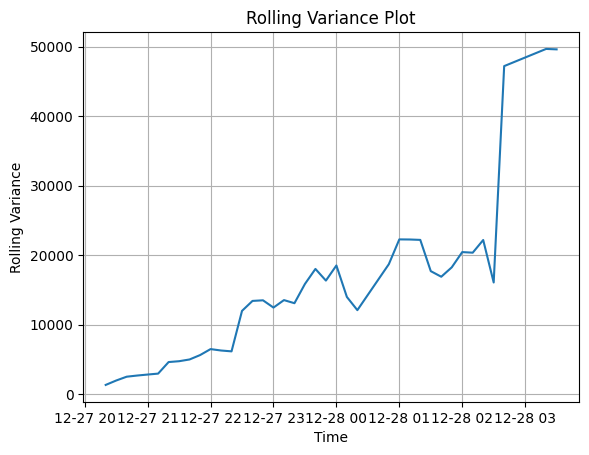

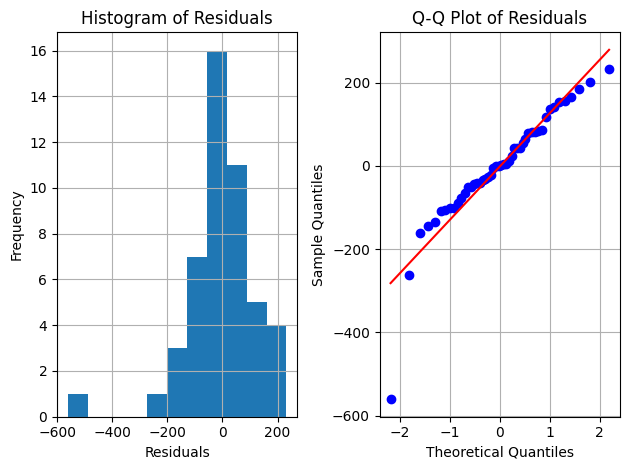

File: arganil_turbine_5.txt
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55420, number of used features: 5
[LightGBM] [Info] Start training from score 748.531950
Mean Absolute Error (MAE): 102.558
Mean Squared Error (MSE): 22293.972
Mean Absolute Percentage Error (MAPE): 19.363%


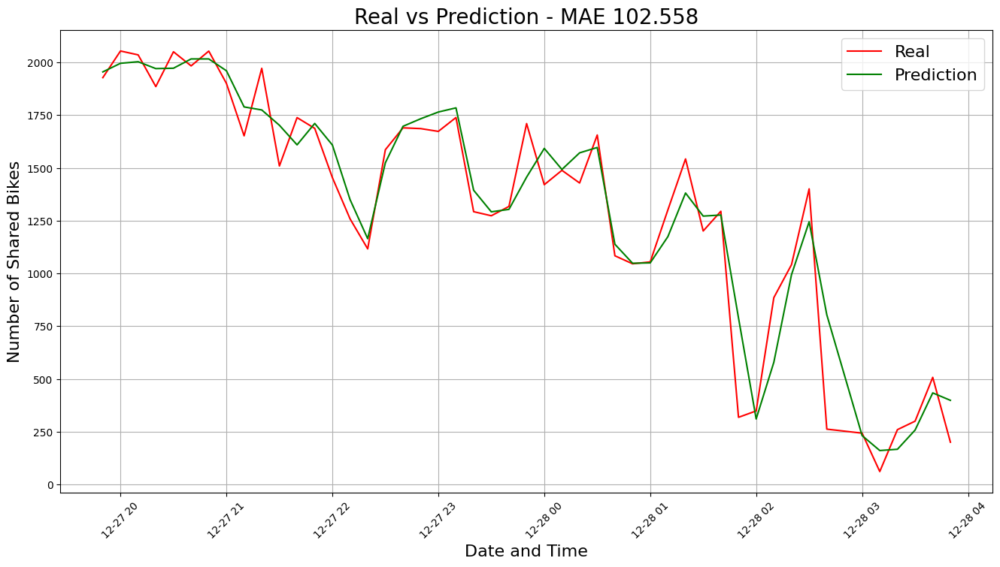

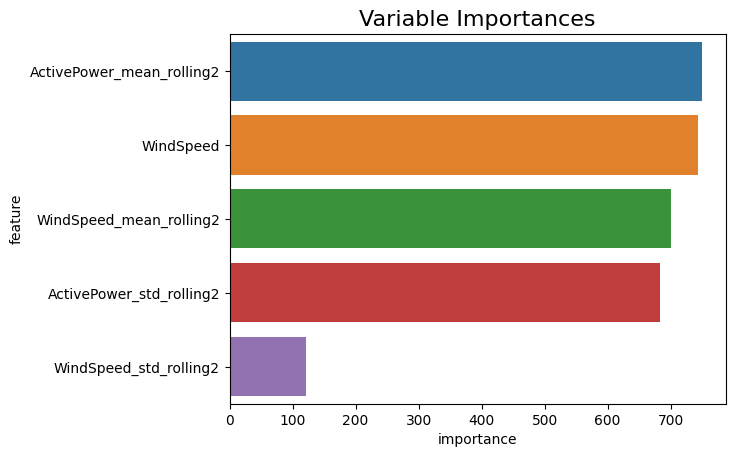

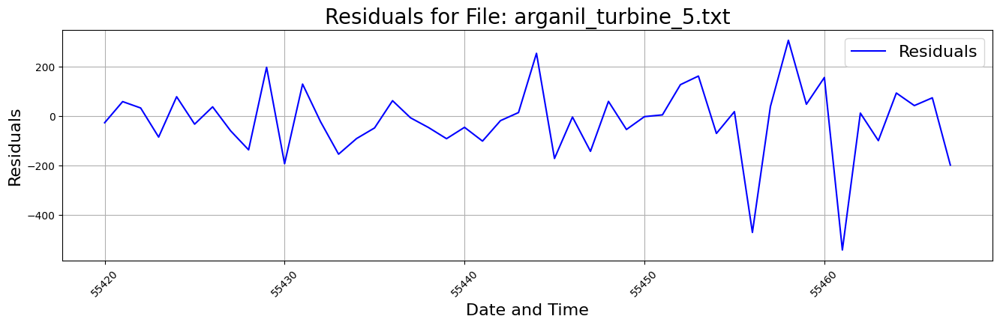

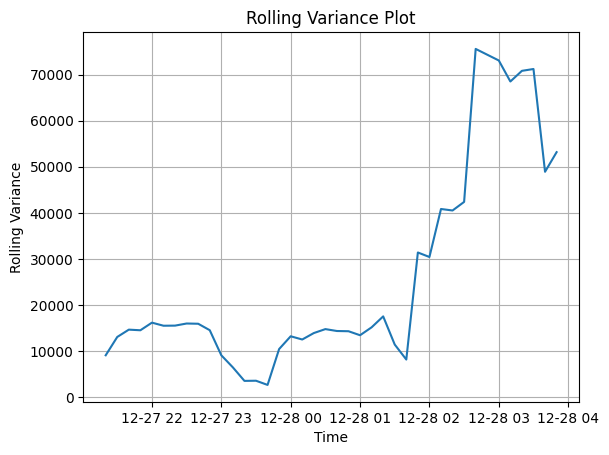

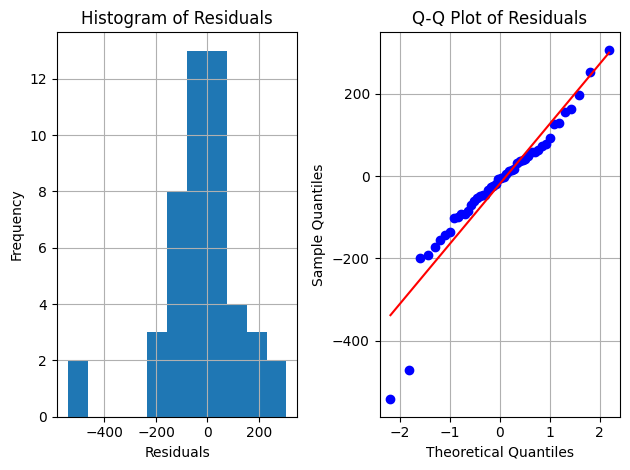

File: arganil_turbine_6.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55635, number of used features: 5
[LightGBM] [Info] Start training from score 736.620922
Mean Absolute Error (MAE): 75.734
Mean Squared Error (MSE): 18073.816
Mean Absolute Percentage Error (MAPE): 15.614%


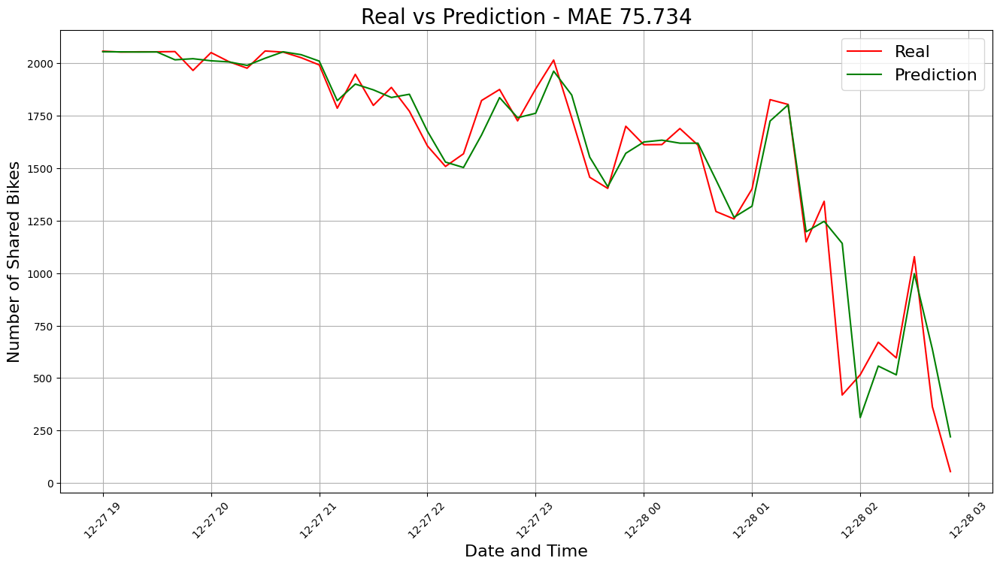

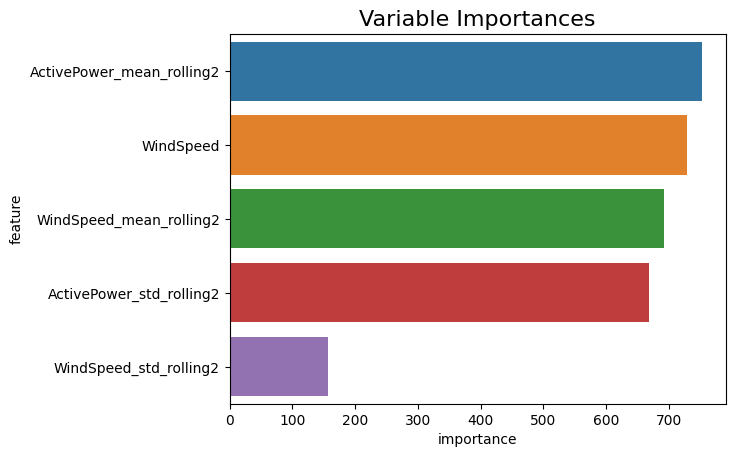

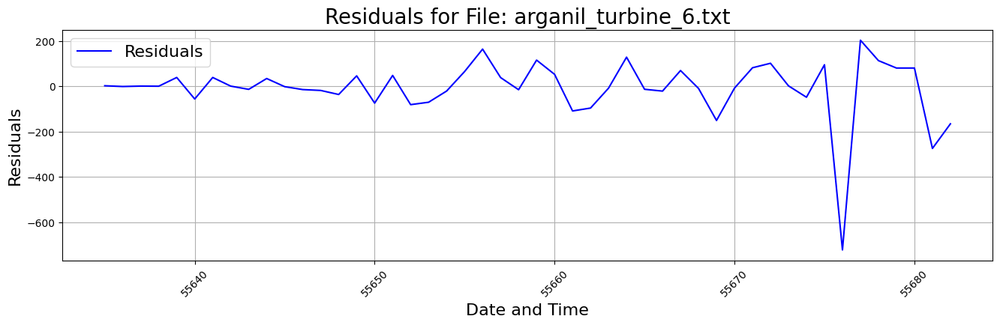

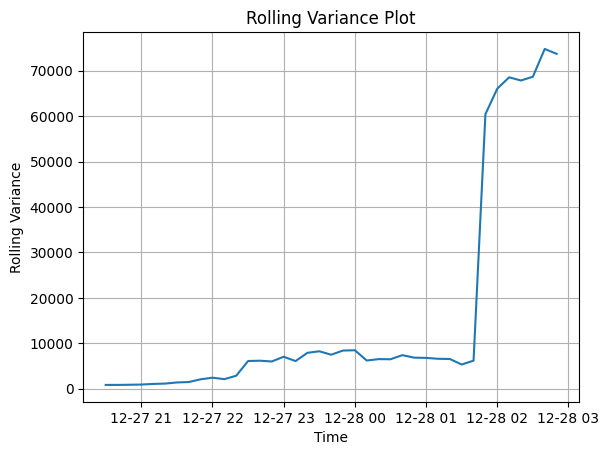

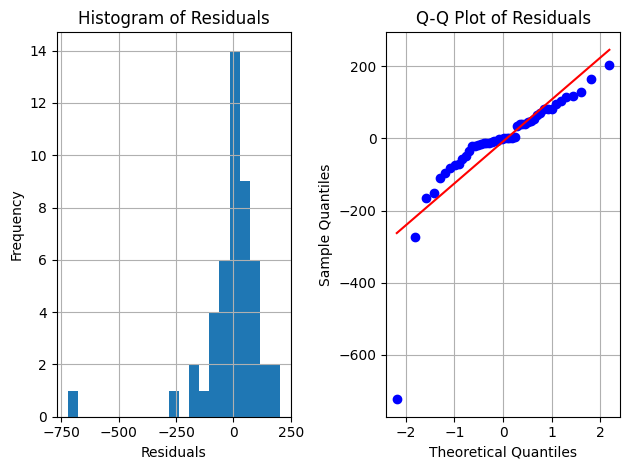

File: arganil_turbine_7.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55643, number of used features: 5
[LightGBM] [Info] Start training from score 718.891073
Mean Absolute Error (MAE): 45.082
Mean Squared Error (MSE): 14488.372
Mean Absolute Percentage Error (MAPE): 4.814%


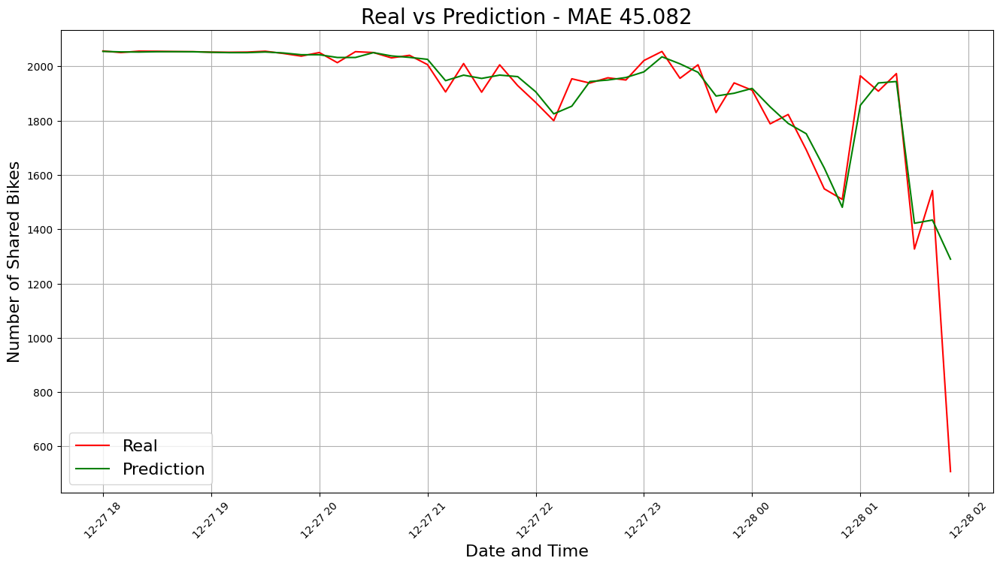

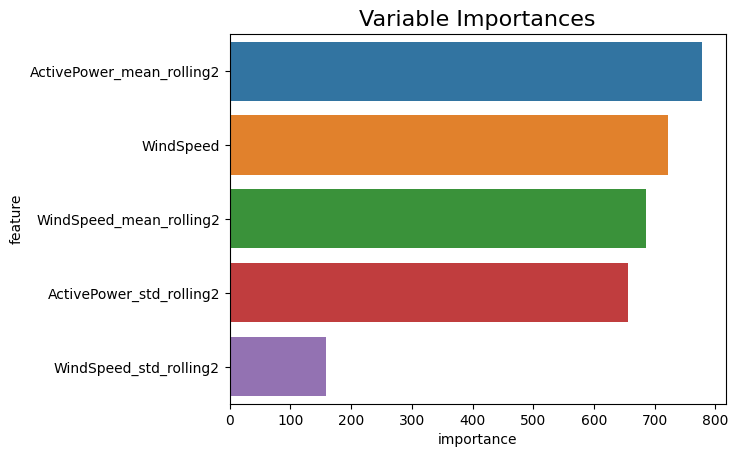

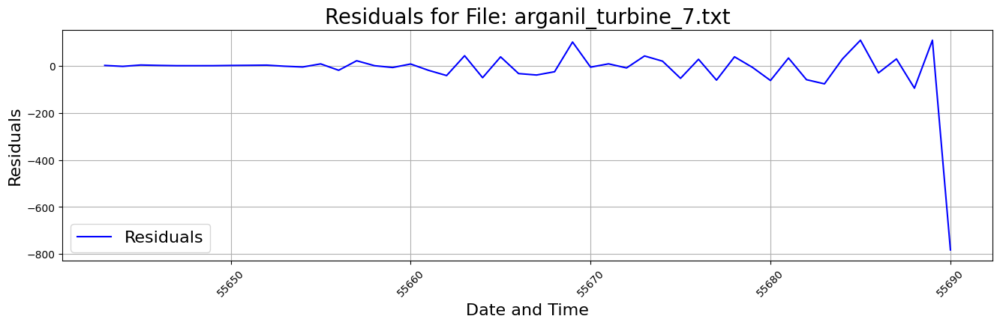

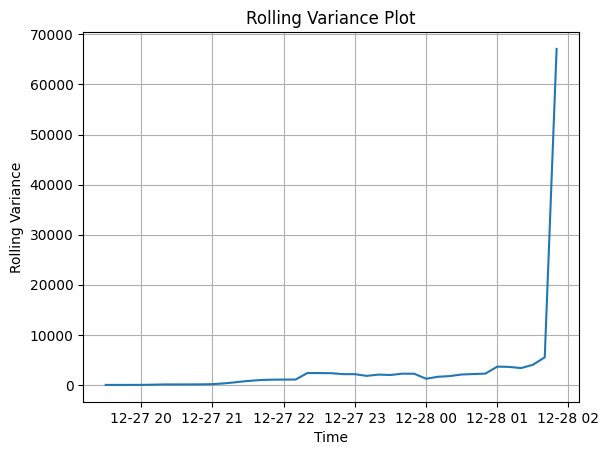

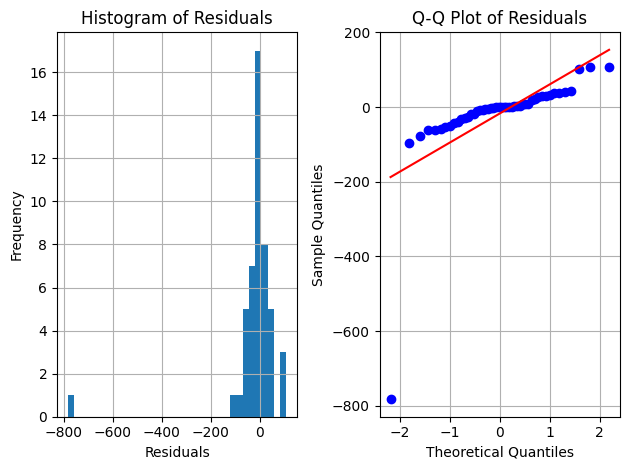

File: arganil_turbine_8.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 55523, number of used features: 5
[LightGBM] [Info] Start training from score 708.998140
Mean Absolute Error (MAE): 18.46
Mean Squared Error (MSE): 859.466
Mean Absolute Percentage Error (MAPE): 0.94%


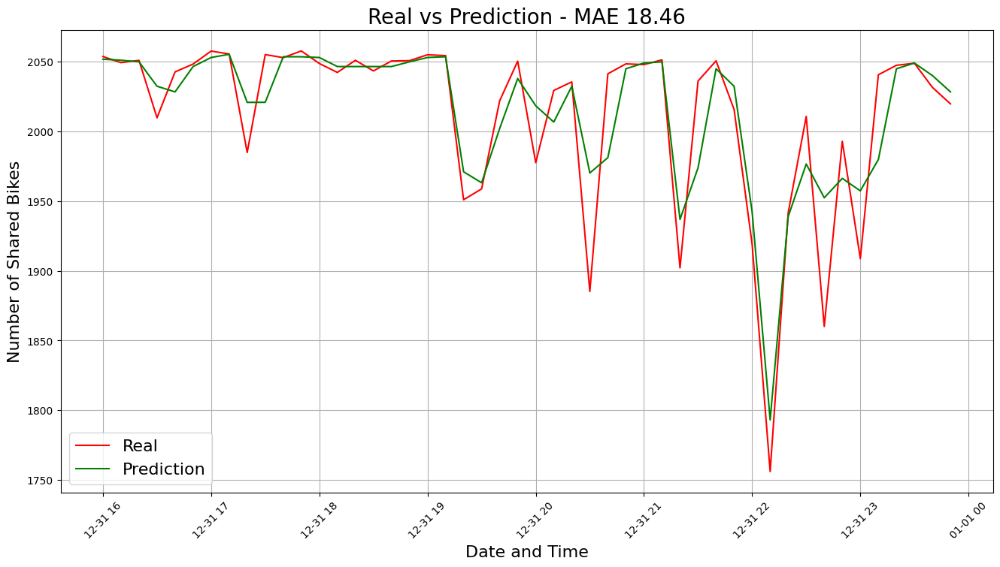

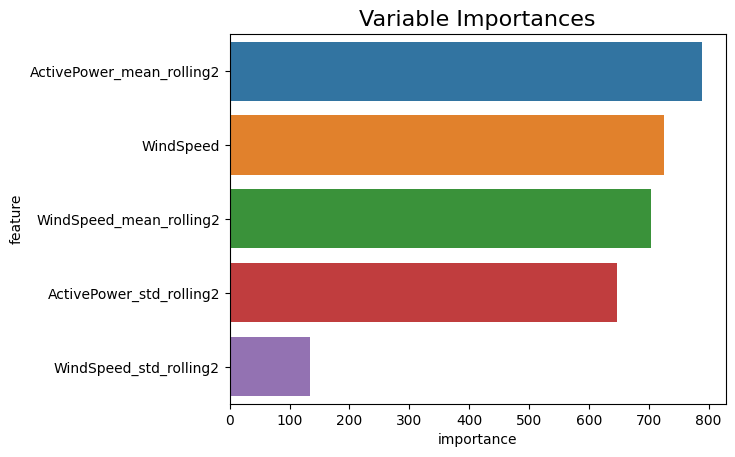

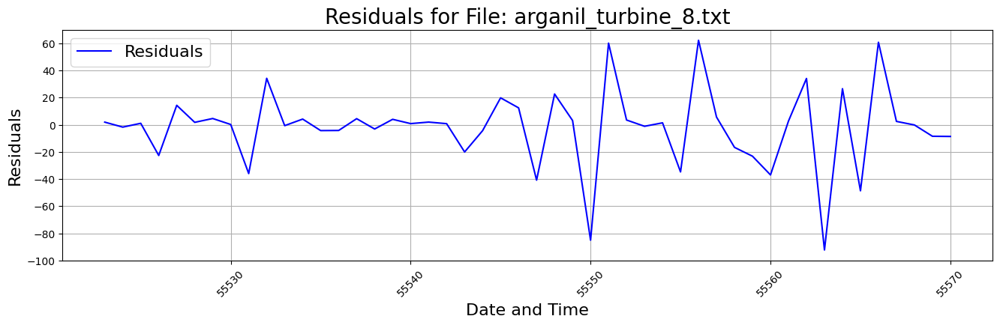

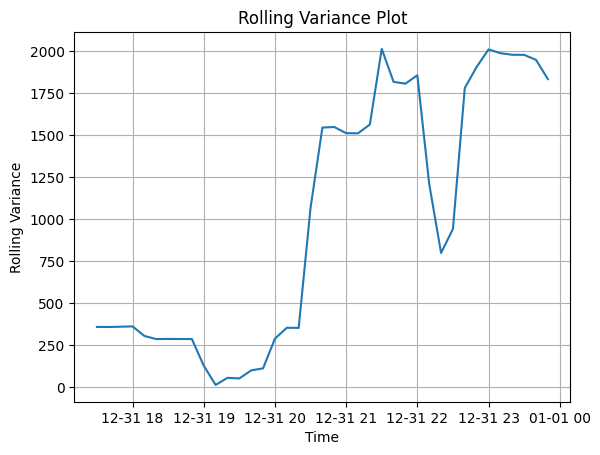

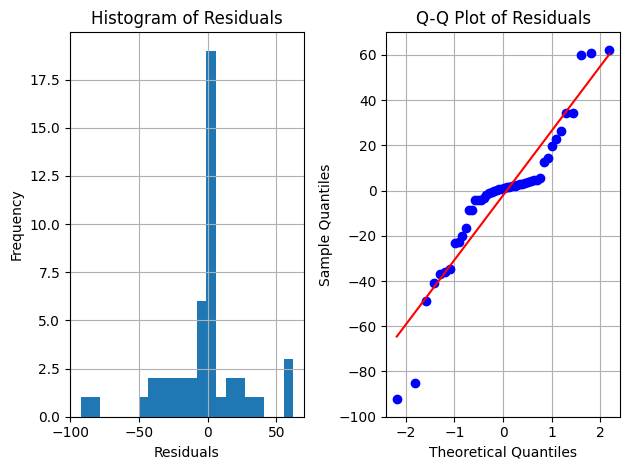

File: arganil_turbine_9.txt
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 56125, number of used features: 5
[LightGBM] [Info] Start training from score 691.638510
Mean Absolute Error (MAE): 19.761
Mean Squared Error (MSE): 830.978
Mean Absolute Percentage Error (MAPE): 1.034%


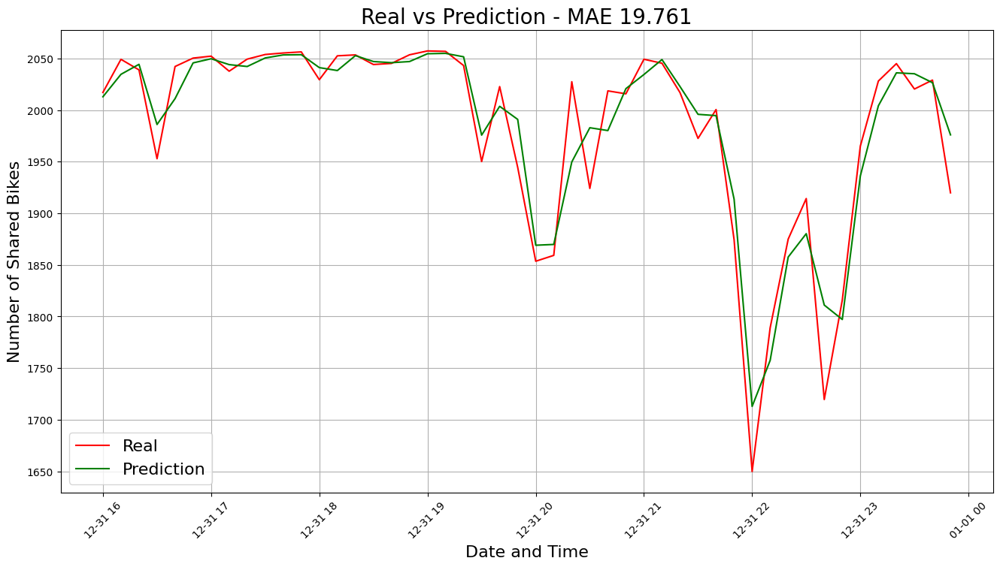

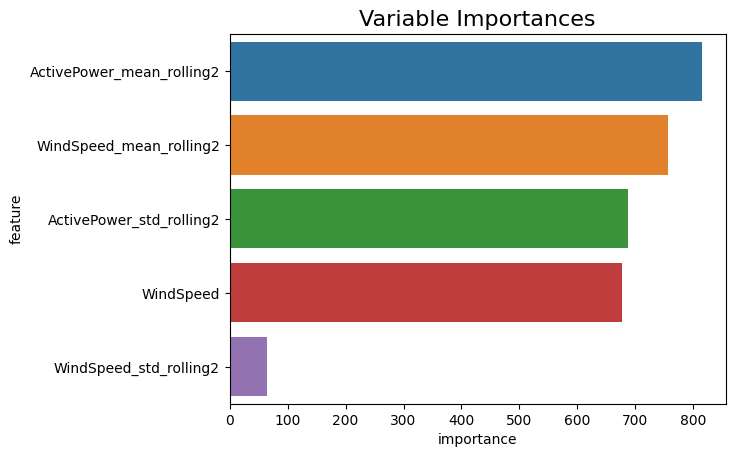

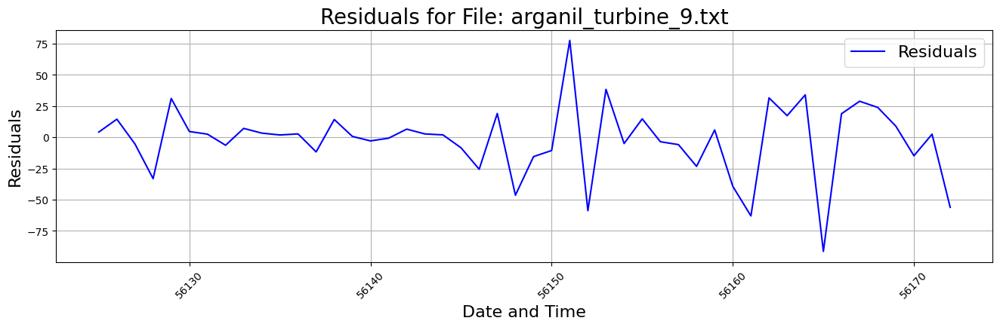

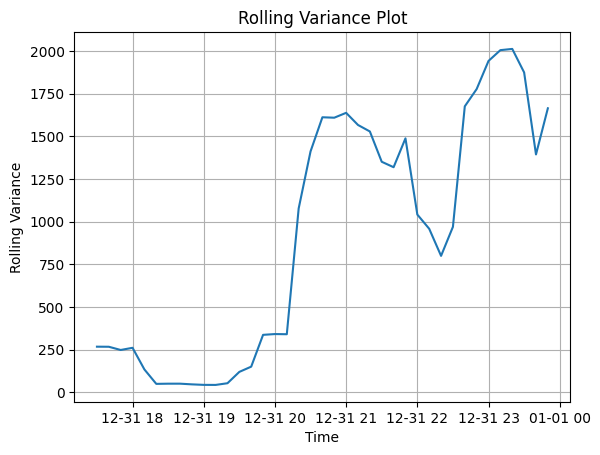

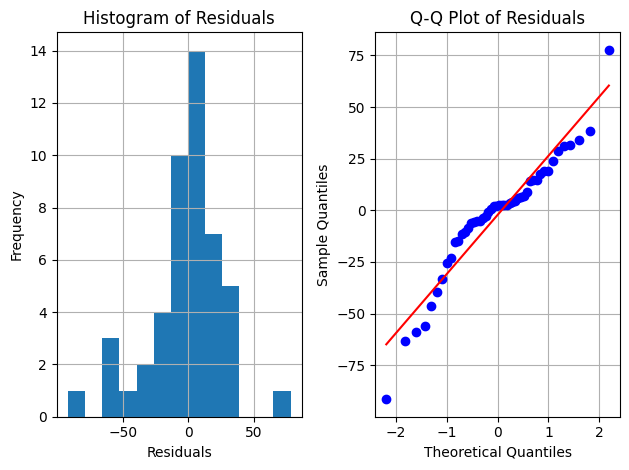

In [94]:
def analyze_residuals_in_files(folder_path, horizon=48):
    # Initialize lists to store residuals and file names
    residuals_list = []
    files_list = []

    # Get a list of all files in the folder
    files = os.listdir(folder_path)

    # Loop through each file in the folder
    for file in files:
        # Check if the file is a txt file
        if file.endswith(".txt"):
            # Read the file as a DataFrame
            file_path = os.path.join(folder_path, file)
            df = pd.read_csv(file_path, sep='\t')

            # Print the file name
            print(f"File: {file}")

            # Call the train_time_series_with_folds function for the current DataFrame
            _, _, _, predictions, residuals = train_time_series_with_folds(df, horizon)

            # Store residuals in the residuals_list
            residuals_list.append(residuals)
            # Store the file name in the files_list
            files_list.append(file)

            # Plot the residuals
            fig, ax = plt.subplots(figsize=(16, 4))
            plt.plot(df.index[-horizon:], residuals, color='blue', label='Residuals')
            plt.xlabel('Date and Time', fontsize=16)
            plt.ylabel('Residuals', fontsize=16)
            plt.title(f'Residuals for File: {file}', fontsize=20)
            plt.legend(fontsize=16)
            plt.grid()
            plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
            plt.show()

            # Convert the residuals to a pandas Series
            residuals_series = pd.Series(residuals)

            # Plotting a rolling variance to check for constant variance
            rolling_variance = residuals_series.rolling(window=10).var()
            plt.plot(rolling_variance)
            plt.xlabel('Time')
            plt.ylabel('Rolling Variance')
            plt.title('Rolling Variance Plot')
            plt.grid()
            plt.show()

            plt.subplot(1, 2, 1)
            plt.hist(residuals, bins='auto')
            plt.xlabel('Residuals')
            plt.ylabel('Frequency')
            plt.title('Histogram of Residuals')
            plt.grid()

            plt.subplot(1, 2, 2)
            stats.probplot(residuals, plot=plt)
            plt.xlabel('Theoretical Quantiles')
            plt.ylabel('Sample Quantiles')
            plt.title('Q-Q Plot of Residuals')
            plt.grid()

            plt.tight_layout()
            plt.show()

    # Return the residuals_list and files_list
    return residuals_list, files_list

# Call the function with the folder path and horizon
folder_path = ""
horizon = 48
residuals_list, files_list = analyze_residuals_in_files(folder_path, horizon)
